In [1]:
import numpy as np
import cv2
import os
import pandas as pd
import string
import matplotlib.pyplot as plt

import os
#from google.colab import drive #To use googel drive to get files.

from tensorflow.keras.preprocessing.sequence import pad_sequences

from tensorflow.keras.layers import Dense, LSTM, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional
from tensorflow.keras.models import Model
from tensorflow.keras.activations import relu, sigmoid, softmax
import tensorflow.keras.backend as K
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

#from tqdm import TQDMNotebookCallback



In [2]:
import tensorflow as tf

#ignore warnings in the output
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [3]:
from tensorflow.python.client import device_lib

# Check all available devices if GPU is available
print(device_lib.list_local_devices())
sess = tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 4416929435871391975
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 7839076445226585663
physical_device_desc: "device: XLA_CPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 6272872608
locality {
  bus_id: 1
  links {
  }
}
incarnation: 549037350901378979
physical_device_desc: "device: 0, name: GeForce RTX 2080, pci bus id: 0000:01:00.0, compute capability: 7.5"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 17869104729627507343
physical_device_desc: "device: XLA_GPU device"
]
Device mapping:
/job:localhost/replica:0/task:0/device:XLA_CPU:0 -> device: XLA_CPU device
/job:localhost/replica:0/task:0/device:GPU:0 -> device: 0, name: GeForce RTX 2080, pci bus id: 0000:01:00.0, compute capability: 7.5
/job:localhost/replica:0/task:0/device:XLA_GPU:0 -> device: XLA_GPU devic

In [4]:
tf.config.experimental.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [5]:
tf.test.gpu_device_name()

'/device:GPU:0'

**1. (a) Read the parser.txt file containing the image id and the respective word for that image**

In [6]:
with open('parser.txt') as f:
    contents = f.readlines()

lines = [line.strip() for line in contents] 
print(lines[0])
print(lines[1])
print(lines[2])
print(lines[3])
print(lines[4])

a01-000u-00-00 ok 154 408 768 27 51 AT A
a01-000u-00-01 ok 154 507 766 213 48 NN MOVE
a01-000u-00-02 ok 154 796 764 70 50 TO to
a01-000u-00-03 ok 154 919 757 166 78 VB stop
a01-000u-00-04 ok 154 1185 754 126 61 NPT Mr.


**4. Create a list of all characters and use the character’s index to encode the actual words into digits**

In [7]:
max_label_len = 0

char_list = "!\"#&'()*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz" 

# string.ascii_letters + string.digits (Chars & Digits)
# or 
# "!\"#&'()*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz"

print(char_list, len(char_list))

def encode_to_labels(txt):
    # encoding each output word into digits
    dig_lst = []
    for index, chara in enumerate(txt):
        dig_lst.append(char_list.index(chara))
        
    return dig_lst

!"#&'()*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz 78


**1. (b) take the first 10000 instances for training and testing of the model**

In [8]:
images = []
labels = []

RECORDS_COUNT = 10000

train_images = []
train_labels = []
train_input_length = []
train_label_length = []
train_original_text = []

valid_images = []
valid_labels = []
valid_input_length = []
valid_label_length = []
valid_original_text = []

inputs_length = []
labels_length = []

**2. Images can be of different shape thus resize all your images to have the same shape (for example = (128,32))**

**3. Currently, the pixel values are between 0 to 255, normalize the images so that the pixel
values are in range 0 to 1**

In [9]:
def process_image(img):
    """
    Converts image to shape (32, 128, 1) & normalize
    """
    w, h = img.shape
      
    # Aspect Ratio Calculation
    new_w = 32
    new_h = int(h * (new_w / w))
    img = cv2.resize(img, (new_h, new_w))
    w, h = img.shape
    
    img = img.astype('float32')
    
    # Converts each to (32, 128, 1)
    if w < 32:
        add_zeros = np.full((32-w, h), 255)
        img = np.concatenate((img, add_zeros))
        w, h = img.shape
    
    if h < 128:
        add_zeros = np.full((w, 128-h), 255)
        img = np.concatenate((img, add_zeros), axis=1)
        w, h = img.shape
        
    if h > 128 or w > 32:
        dim = (128,32)
        img = cv2.resize(img, dim)
    
    img = cv2.subtract(255, img)
    
    img = np.expand_dims(img, axis=2)
    
    # Normalize 
    img = img / 255
    
    return img

**Generate Train and Validation set.(also preprocessing images and encoding labels using functions defined above)**

**6. Split your dataset for training and testing**

In [10]:
for index, line in enumerate(lines):
    splits = line.split(' ')
    status = splits[1]
    
    if status == 'ok':
        word_id = splits[0]
        word = "".join(splits[8:])
        
        splits_id = word_id.split('-')
        filepath = 'words/{}/{}-{}/{}.png'.format(splits_id[0], 
                                                  splits_id[0], 
                                                  splits_id[1], 
                                                  word_id)
        #print(filepath)
        # processing on image
        img = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)
        try:
            img = process_image(img)
        except:
            continue
            
        # processing on label
        try:
            label = encode_to_labels(word)
        except:
            continue
        
        if index % 10 == 0:
            valid_images.append(img)
            valid_labels.append(label)
            valid_input_length.append(31)
            valid_label_length.append(len(word))
            valid_original_text.append(word)
        else:
            train_images.append(img)
            train_labels.append(label)
            train_input_length.append(31)
            train_label_length.append(len(word))
            train_original_text.append(word)
        
        if len(word) > max_label_len:
            max_label_len = len(word)
    
    if index >= RECORDS_COUNT:
        break

**5. Pad all the words to have a similar length**

**Generate Padded label** (padded_label = pad_sequences(labels, maxlen=max_label_len, padding='post', value=len(char_list)))

In [11]:
train_padded_label = pad_sequences(train_labels, 
                             maxlen=max_label_len, 
                             padding='post',
                             value=len(char_list))

valid_padded_label = pad_sequences(valid_labels, 
                             maxlen=max_label_len, 
                             padding='post',
                             value=len(char_list))

In [12]:
train_padded_label.shape, valid_padded_label.shape

((7850, 16), (876, 16))

**Convert to numpy array.**
*   images = np.asarray(images)
*   inputs_length = np.asarray(inputs_length)
*   labels_length = np.asarray(labels_length)

In [13]:

train_images = np.asarray(train_images)
train_input_length = np.asarray(train_input_length)
train_label_length = np.asarray(train_label_length)

valid_images = np.asarray(valid_images)
valid_input_length = np.asarray(valid_input_length)
valid_label_length = np.asarray(valid_label_length)

In [14]:
train_images.shape

(7850, 32, 128, 1)

## **Build Model (Network Archtecture).**
**7. Create a model for training:**

    a) Add several CNN layers to extract the sequence of features
    
    b) Add Bi-LSTM layers to propagate through the sequence
    
    c) Add a dense layer (output layer) with total number of neurons as (total number of characters + 1) and the activation as softmax.

In [15]:
# input with shape of height=32 and width=128 
inputs = Input(shape=(32,128,1))
 
# convolution layer with kernel size (3,3)
conv_1 = Conv2D(64, (3,3), activation = 'relu', padding='same')(inputs)
# poolig layer with kernel size (2,2)
pool_1 = MaxPool2D(pool_size=(2, 2), strides=2)(conv_1)
 
conv_2 = Conv2D(128, (3,3), activation = 'relu', padding='same')(pool_1)
pool_2 = MaxPool2D(pool_size=(2, 2), strides=2)(conv_2)
 
conv_3 = Conv2D(256, (3,3), activation = 'relu', padding='same')(pool_2)
 
conv_4 = Conv2D(256, (3,3), activation = 'relu', padding='same')(conv_3)

# poolig layer with kernel size (2,1)
pool_4 = MaxPool2D(pool_size=(2, 1))(conv_4)
 
conv_5 = Conv2D(512, (3,3), activation = 'relu', padding='same')(pool_4)

# Batch normalization layer
batch_norm_5 = BatchNormalization()(conv_5)
 
conv_6 = Conv2D(512, (3,3), activation = 'relu', padding='same')(batch_norm_5)
batch_norm_6 = BatchNormalization()(conv_6)
pool_6 = MaxPool2D(pool_size=(2, 1))(batch_norm_6)
 
conv_7 = Conv2D(512, (2,2), activation = 'relu')(pool_6)
 
squeezed = Lambda(lambda x: K.squeeze(x, 1))(conv_7)
 
# bidirectional LSTM layers with units=128
blstm_1 = Bidirectional(LSTM(256, return_sequences=True, dropout = 0.2))(squeezed)
blstm_2 = Bidirectional(LSTM(256, return_sequences=True, dropout = 0.2))(blstm_1)
 
outputs = Dense(len(char_list)+1, activation = 'softmax')(blstm_2)

# model to be used at test time
act_model = Model(inputs, outputs)

In [16]:
act_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 128, 1)]      0         
_________________________________________________________________
conv2d (Conv2D)              (None, 32, 128, 64)       640       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 64, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 64, 128)       73856     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 32, 128)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 32, 256)        295168    
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 32, 256)        590080

## **Loss Function**

**8. The output sequence from the output layer will be fed to the CTC layer.**

In [17]:
the_labels = Input(name='the_labels', shape=[max_label_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)

loss_out = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([outputs, the_labels, input_length, label_length])

#model to be used at training time
model = Model(inputs=[inputs, the_labels, input_length, label_length], outputs=loss_out)

## **Train the Model**

In [18]:
batch_size = 8
epochs = 50
e = str(epochs)
optimizer_name = 'Adam'

In [19]:
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer = optimizer_name, metrics=['accuracy'])

filepath="Model/{}o-{}r-{}e-{}t-{}v.hdf5".format(optimizer_name,
                                          str(RECORDS_COUNT),
                                          str(epochs),
                                          str(train_images.shape[0]),
                                          str(valid_images.shape[0]))

checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
callbacks_list = [checkpoint]

In [20]:
print(filepath)

Model/Adamo-10000r-50e-7850t-876v.hdf5


In [21]:
history = model.fit(x=[train_images, train_padded_label, train_input_length, train_label_length],
                    y=np.zeros(len(train_images)),
                    batch_size=batch_size, 
                    epochs=epochs, 
                    validation_data=([valid_images, valid_padded_label, valid_input_length, valid_label_length], [np.zeros(len(valid_images))]),
                    verbose=2,
                    callbacks=callbacks_list)

Epoch 1/50

Epoch 00001: val_loss improved from inf to 13.00653, saving model to Model/Adamo-10000r-50e-7850t-876v.hdf5
982/982 - 20s - loss: 14.4584 - accuracy: 0.0045 - val_loss: 13.0065 - val_accuracy: 0.0457
Epoch 2/50

Epoch 00002: val_loss improved from 13.00653 to 11.91779, saving model to Model/Adamo-10000r-50e-7850t-876v.hdf5
982/982 - 19s - loss: 11.7648 - accuracy: 0.0474 - val_loss: 11.9178 - val_accuracy: 0.0799
Epoch 3/50

Epoch 00003: val_loss improved from 11.91779 to 9.94790, saving model to Model/Adamo-10000r-50e-7850t-876v.hdf5
982/982 - 19s - loss: 10.2197 - accuracy: 0.0810 - val_loss: 9.9479 - val_accuracy: 0.0913
Epoch 4/50

Epoch 00004: val_loss improved from 9.94790 to 8.68143, saving model to Model/Adamo-10000r-50e-7850t-876v.hdf5
982/982 - 19s - loss: 9.0992 - accuracy: 0.1161 - val_loss: 8.6814 - val_accuracy: 0.1438
Epoch 5/50

Epoch 00005: val_loss improved from 8.68143 to 8.17524, saving model to Model/Adamo-10000r-50e-7850t-876v.hdf5
982/982 - 19s - loss

Epoch 46/50

Epoch 00046: val_loss did not improve from 3.95749
982/982 - 18s - loss: 2.0495 - accuracy: 0.4581 - val_loss: 4.3312 - val_accuracy: 0.3995
Epoch 47/50

Epoch 00047: val_loss did not improve from 3.95749
982/982 - 17s - loss: 2.0188 - accuracy: 0.4638 - val_loss: 4.5561 - val_accuracy: 0.3881
Epoch 48/50

Epoch 00048: val_loss did not improve from 3.95749
982/982 - 17s - loss: 2.0682 - accuracy: 0.4535 - val_loss: 4.3599 - val_accuracy: 0.3801
Epoch 49/50

Epoch 00049: val_loss did not improve from 3.95749
982/982 - 17s - loss: 2.1689 - accuracy: 0.4383 - val_loss: 4.3755 - val_accuracy: 0.3836
Epoch 50/50

Epoch 00050: val_loss did not improve from 3.95749
982/982 - 17s - loss: 2.1487 - accuracy: 0.4450 - val_loss: 4.7571 - val_accuracy: 0.3014


**Prediction.**

**9. Predict output using your model (don’t use the last loss layer) on validation images, use ctc_decode to decode your output and then print the actual words using the indexes from your character’s list.**


original_text =   A
predicted text = t

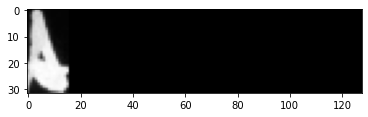




original_text =   Labour
predicted text = Labour

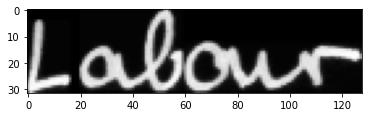




original_text =   of
predicted text = af

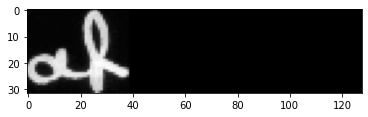




original_text =   down
predicted text = down

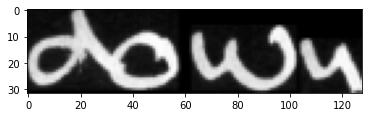




original_text =   Exchange
predicted text = Eichonge

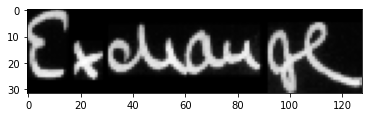




original_text =   any
predicted text = ay

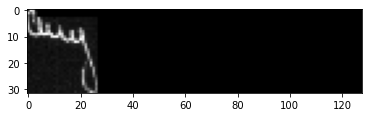




original_text =   a
predicted text = a

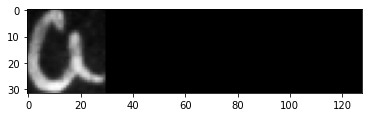




original_text =   has
predicted text = har

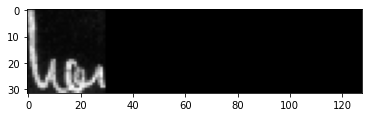




original_text =   is
predicted text = in

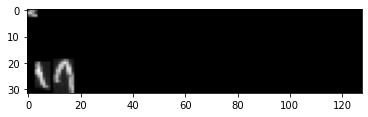




original_text =   for
predicted text = for

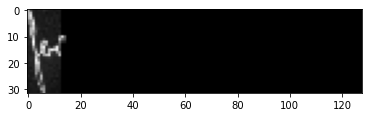




original_text =   support
predicted text = sugport

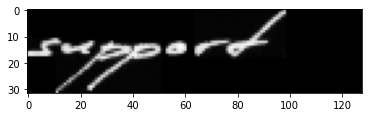




original_text =   to
predicted text = to

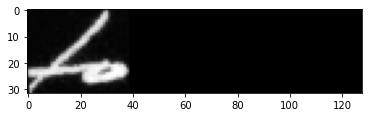




original_text =   will
predicted text = wit

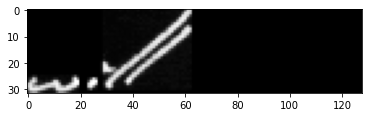




original_text =   which
predicted text = nhrl

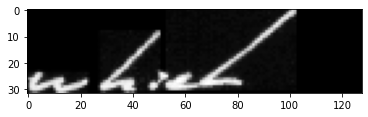




original_text =   now
predicted text = roa

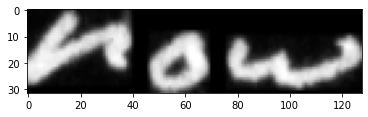




original_text =   of
predicted text = of

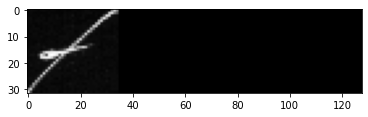




original_text =   take
predicted text = take

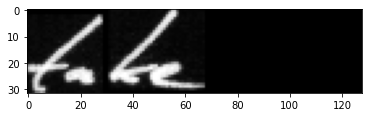




original_text =   Left-wing
predicted text = left-wing

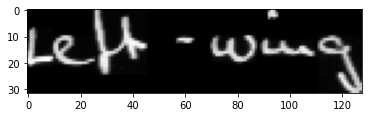




original_text =   likely
predicted text = likely

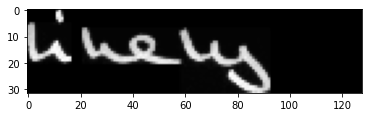




original_text =   Government
predicted text = Government

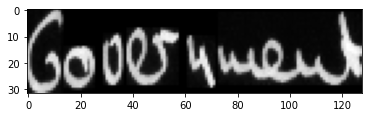




original_text =   should
predicted text = schould

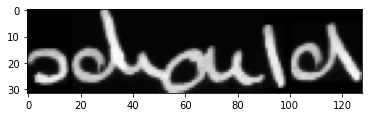




original_text =   the
predicted text = the

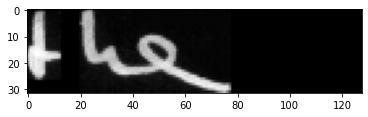




original_text =   should
predicted text = should

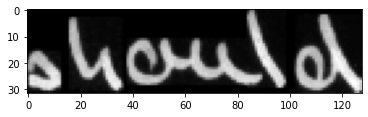




original_text =   prop
predicted text = prosp

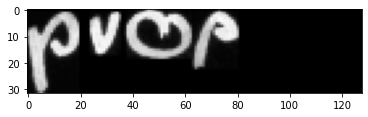




original_text =   likely
predicted text = ldy

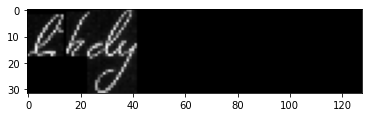




original_text =   ment
predicted text = ment

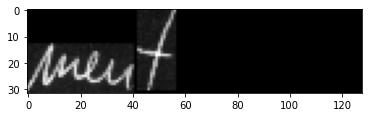




original_text =   should
predicted text = should

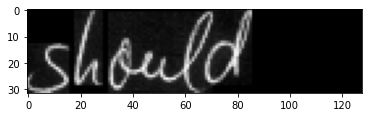




original_text =   the
predicted text = the

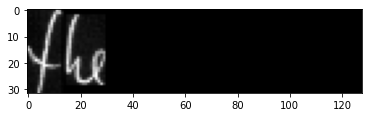




original_text =   should
predicted text = should

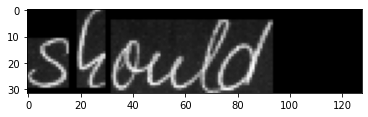




original_text =   prop
predicted text = prep

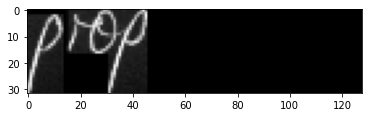




original_text =   13
predicted text = 13

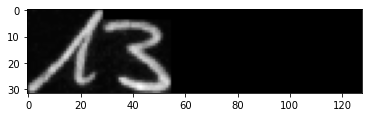




original_text =   Most
predicted text = Most

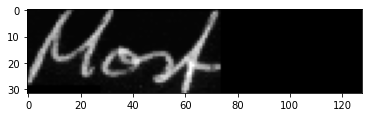




original_text =   the
predicted text = the

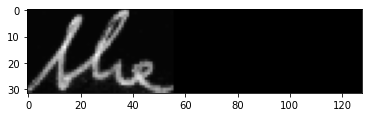




original_text =   has
predicted text = has

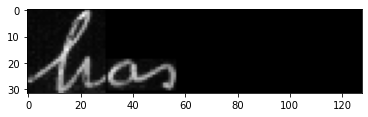




original_text =   two
predicted text = to

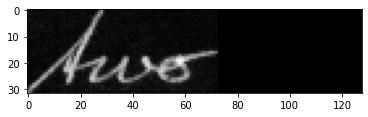




original_text =   to
predicted text = to

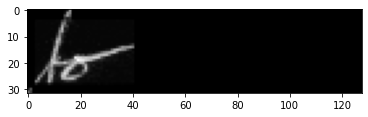




original_text =   Welensky
predicted text = Wlelenlys

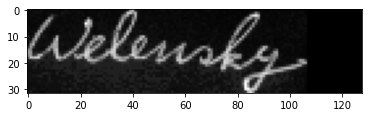




original_text =   Labour
predicted text = Labouur

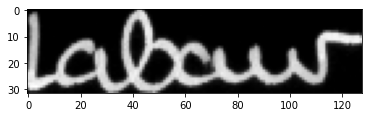




original_text =   Labour
predicted text = Labour

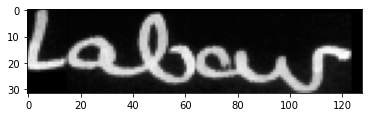




original_text =   of
predicted text = of

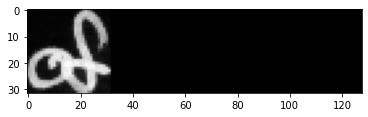




original_text =   have
predicted text = have

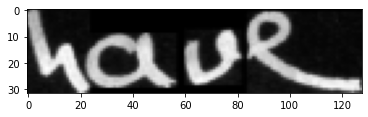




original_text =   African
predicted text = African

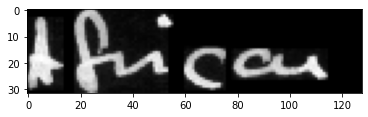




original_text =   together
predicted text = together

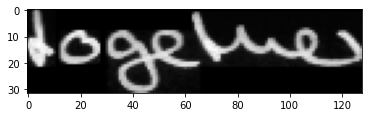




original_text =   the
predicted text = the

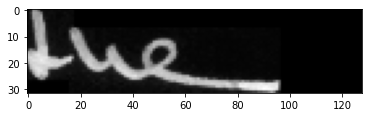




original_text =   Peers
predicted text = Teers

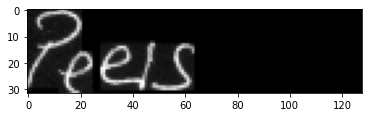




original_text =   sentiment
predicted text = sentment

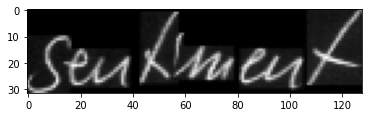




original_text =   Lords
predicted text = Lards

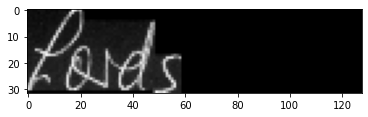




original_text =   an
predicted text = an

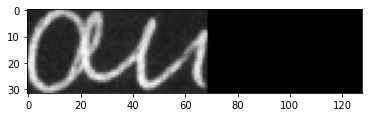




original_text =   Nationalist
predicted text = Natiomnalist

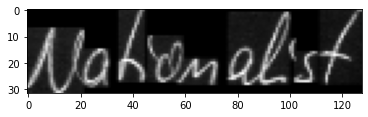




original_text =   to
predicted text = to

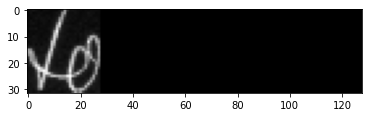




original_text =   Federal
predicted text = Federal

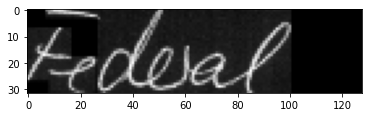




original_text =   Independence
predicted text = hdependud

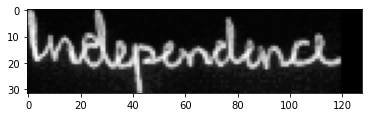




original_text =   today
predicted text = today

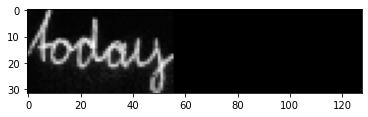




original_text =   Roy
predicted text = Roy

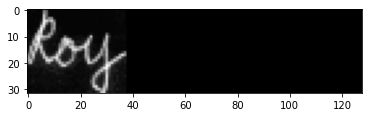




original_text =   in
predicted text = in

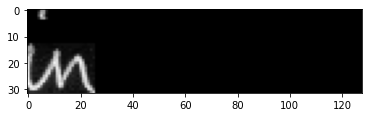




original_text =   Iain
predicted text = hain

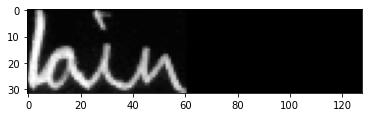




original_text =   .
predicted text = .

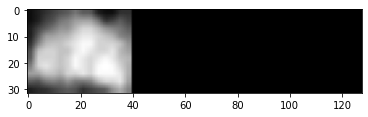




original_text =   (
predicted text = ,

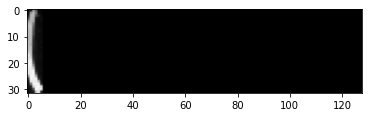




original_text =   Congress
predicted text = Canguess

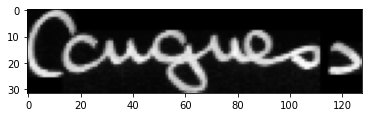




original_text =   discuss
predicted text = discuss

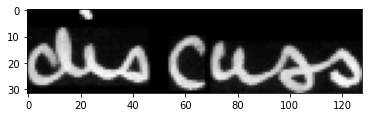




original_text =   violently
predicted text = iolently

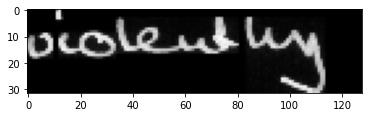




original_text =   Rhodesia
predicted text = Rhodesia

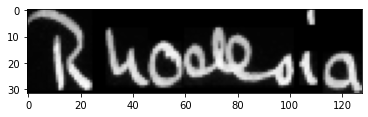




original_text =   ,
predicted text = ,

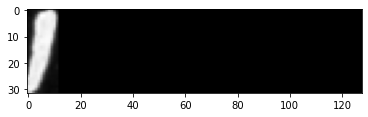




original_text =   insisting
predicted text = initdiey

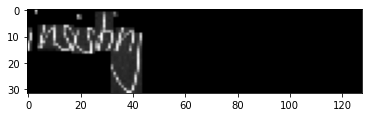




original_text =   Federal
predicted text = Federal

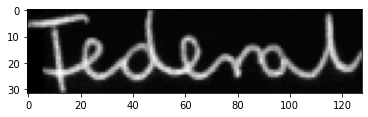




original_text =   future
predicted text = fude

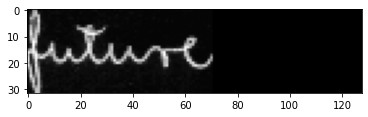




original_text =   want
predicted text = Want

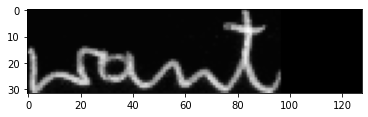




original_text =   gives
predicted text = gives

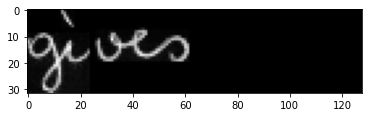




original_text =   .
predicted text = .

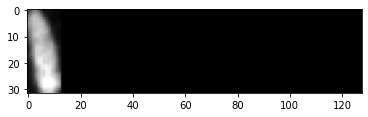




original_text =   his
predicted text = his

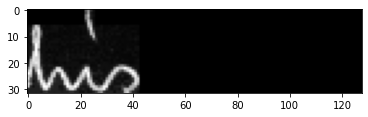




original_text =   at
predicted text = at

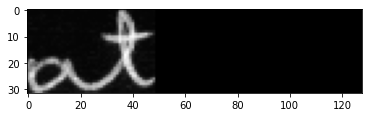




original_text =   the
predicted text = the

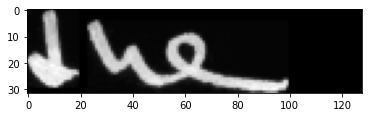




original_text =   to
predicted text = to

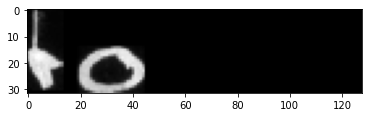




original_text =   Roy's
predicted text = Ray's

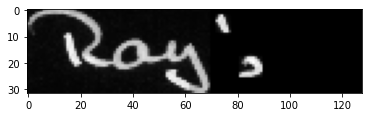




original_text =   chief
predicted text = chief

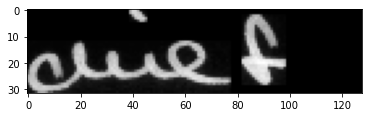




original_text =   Chequers
predicted text = Ehequer

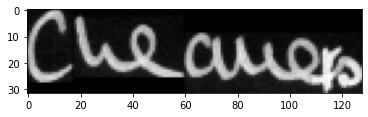




original_text =   London
predicted text = clondon

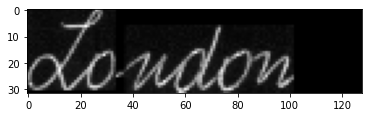




original_text =   last
predicted text = last

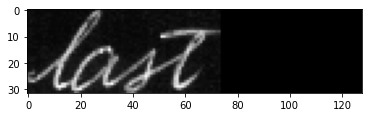




original_text =   do
predicted text = at

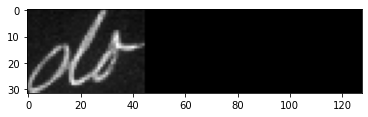




original_text =   and
predicted text = and

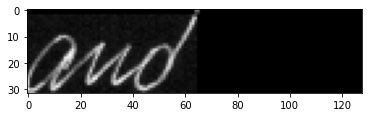




original_text =   be
predicted text = be

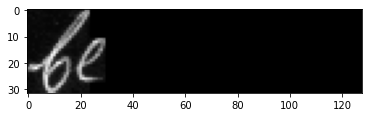




original_text =   Mr.
predicted text = Mr.

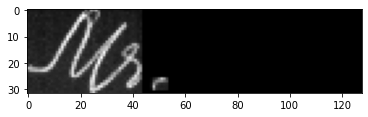




original_text =   his
predicted text = his

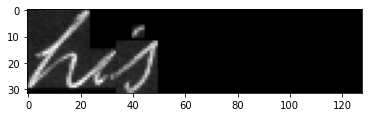




original_text =   went
predicted text = wert

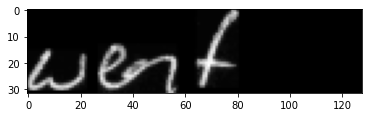




original_text =   crisis
predicted text = oris

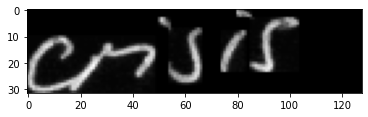




original_text =   his
predicted text = his

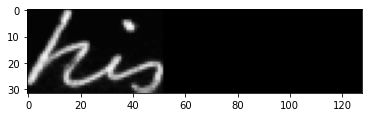




original_text =   These
predicted text = These

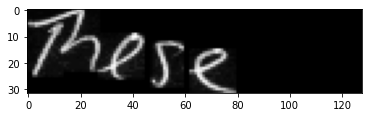




original_text =   they
predicted text = they

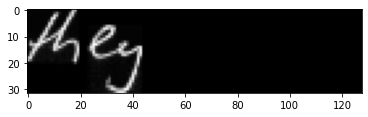




original_text =   .
predicted text = .

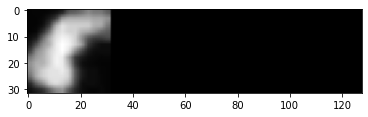




original_text =   a
predicted text = a

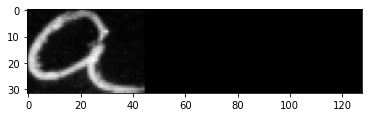




original_text =   with
predicted text = with

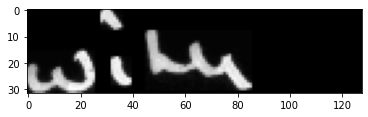




original_text =   had
predicted text = had

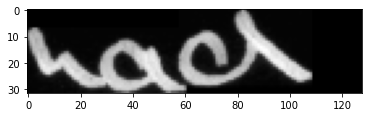




original_text =   plans
predicted text = polaus

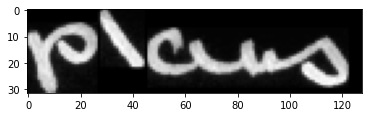




original_text =   do
predicted text = do

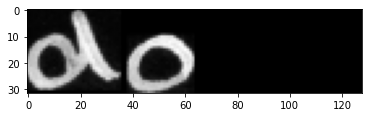




original_text =   seeking
predicted text = sacking

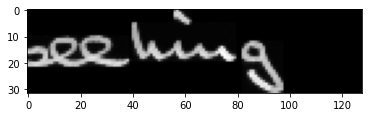




original_text =   conference
predicted text = confeenee

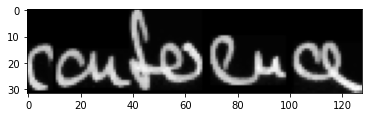




original_text =   House
predicted text = House

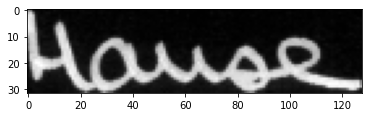




original_text =   conference
predicted text = conference

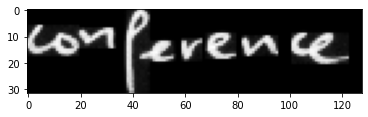




original_text =   up
predicted text = up

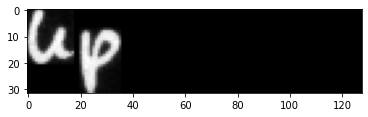




original_text =   the
predicted text = the

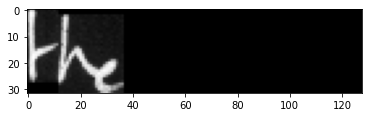




original_text =   give
predicted text = gire

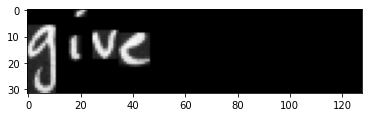




original_text =   .
predicted text = .

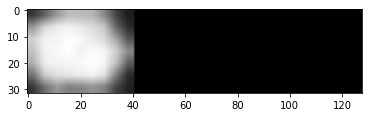




original_text =   will
predicted text = will

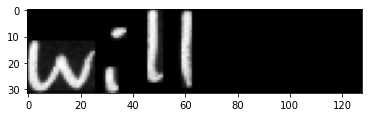




original_text =   of
predicted text = of

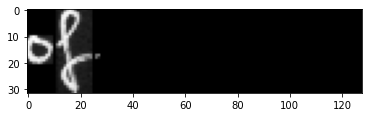




original_text =   ,
predicted text = ,

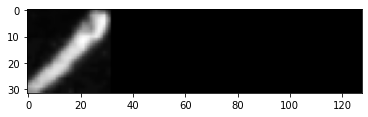




original_text =   been
predicted text = been

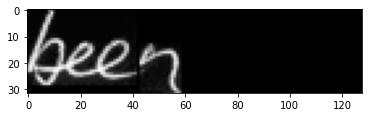




original_text =   Rhodesia
predicted text = Rhodesva

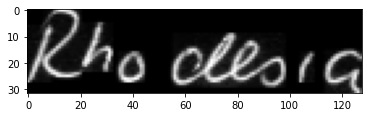




original_text =   main
predicted text = porn

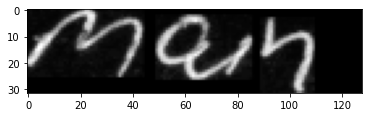




original_text =   Dominion
predicted text = Somcinion

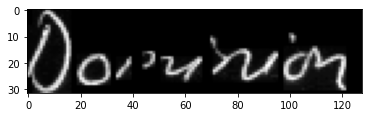




original_text =   Prime
predicted text = Prime

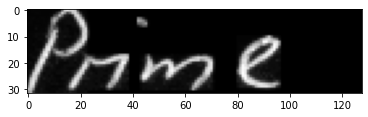




original_text =   Chequers
predicted text = Geguers

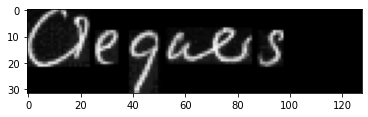




original_text =   MR.
predicted text = Mr.

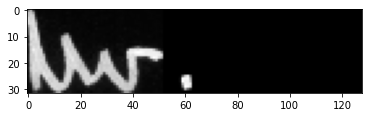




original_text =   the
predicted text = the

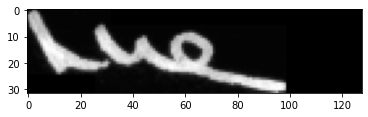




original_text =   on
predicted text = an

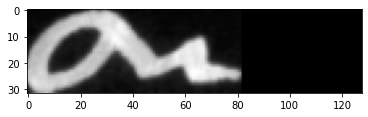




original_text =   London
predicted text = London

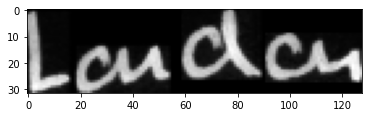




original_text =   -
predicted text = -

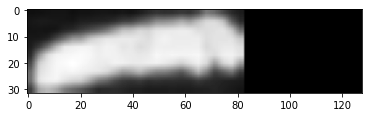




original_text =   But
predicted text = But

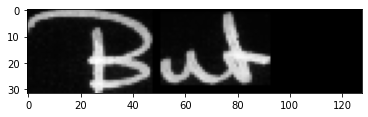




original_text =   the
predicted text = the

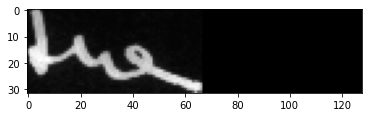




original_text =   week-end
predicted text = wesk-en

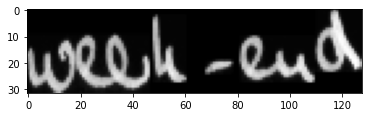




original_text =   ,
predicted text = ,

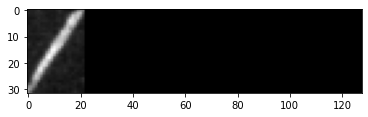




original_text =   night
predicted text = night

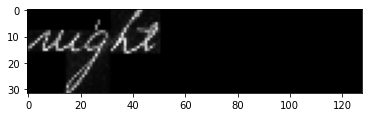




original_text =   Rhodesia's
predicted text = Rhoderia's

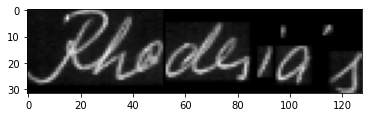




original_text =   of
predicted text = Af

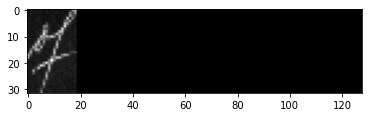




original_text =   African
predicted text = Shean

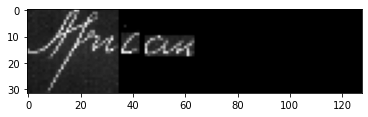




original_text =   talks
predicted text = talks

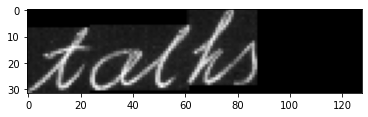




original_text =   of
predicted text = of

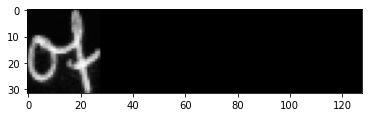




original_text =   I
predicted text = "

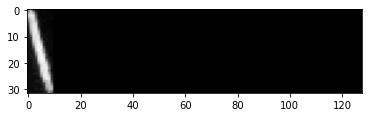




original_text =   said
predicted text = sai

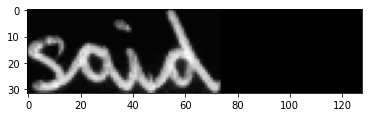




original_text =   .
predicted text = .

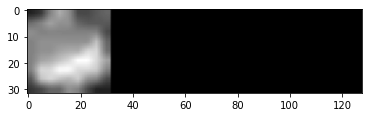




original_text =   Sir
predicted text = Sir

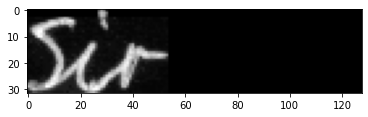




original_text =   talks
predicted text = talks

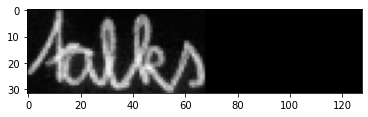




original_text =   Northern
predicted text = Northern

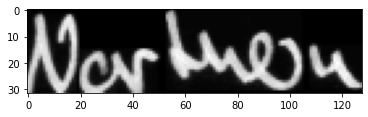




original_text =   Macleod
predicted text = Macleod

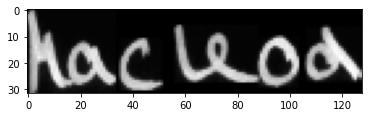




original_text =   secret
predicted text = secret

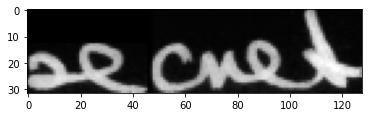




original_text =   to
predicted text = to

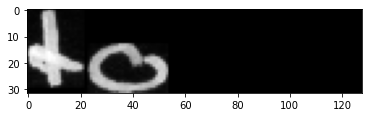




original_text =   remained
predicted text = remained

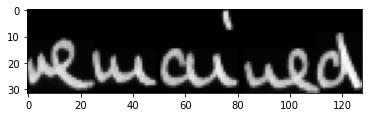




original_text =   Labour's
predicted text = Labour's

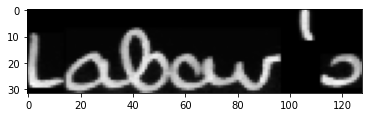




original_text =   to
predicted text = to

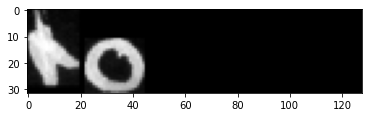




original_text =   round
predicted text = sonund

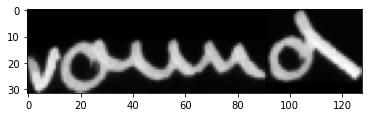




original_text =   of
predicted text = of

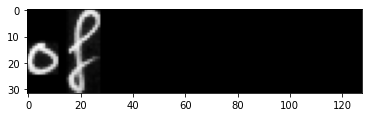




original_text =   the
predicted text = the

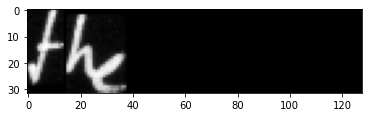




original_text =   "
predicted text = "

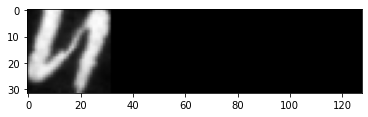




original_text =   He
predicted text = He

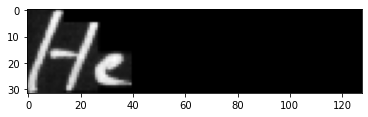




original_text =   said
predicted text = saicl

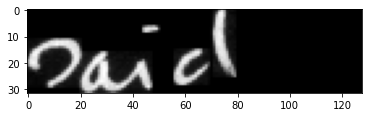




original_text =   the
predicted text = the

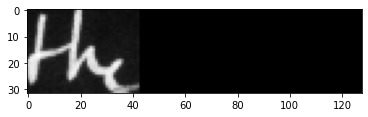




original_text =   .
predicted text = .

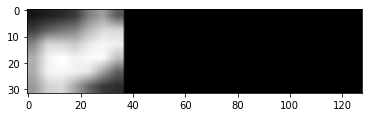




original_text =   to
predicted text = too

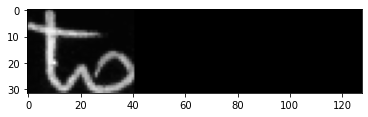




original_text =   sent
predicted text = sent

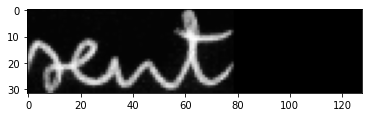




original_text =   Macmillan
predicted text = Macmillan

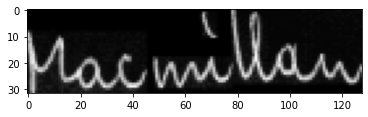




original_text =   Mr.
predicted text = Mr.

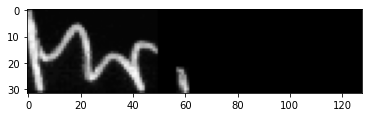




original_text =   week-end
predicted text = weel-end

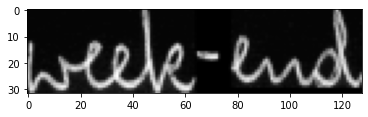




original_text =   "
predicted text = "

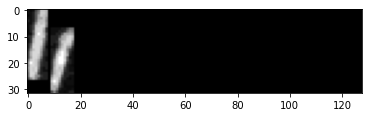




original_text =   Roy's
predicted text = cay'r

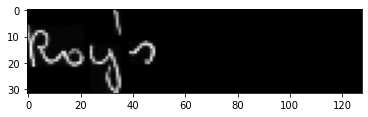




original_text =   the
predicted text = the

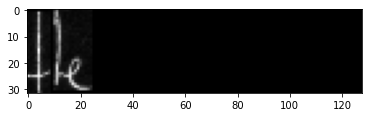




original_text =   because
predicted text = tecone

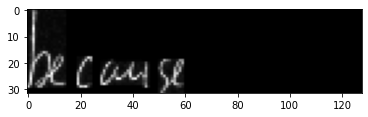




original_text =   were
predicted text = whre

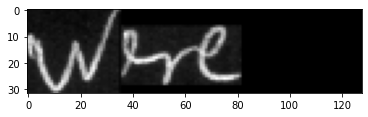




original_text =   by
predicted text = ty

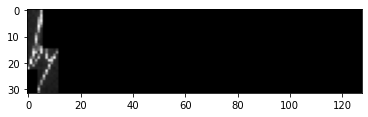




original_text =   talks
predicted text = talks

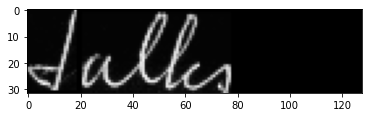




original_text =   today
predicted text = dodiy

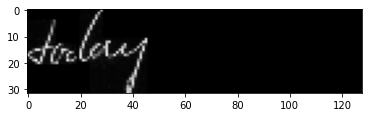




original_text =   Minister
predicted text = Minillan

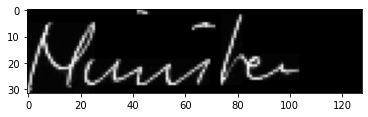




original_text =   will
predicted text = whill

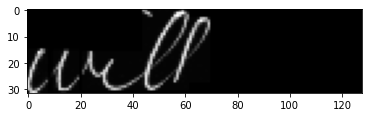




original_text =   Government
predicted text = Grrnnnnent

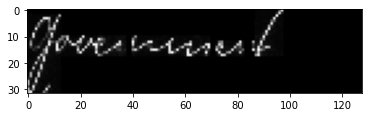




original_text =   Lancaster
predicted text = Lancaster

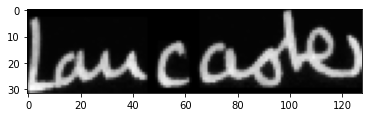




original_text =   the
predicted text = the

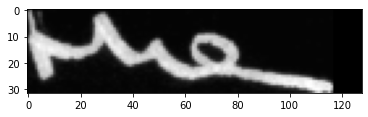




original_text =   It
predicted text = It

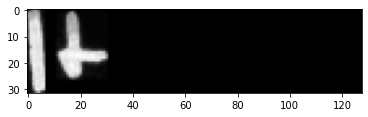




original_text =   the
predicted text = the

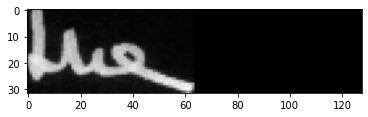




original_text =   Weaver
predicted text = Wevver

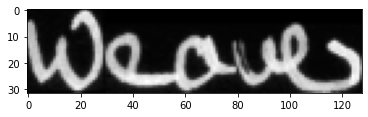




original_text =   be
predicted text = be

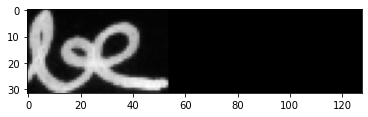




original_text =   and
predicted text = and

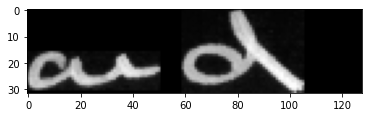




original_text =   will
predicted text = will

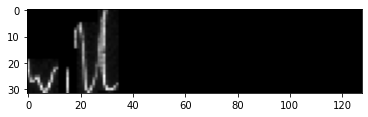




original_text =   of
predicted text = of

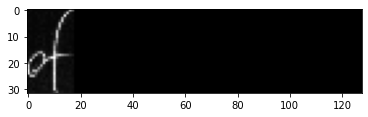




original_text =   aroused
predicted text = cnoned

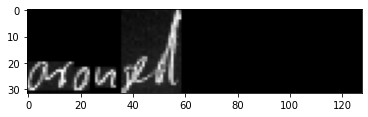




original_text =   South
predicted text = Sockh

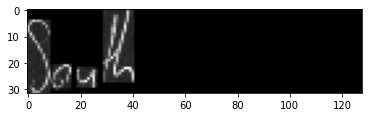




original_text =   York
predicted text = talk

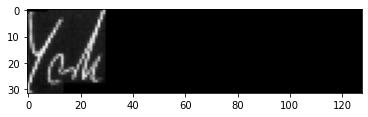




original_text =   there
predicted text = the

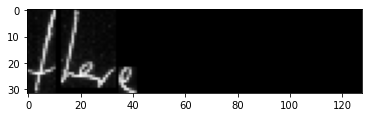




original_text =   projects
predicted text = puijats

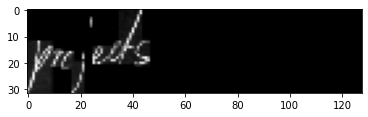




original_text =   opposition
predicted text = oppoitinnn

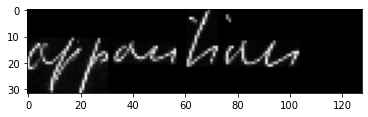




original_text =   Washington
predicted text = windmnisghon

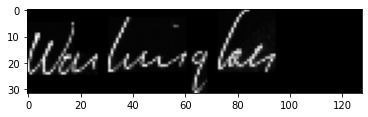




original_text =   The
predicted text = the

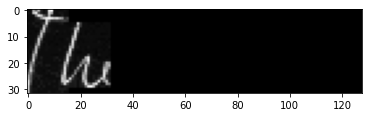




original_text =   Southern
predicted text = Bnthenn

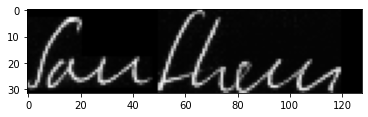




original_text =   today
predicted text = todny

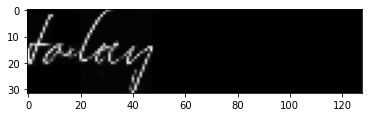




original_text =   Robertson
predicted text = Robarloonn

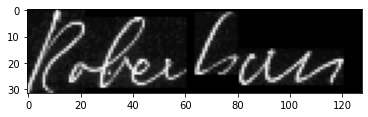




original_text =   Kennedy
predicted text = Konnday

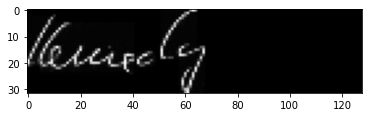




original_text =   the
predicted text = the

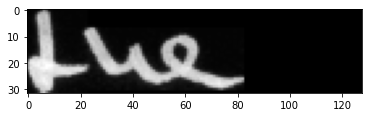




original_text =   current
predicted text = ourent

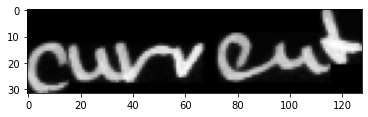




original_text =   .
predicted text = .

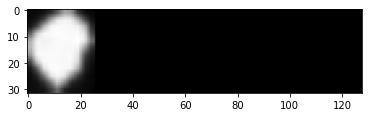




original_text =   another
predicted text = anothe

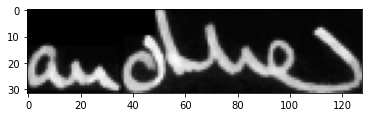




original_text =   met
predicted text = net

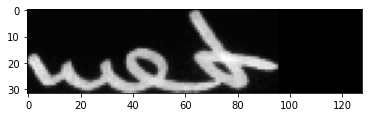




original_text =   Mr.
predicted text = Mr.

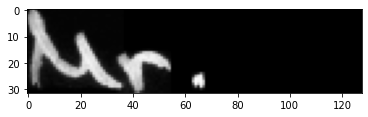




original_text =   television
predicted text = television

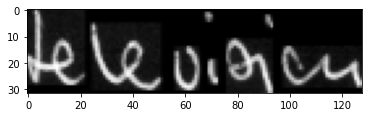




original_text =   Weaver
predicted text = Weaver

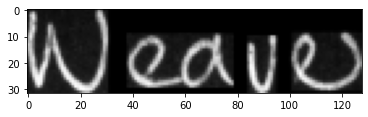




original_text =   Committee
predicted text = Conmmittee

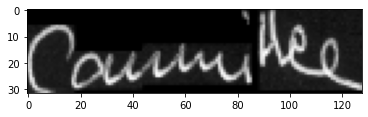




original_text =   Willis
predicted text = Viulis

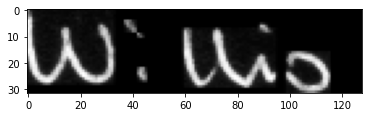




original_text =   he
predicted text = he

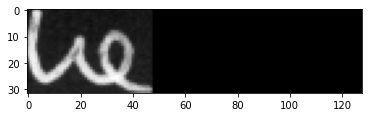




original_text =   had
predicted text = had

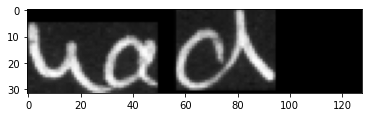




original_text =   by
predicted text = by

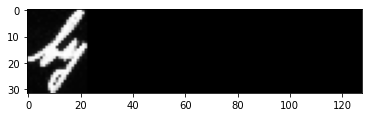




original_text =   to
predicted text = to

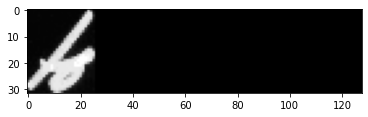




original_text =   perform
predicted text = pton

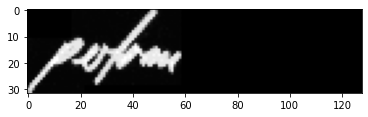




original_text =   Robertson's
predicted text = Nsterto's

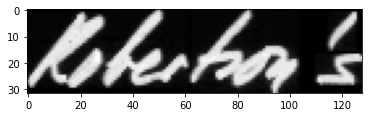




original_text =   can
predicted text = ov

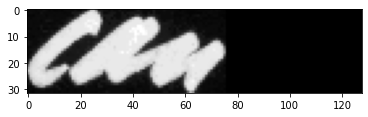




original_text =   He
predicted text = He

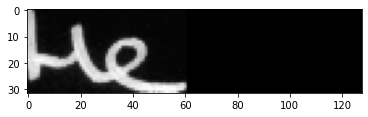




original_text =   black-
predicted text = Glacd-

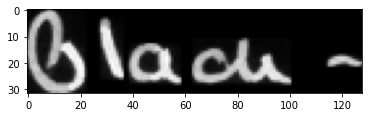




original_text =   a
predicted text = a

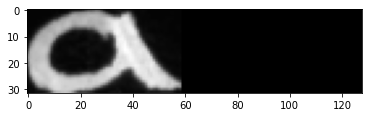




original_text =   Investigation
predicted text = hnestigation

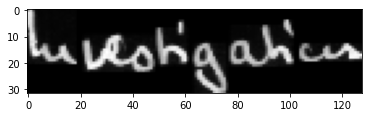




original_text =   would
predicted text = wouuld

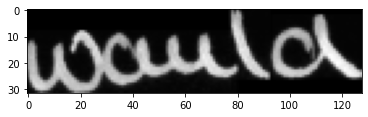




original_text =   Senator
predicted text = Sanator

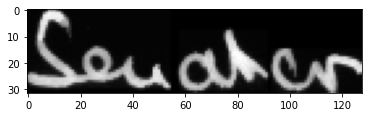




original_text =   it
predicted text = it

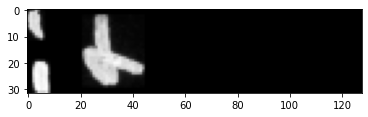




original_text =   to
predicted text = too

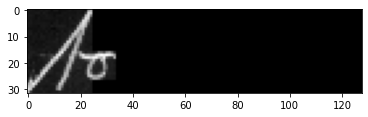




original_text =   reported
predicted text = reportel

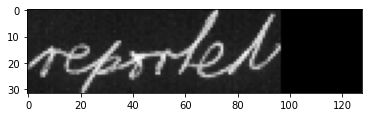




original_text =   "
predicted text = "

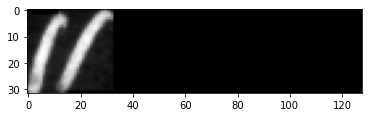




original_text =   committee
predicted text = committee

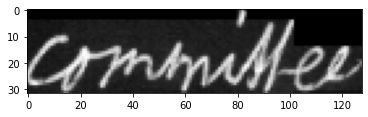




original_text =   be
predicted text = he

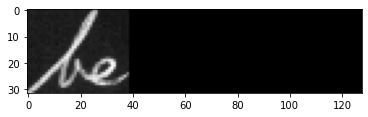




original_text =   ready
predicted text = neursdy

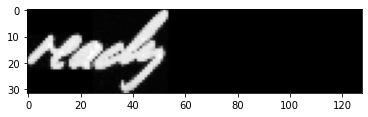




original_text =   help
predicted text = hufe

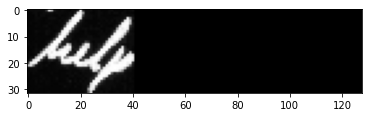




original_text =   in
predicted text = in

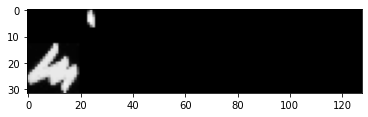




original_text =   was
predicted text = ws

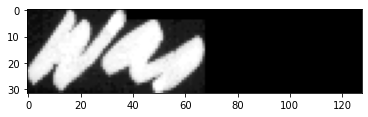




original_text =   He
predicted text = Ae

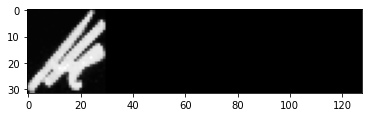




original_text =   the
predicted text = the

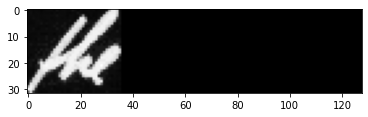




original_text =   get
predicted text = get

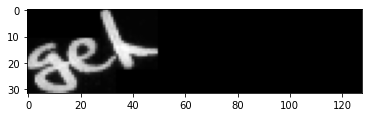




original_text =   balance
predicted text = balace

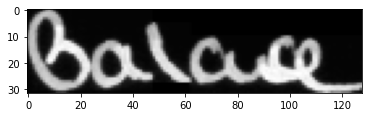




original_text =   yesterday
predicted text = yesteday

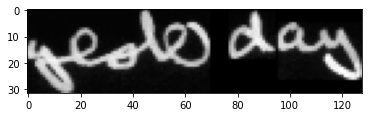




original_text =   enough
predicted text = emaugh

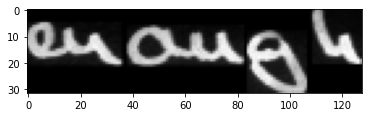




original_text =   to
predicted text = to

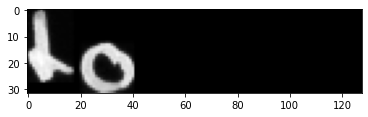




original_text =   mention
predicted text = nention

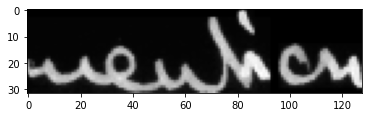




original_text =   Chancellor
predicted text = Ehoncellor

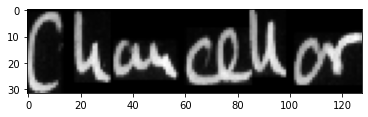




original_text =   West
predicted text = Whoskh

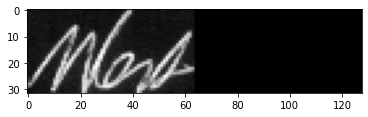




original_text =   position
predicted text = positesim

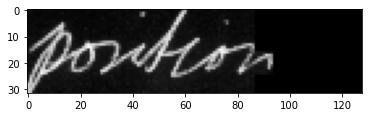




original_text =   -
predicted text = -

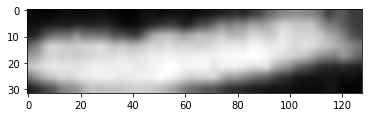




original_text =   indicated
predicted text = intied

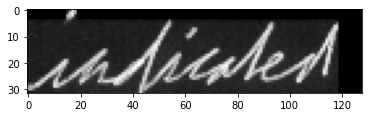




original_text =   pay
predicted text = peary

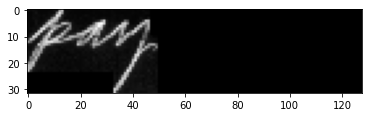




original_text =   Dr.
predicted text = Mr.

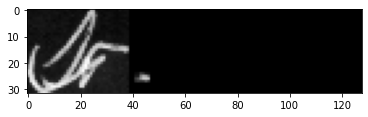




original_text =   said
predicted text = said

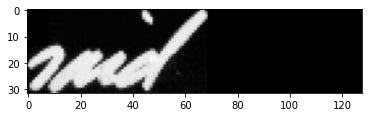




original_text =   discuss
predicted text = dicus

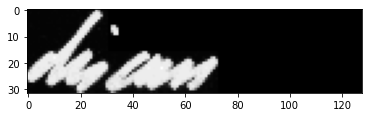




original_text =   Foreign
predicted text = Forigin

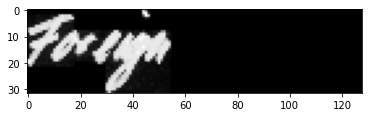




original_text =   .
predicted text = .

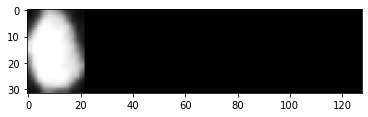




original_text =   .
predicted text = .

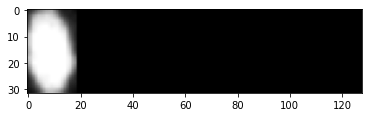




original_text =   money
predicted text = mongy

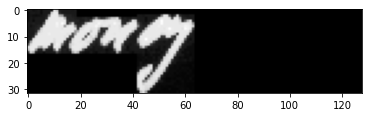




original_text =   might
predicted text = night

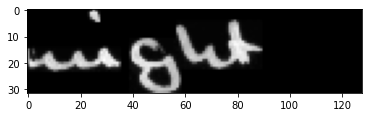




original_text =   problem
predicted text = problem

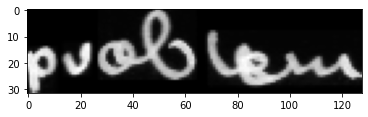




original_text =   ,
predicted text = ,

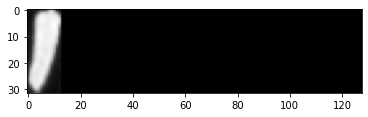




original_text =   big
predicted text = big

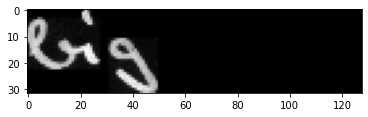




original_text =   payment
predicted text = sayment

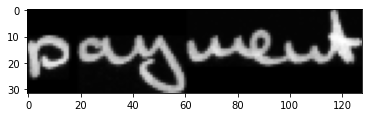




original_text =   officials
predicted text = sfficials

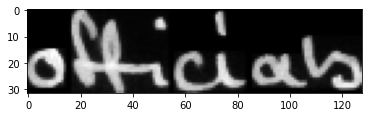




original_text =   America
predicted text = America

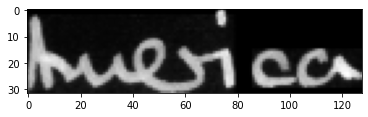




original_text =   higher
predicted text = highit

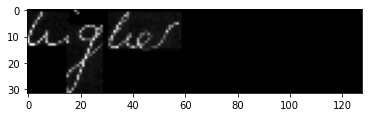




original_text =   .
predicted text = .

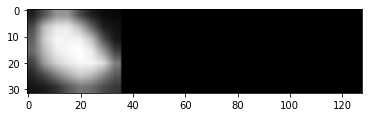




original_text =   due
predicted text = de

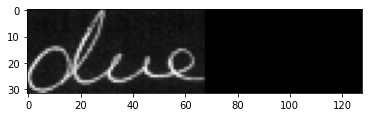




original_text =   Germany's
predicted text = Gerengy's

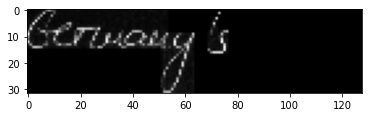




original_text =   210million
predicted text = 210millich

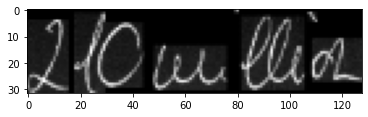




original_text =   And
predicted text = ho

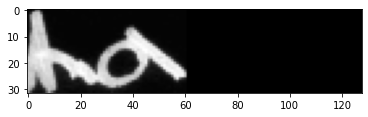




original_text =   cannot
predicted text = cannot

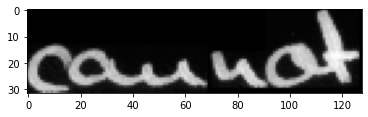




original_text =   .
predicted text = .

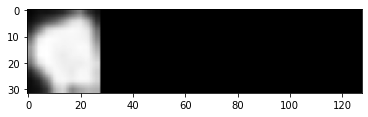




original_text =   and
predicted text = ad

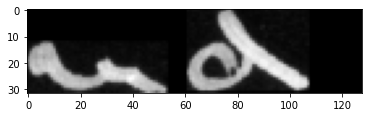




original_text =   present
predicted text = present

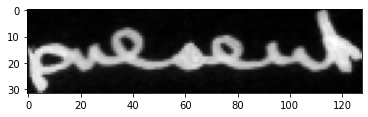




original_text =   Eisenhower
predicted text = Eisentower

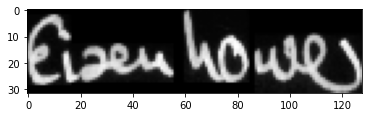




original_text =   towards
predicted text = towsords

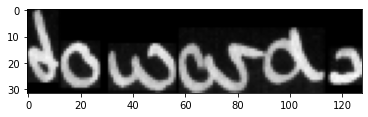




original_text =   These
predicted text = These

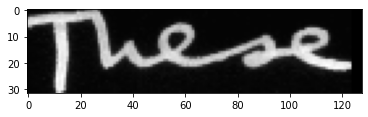




original_text =   reserves
predicted text = reseves

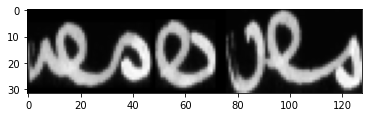




original_text =   of
predicted text = of

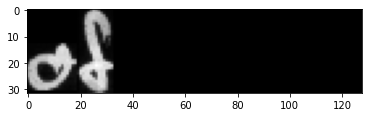




original_text =   painful
predicted text = sainful

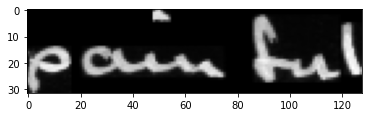




original_text =   now
predicted text = now

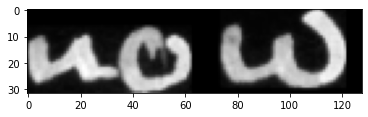




original_text =   do
predicted text = do

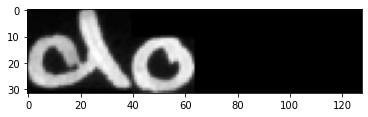




original_text =   upsetting
predicted text = uosetting

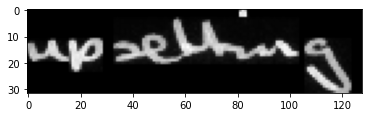




original_text =   a
predicted text = "

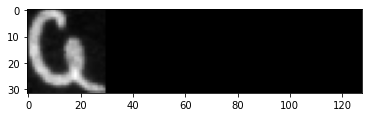




original_text =   answer
predicted text = Ruesvei

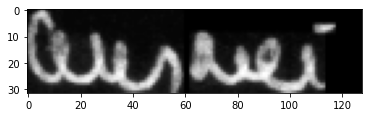




original_text =   Kennedy's
predicted text = hnnidior

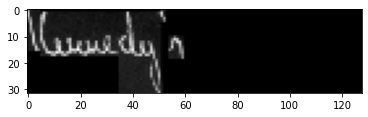




original_text =   West
predicted text = Wat

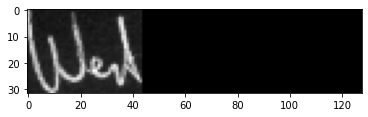




original_text =   .
predicted text = .

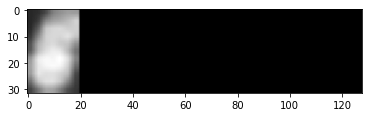




original_text =   Germany
predicted text = Genny

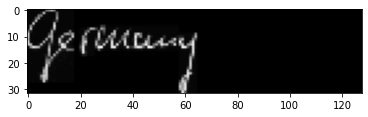




original_text =   Joyce
predicted text = fave

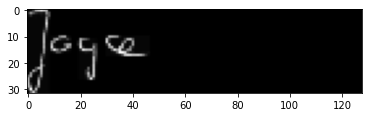




original_text =   con-
predicted text = Coen-

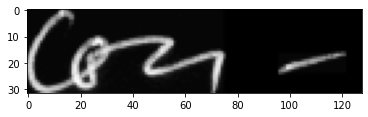




original_text =   lagging
predicted text = Raying

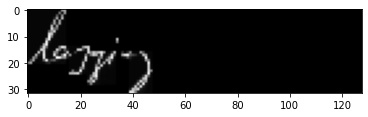




original_text =   was
predicted text = was

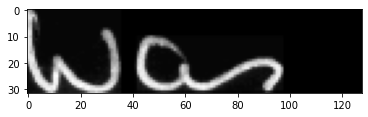




original_text =   with
predicted text = with

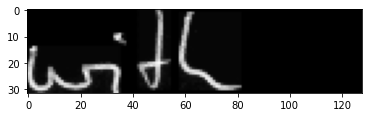




original_text =   is
predicted text = is

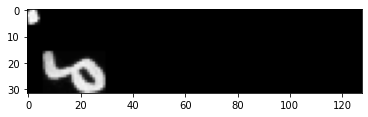




original_text =   President
predicted text = Pesident

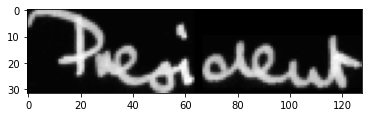




original_text =   not
predicted text = not

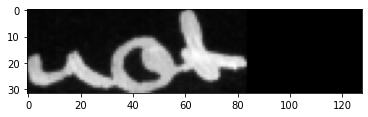




original_text =   power
predicted text = pouer

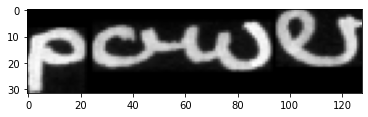




original_text =   military
predicted text = military

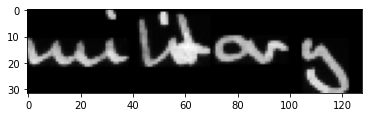




original_text =   20
predicted text = so

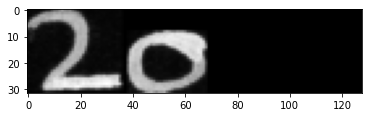




original_text =   from
predicted text = from

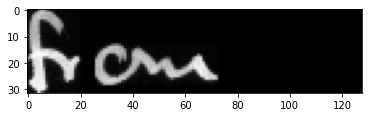




original_text =   claimed
predicted text = claied

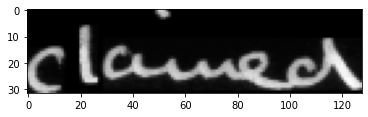




original_text =   lag
predicted text = tag

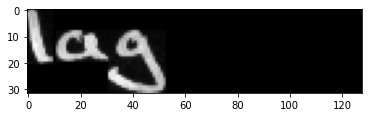




original_text =   his
predicted text = his

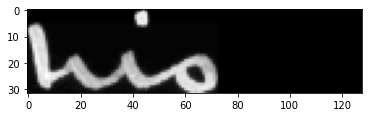




original_text =   George
predicted text = Greqrge

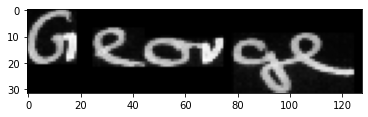




original_text =   personality
predicted text = pesonality

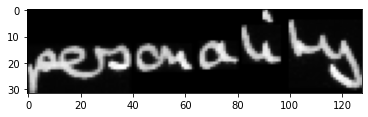




original_text =   ,
predicted text = ,

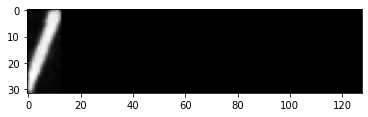




original_text =   Mr.
predicted text = Mr.

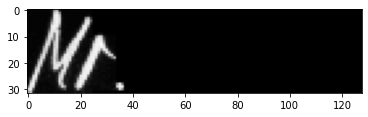




original_text =   a
predicted text = a

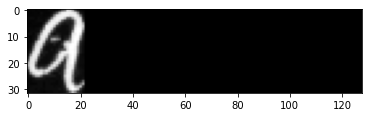




original_text =   MPs
predicted text = MPs

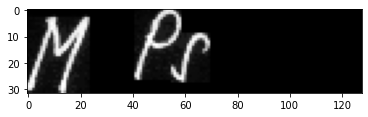




original_text =   issue
predicted text = inue

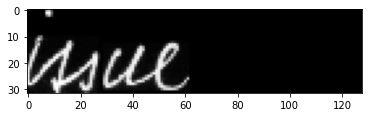




original_text =   Brown
predicted text = Brown

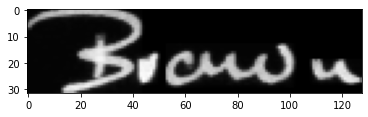




original_text =   the
predicted text = the

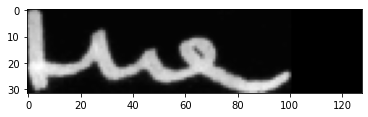




original_text =   outwardly
predicted text = outwaradly

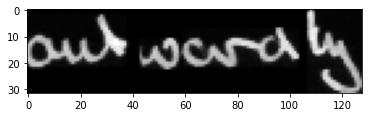




original_text =   ended
predicted text = anded

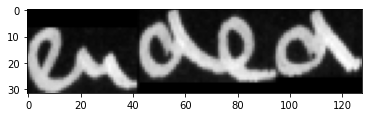




original_text =   dealt
predicted text = dealt

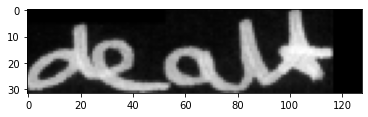




original_text =   the
predicted text = the

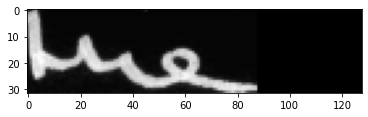




original_text =   come
predicted text = came

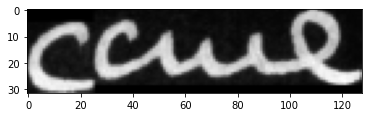




original_text =   in
predicted text = in

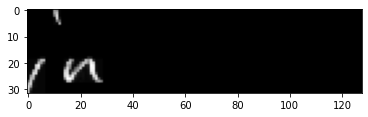




original_text =   to
predicted text = to

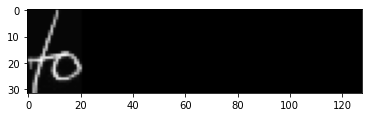




original_text =   Government
predicted text = Governent

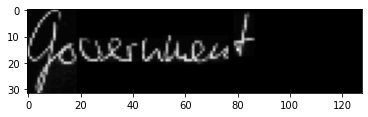




original_text =   heavy
predicted text = hany

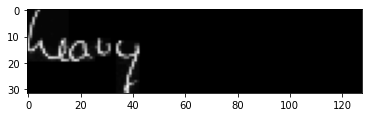




original_text =   Mr.
predicted text = Mr.

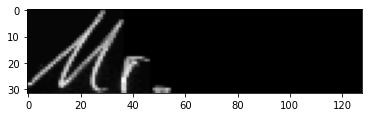




original_text =   .
predicted text = .

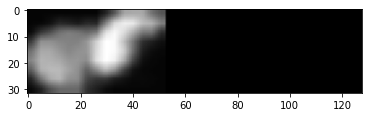




original_text =   of
predicted text = of

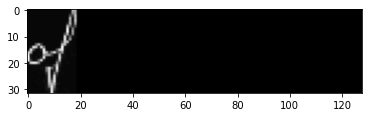




original_text =   not
predicted text = not

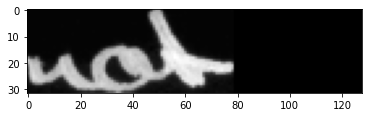




original_text =   answer
predicted text = auswer

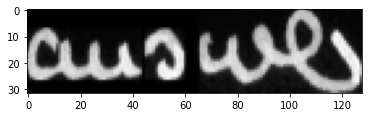




original_text =   the
predicted text = the

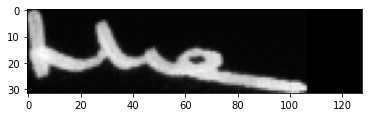




original_text =   placing
predicted text = slacing

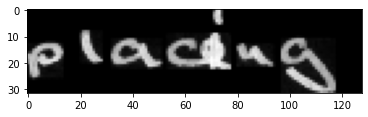




original_text =   .
predicted text = .

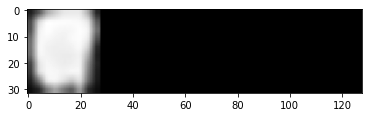




original_text =   monstrous
predicted text = moustous

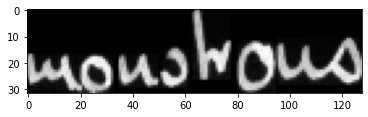




original_text =   ranks
predicted text = vunk

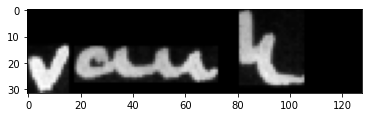




original_text =   and
predicted text = and

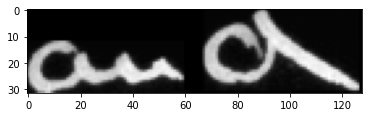




original_text =   this
predicted text = this

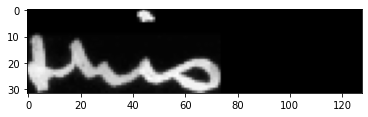




original_text =   medicine
predicted text = medicue

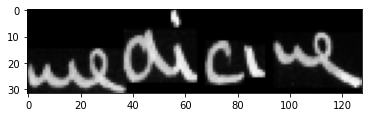




original_text =   .
predicted text = .

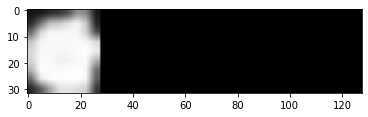




original_text =   horrified
predicted text = hormvitied

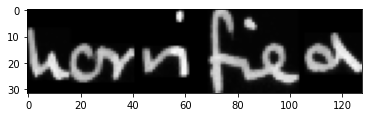




original_text =   whole
predicted text = whole

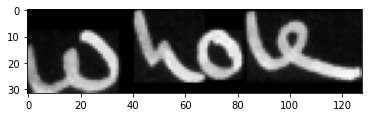




original_text =   service
predicted text = service

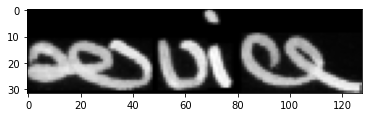




original_text =   lifetime
predicted text = Liftinn

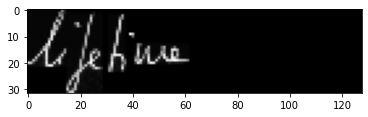




original_text =   considered
predicted text = considured

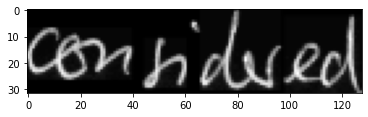




original_text =   which
predicted text = which

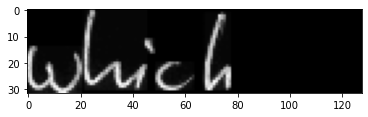




original_text =   it
predicted text = it

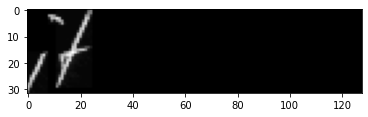




original_text =   from
predicted text = hrom

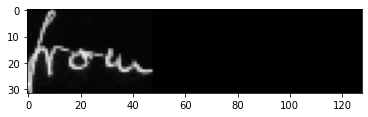




original_text =   cost
predicted text = ast

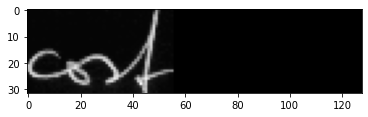




original_text =   healing
predicted text = teaking

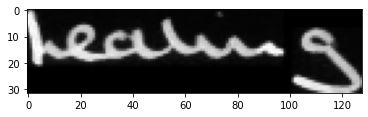




original_text =   supporting
predicted text = supporting

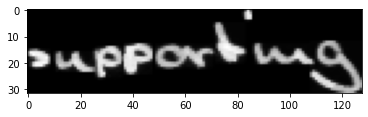




original_text =   .
predicted text = .

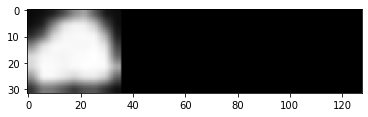




original_text =   dealing
predicted text = dealing

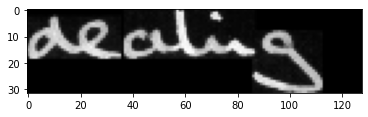




original_text =   to
predicted text = to

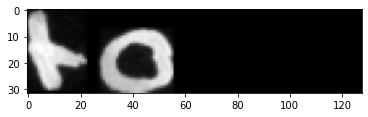




original_text =   surveyor
predicted text = surveyor

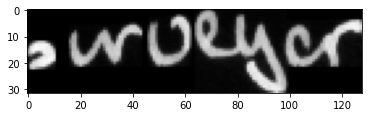




original_text =   fiddling
predicted text = fialling

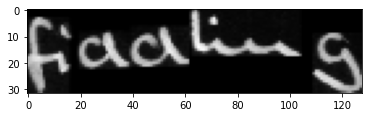




original_text =   a
predicted text = a

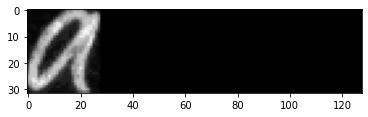




original_text =   the
predicted text = the

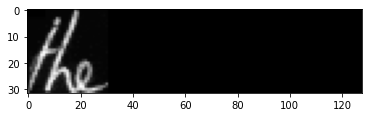




original_text =   sick
predicted text = ik

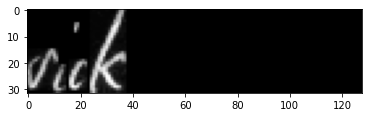




original_text =   "
predicted text = "

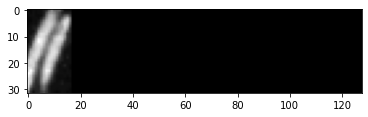




original_text =   can
predicted text = arn

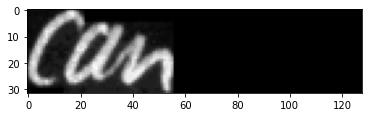




original_text =   medical
predicted text = medical

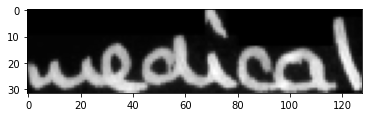




original_text =   of
predicted text = sf

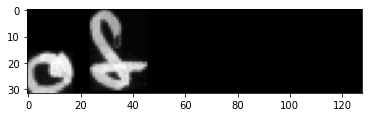




original_text =   ,
predicted text = ,

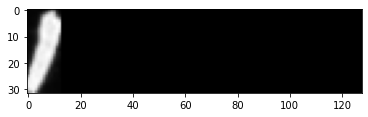




original_text =   it
predicted text = it

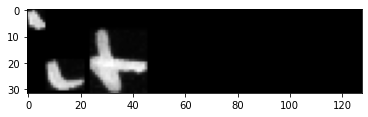




original_text =   by
predicted text = byy

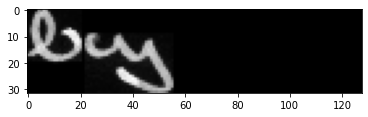




original_text =   jackals
predicted text = jackals

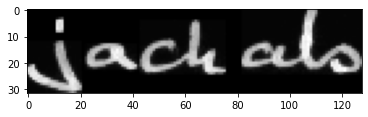




original_text =   .
predicted text = .

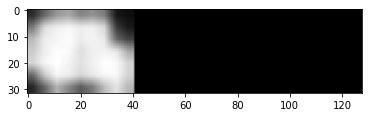




original_text =   services
predicted text = rervices

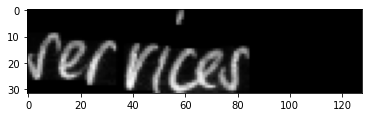




original_text =   Labour
predicted text = Labor

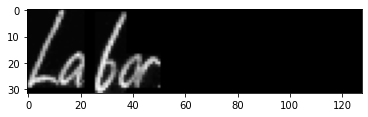




original_text =   absolutely
predicted text = chunetdaly

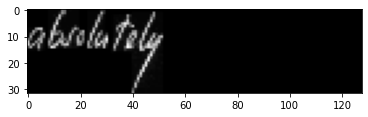




original_text =   nor
predicted text = nr

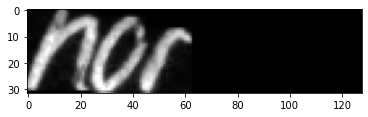




original_text =   was
predicted text = was

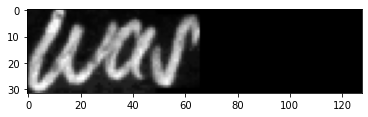




original_text =   and
predicted text = and

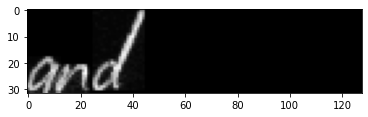




original_text =   benches
predicted text = tencher

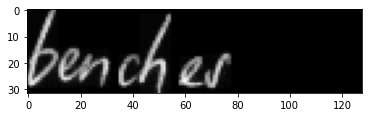




original_text =   strain
predicted text = shain

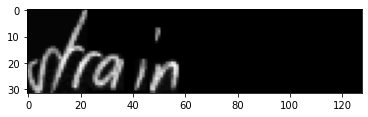




original_text =   their
predicted text = their

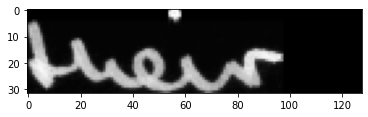




original_text =   different
predicted text = diffesent

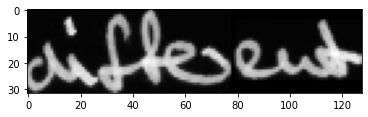




original_text =   ambulance
predicted text = ambulance

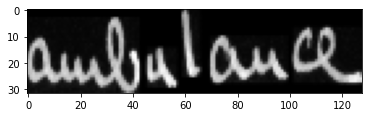




original_text =   not
predicted text = not

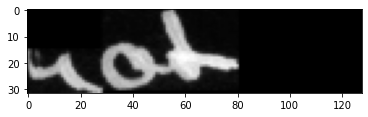




original_text =   Answering
predicted text = Ansuseing

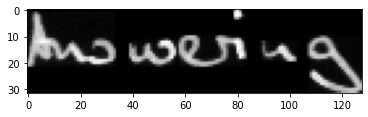




original_text =   ceiling
predicted text = citing

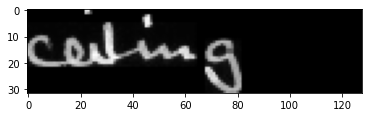




original_text =   reminded
predicted text = reninded

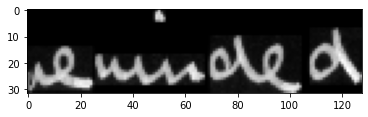




original_text =   because
predicted text = becouse

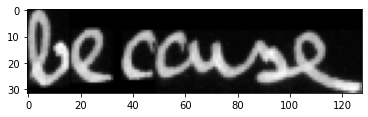




original_text =   in
predicted text = in

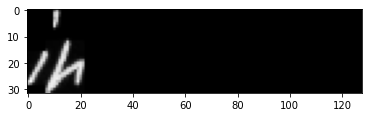




original_text =   expenditure
predicted text = expenditue

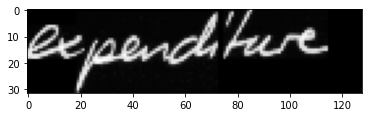




original_text =   cent.
predicted text = cent.

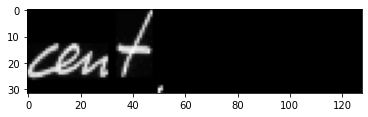




original_text =   unsmiling
predicted text = unsmniting

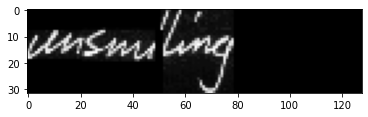




original_text =   it
predicted text = it

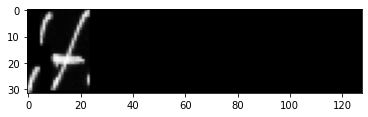




original_text =   action
predicted text = action

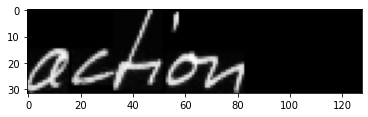




original_text =   risen
predicted text = risen

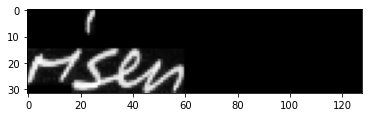




original_text =   eight
predicted text = eight

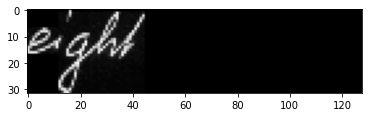




original_text =   worse
predicted text = wore

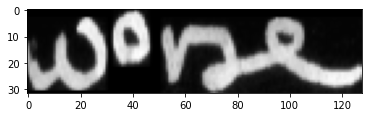




original_text =   to
predicted text = to

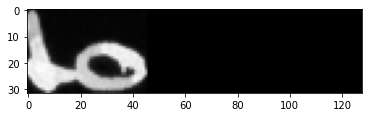




original_text =   of
predicted text = of

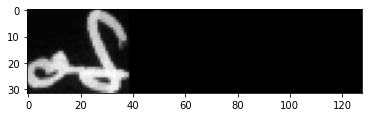




original_text =   to
predicted text = to

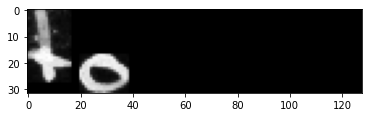




original_text =   directly
predicted text = directly

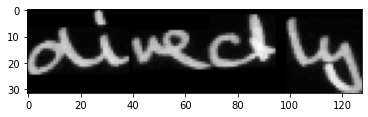




original_text =   instead
predicted text = instead

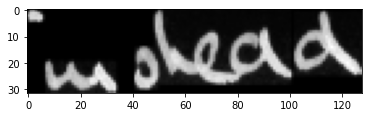




original_text =   should
predicted text = should

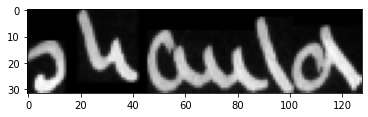




original_text =   #
predicted text = i

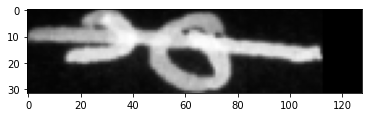




original_text =   on
predicted text = on

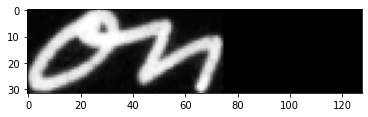




original_text =   .
predicted text = .

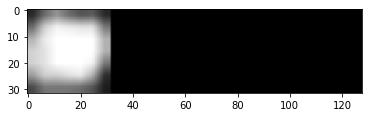




original_text =   cost
predicted text = cast

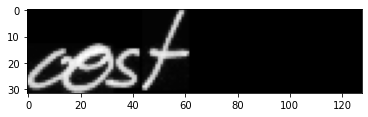




original_text =   health
predicted text = haalth

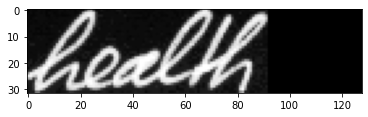




original_text =   scheme
predicted text = scheme

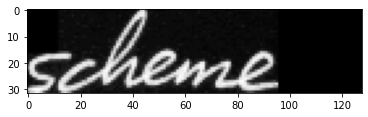




original_text =   be
predicted text = be

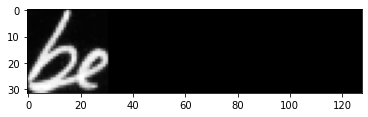




original_text =   to
predicted text = to

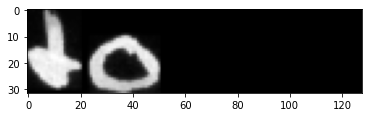




original_text =   people
predicted text = people

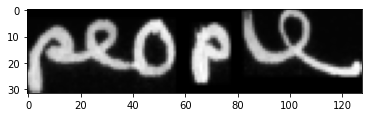




original_text =   Mr.
predicted text = Mr.

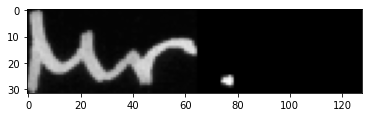




original_text =   full
predicted text = full

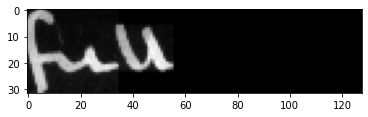




original_text =   industry
predicted text = industry

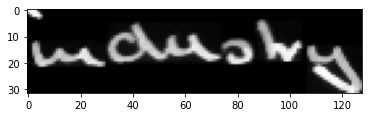




original_text =   to
predicted text = to

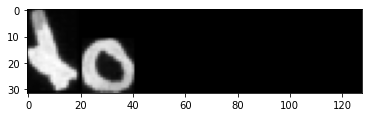




original_text =   the
predicted text = the

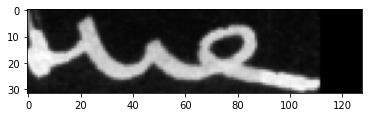




original_text =   seemed
predicted text = selmed

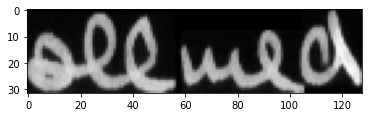




original_text =   Brown
predicted text = Brown

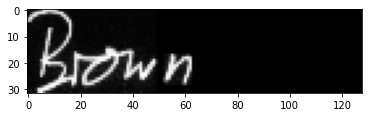




original_text =   -
predicted text = -

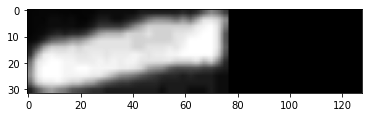




original_text =   indeed
predicted text = hndeed

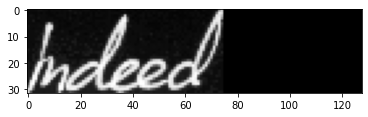




original_text =   of
predicted text = of

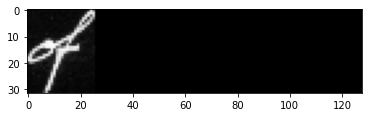




original_text =   the
predicted text = the

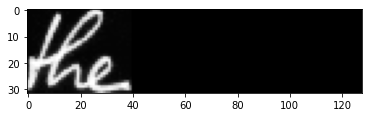




original_text =   per
predicted text = per

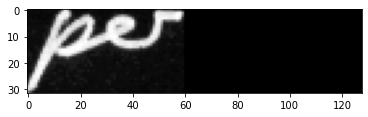




original_text =   for
predicted text = for

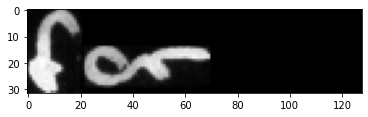




original_text =   on
predicted text = a

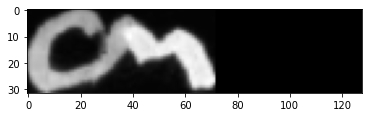




original_text =   speech
predicted text = speeck

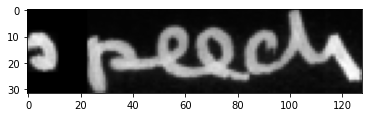




original_text =   of
predicted text = of

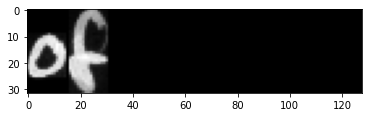




original_text =   three
predicted text = thee

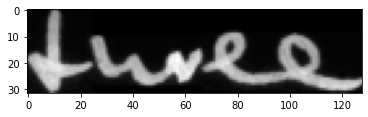




original_text =   in
predicted text = in

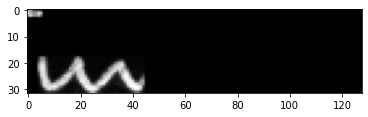




original_text =   financing
predicted text = financing

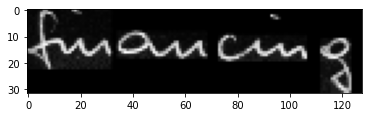




original_text =   undermining
predicted text = undnmmninins

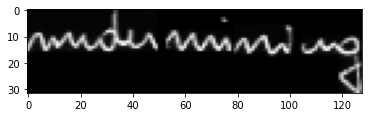




original_text =   economic
predicted text = ecsmsrin

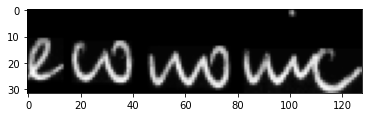




original_text =   that
predicted text = that

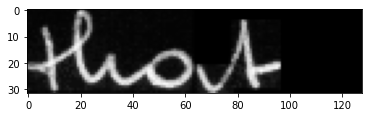




original_text =   receiving
predicted text = neceininns

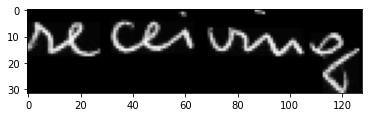




original_text =   without
predicted text = withont

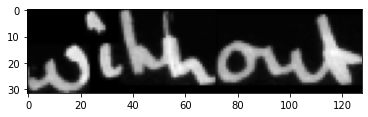




original_text =   in
predicted text = in

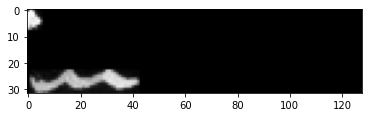




original_text =   financing
predicted text = financing

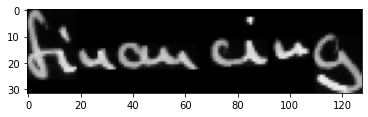




original_text =   undermining
predicted text = udenining

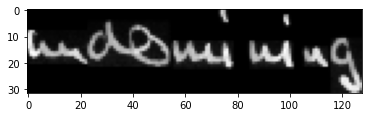




original_text =   economic
predicted text = conomic

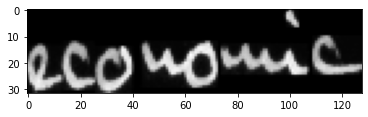




original_text =   that
predicted text = that

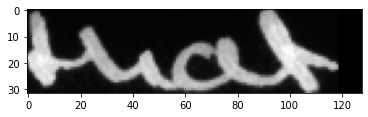




original_text =   receiving
predicted text = reciving

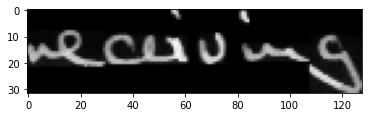




original_text =   without
predicted text = withant

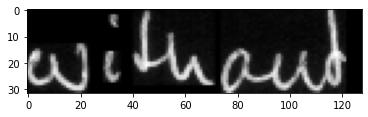




original_text =   in
predicted text = n

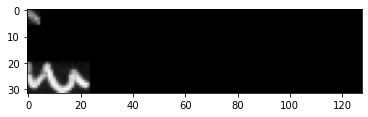




original_text =   financing
predicted text = financing

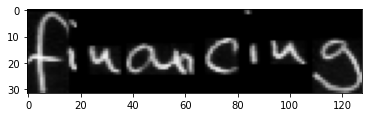




original_text =   undermining
predicted text = undermining

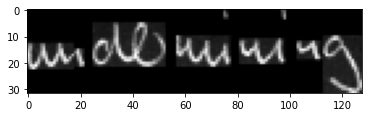




original_text =   economic
predicted text = eccohomic

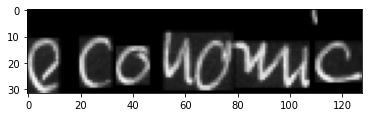




original_text =   all
predicted text = al

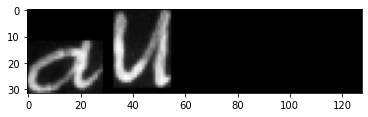




original_text =   regular
predicted text = regular

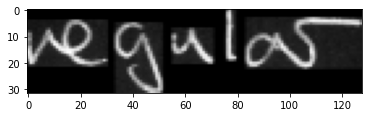




original_text =   strong
predicted text = stog

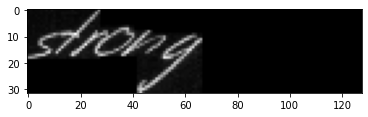




original_text =   joining
predicted text = Srinvidg

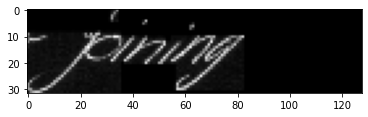




original_text =   to
predicted text = to

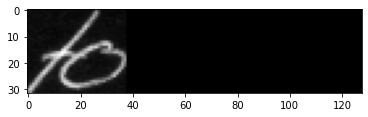




original_text =   way
predicted text = heags

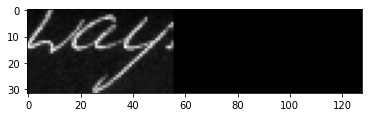




original_text =   Britain's
predicted text = Britain's

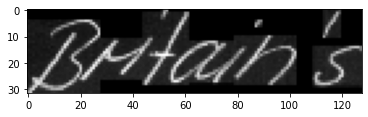




original_text =   gesture
predicted text = pesture

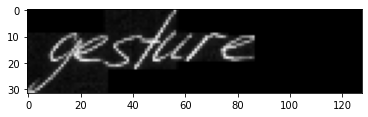




original_text =   So
predicted text = S0

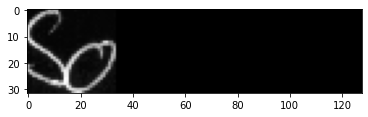




original_text =   to
predicted text = to

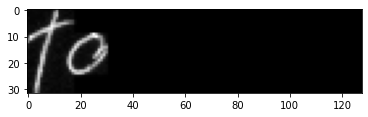




original_text =   a
predicted text = a

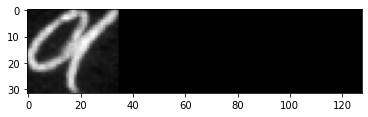




original_text =   Heath
predicted text = Heath

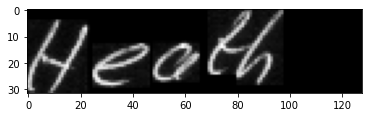




original_text =   the
predicted text = the

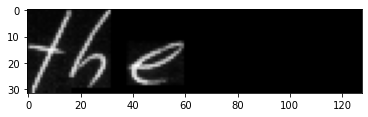




original_text =   same
predicted text = Some

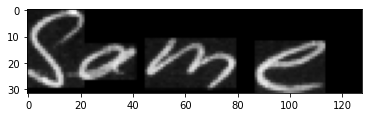




original_text =   told
predicted text = told

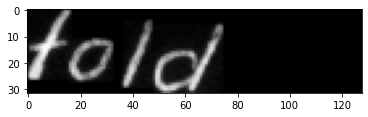




original_text =   wish
predicted text = wish

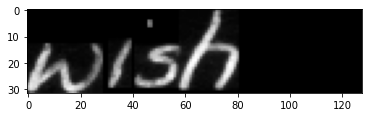




original_text =   of
predicted text = of

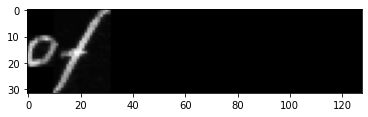




original_text =   will
predicted text = will

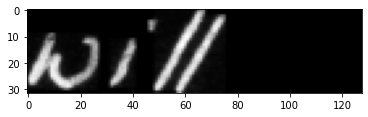




original_text =   on
predicted text = ar

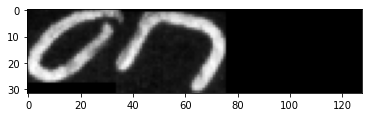




original_text =   draws
predicted text = chraus

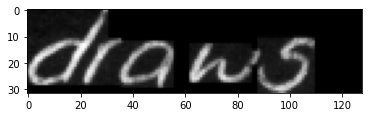




original_text =   the
predicted text = the

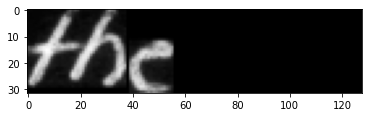




original_text =   experienced
predicted text = erperienced

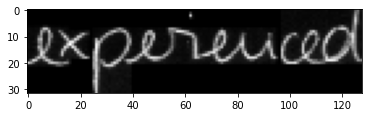




original_text =   has
predicted text = has

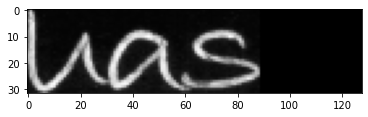




original_text =   his
predicted text = his

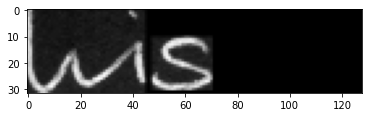




original_text =   in
predicted text = Ir

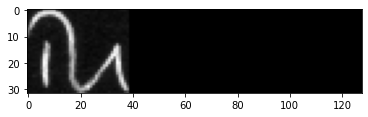




original_text =   tary
predicted text = fony

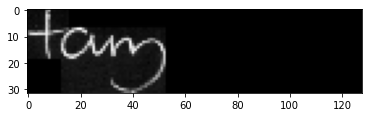




original_text =   Fisheries
predicted text = Brohoiss

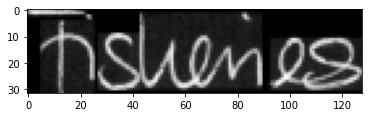




original_text =   Barclay
predicted text = Torday

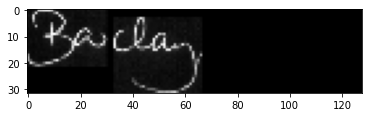




original_text =   the
predicted text = the

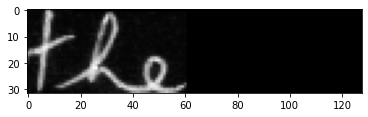




original_text =   Office
predicted text = Office

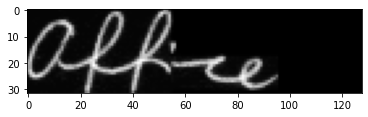




original_text =   he
predicted text = he

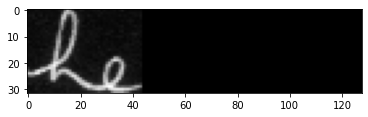




original_text =   Commission
predicted text = Bomissia

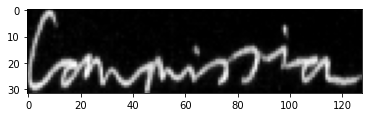




original_text =   held
predicted text = held

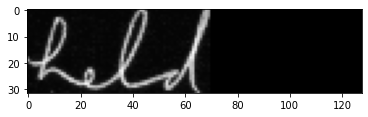




original_text =   a
predicted text = a

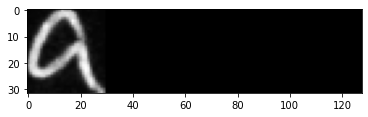




original_text =   French
predicted text = frenal

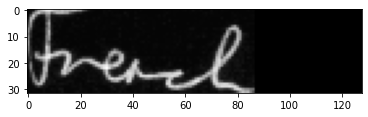




original_text =   Lloyd
predicted text = aogd

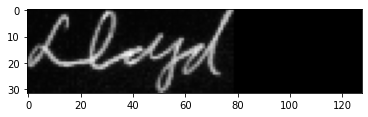




original_text =   seems
predicted text = srems

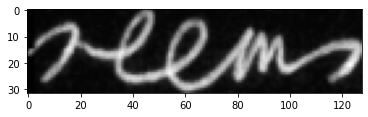




original_text =   it
predicted text = it

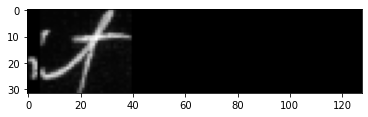




original_text =   NATO
predicted text = Mo

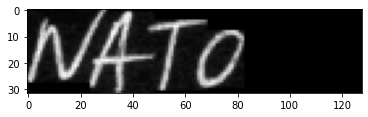




original_text =   demonstrations
predicted text = Lomastrations

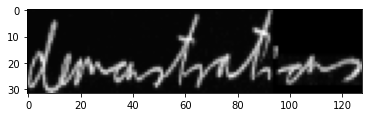




original_text =   monwealth
predicted text = mnonmealth

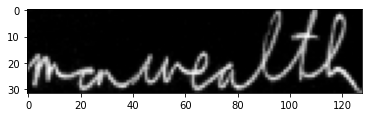




original_text =   in
predicted text = in

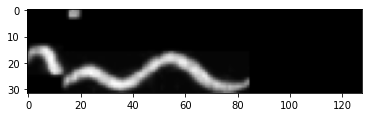




original_text =   Lloyd
predicted text = llagd

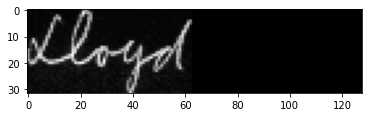




original_text =   ,
predicted text = ,

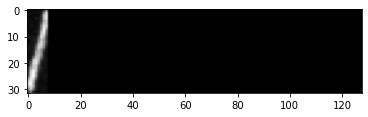




original_text =   Stores
predicted text = Shrres

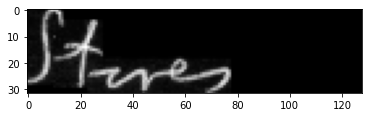




original_text =   been
predicted text = been

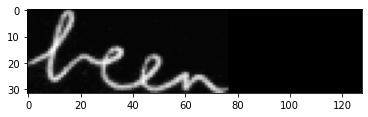




original_text =   the
predicted text = the

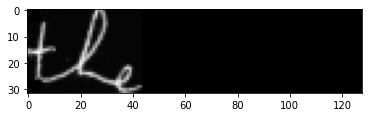




original_text =   of
predicted text = ot

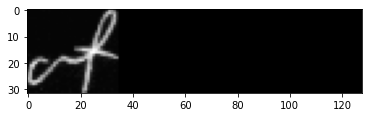




original_text =   compulsory
predicted text = compulooy

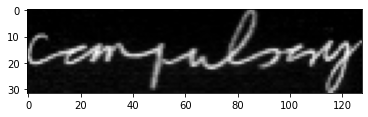




original_text =   .
predicted text = .

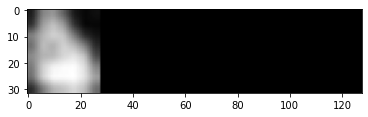




original_text =   storm
predicted text = stor

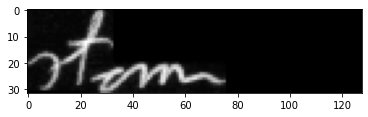




original_text =   the
predicted text = the

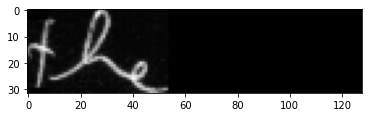




original_text =   on
predicted text = a

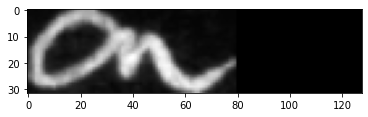




original_text =   know
predicted text = Burwt

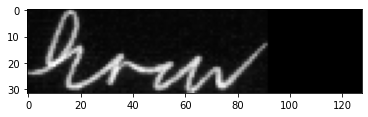




original_text =   his
predicted text = his

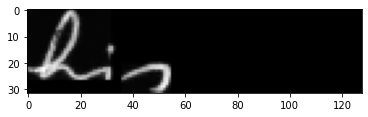




original_text =   strong
predicted text = strong

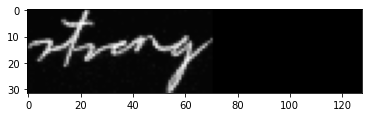




original_text =   and
predicted text = and

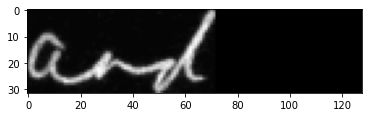




original_text =   (
predicted text = ,

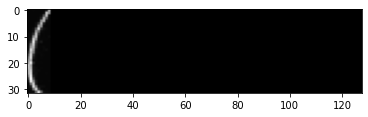




original_text =   the
predicted text = the

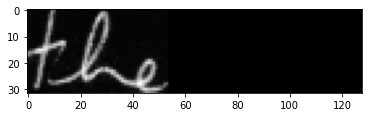




original_text =   has
predicted text = ts

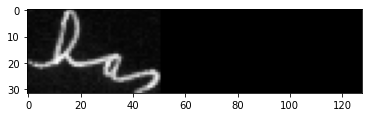




original_text =   ruthlessly
predicted text = mthlerly

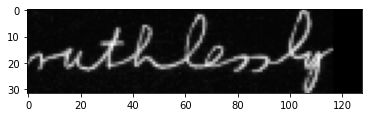




original_text =   a
predicted text = a

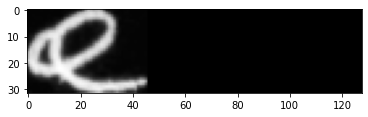




original_text =   powerful
predicted text = pomeyule

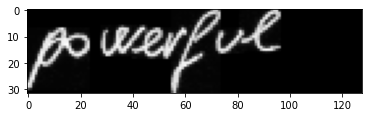




original_text =   "
predicted text = "

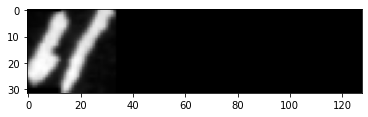




original_text =   In
predicted text = In

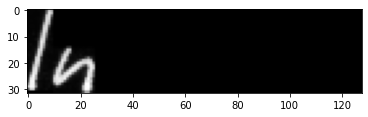




original_text =   essential
predicted text = aentiel

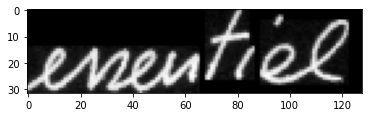




original_text =   an
predicted text = an

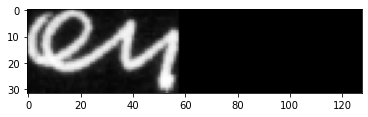




original_text =   a
predicted text = a

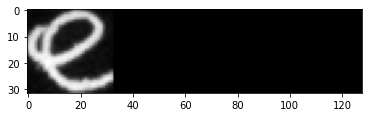




original_text =   measures
predicted text = meallier

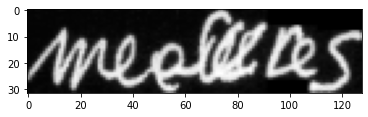




original_text =   how
predicted text = hw

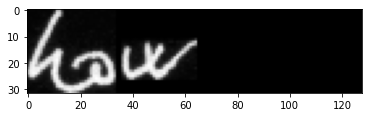




original_text =   Accra
predicted text = Heore

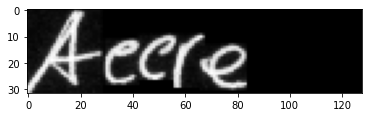




original_text =   ,
predicted text = ,

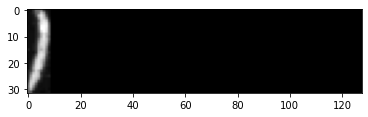




original_text =   demonstrators
predicted text = demonstators

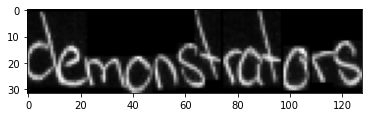




original_text =   If
predicted text = i

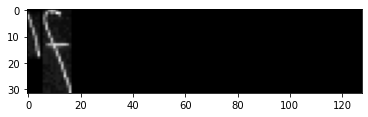




original_text =   he
predicted text = he

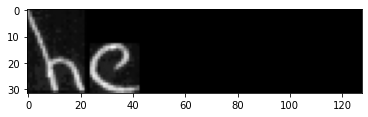




original_text =   '
predicted text = ,

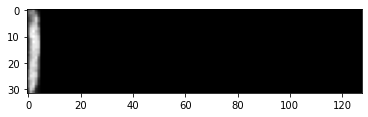




original_text =   and
predicted text = and

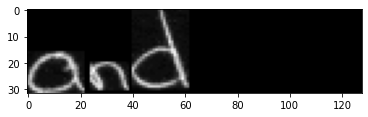




original_text =   .
predicted text = .

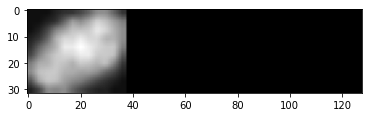




original_text =   have
predicted text = hav

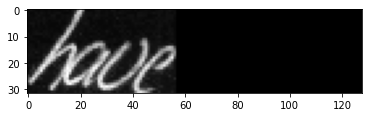




original_text =   of
predicted text = of

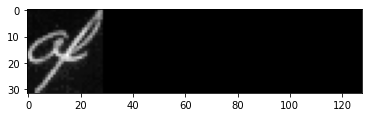




original_text =   .
predicted text = .

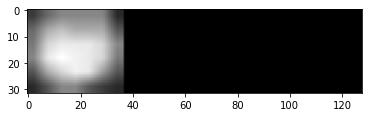




original_text =   this
predicted text = this

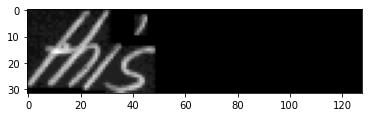




original_text =   .
predicted text = .

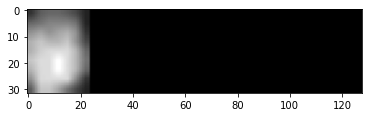




original_text =   the
predicted text = the

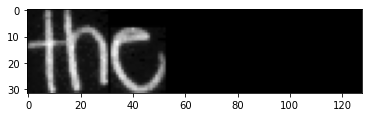




original_text =   a
predicted text = a

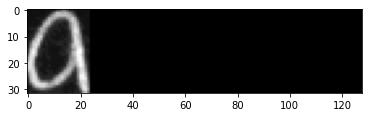




original_text =   on
predicted text = on

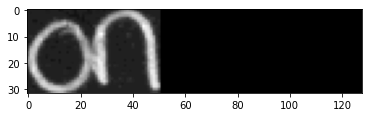




original_text =   members
predicted text = memnbess

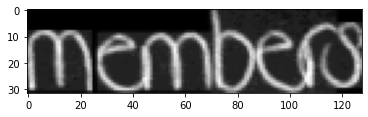




original_text =   the
predicted text = the

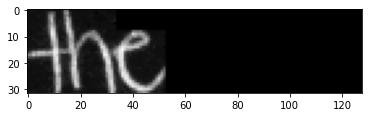




original_text =   put
predicted text = put

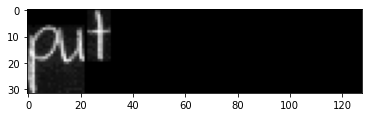




original_text =   It
predicted text = it

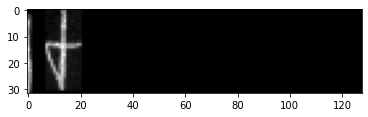




original_text =   pretext
predicted text = prrelerl

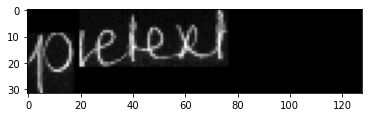




original_text =   "
predicted text = "t

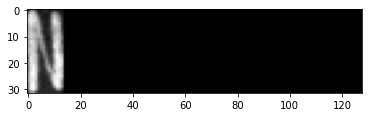




original_text =   connection
predicted text = commection

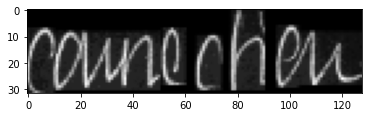




original_text =   that
predicted text = thkat

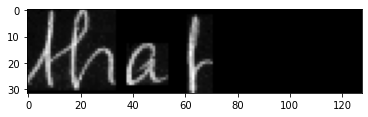




original_text =   the
predicted text = the

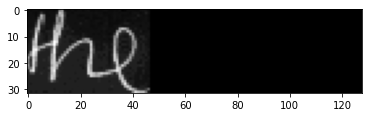




original_text =   Lady
predicted text = beely

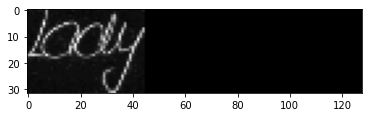




original_text =   why
predicted text = wsly

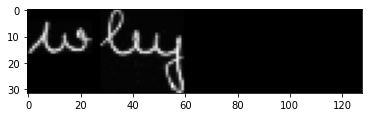




original_text =   peace
predicted text = prace

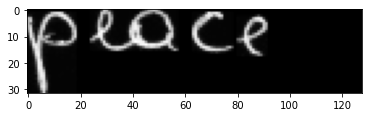




original_text =   The
predicted text = The

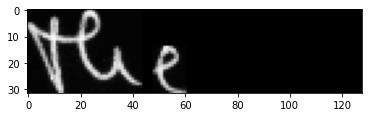




original_text =   such
predicted text = BnLoh

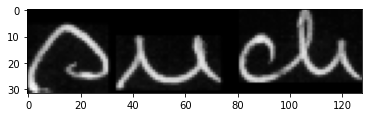




original_text =   was
predicted text = was

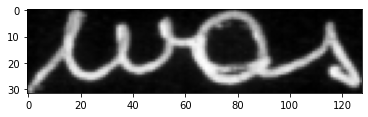




original_text =   ,
predicted text = ,

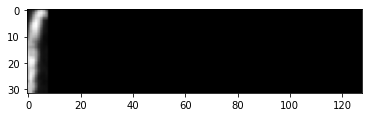




original_text =   is
predicted text = is

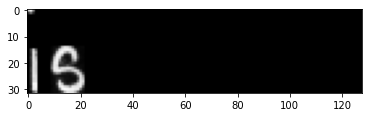




original_text =   That
predicted text = That

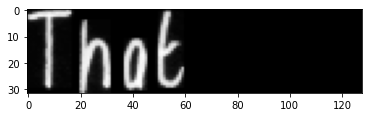




original_text =   he
predicted text = he

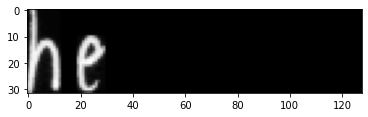




original_text =   prison
predicted text = origgn

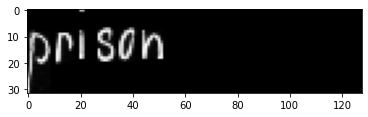




original_text =   to
predicted text = to

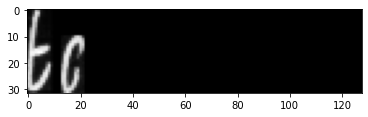




original_text =   conference
predicted text = conference

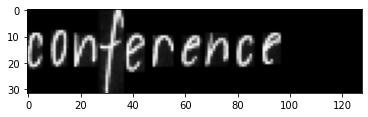




original_text =   "
predicted text = "

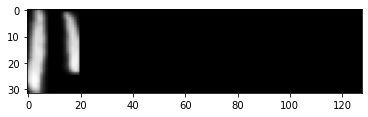




original_text =   a
predicted text = "

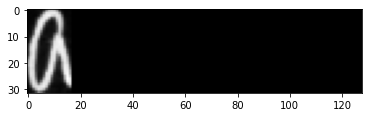




original_text =   planned
predicted text = choned

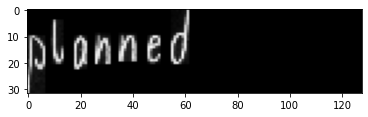




original_text =   today
predicted text = oadany

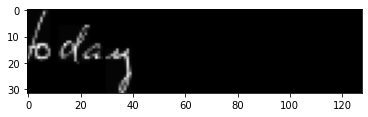




original_text =   Mr.
predicted text = Mr.

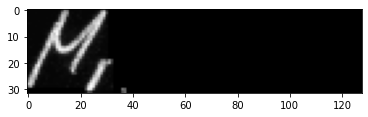




original_text =   was
predicted text = was

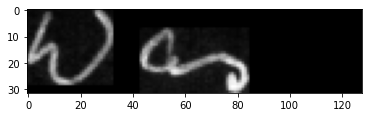




original_text =   ,
predicted text = ,

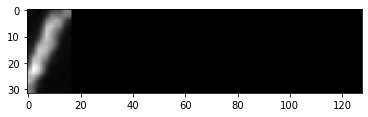




original_text =   outlawed
predicted text = outlauwed

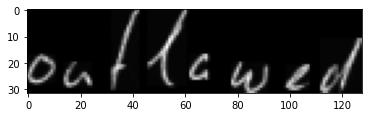




original_text =   supporters
predicted text = supportors

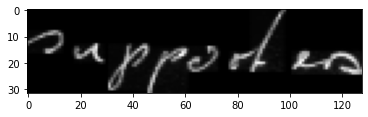




original_text =   the
predicted text = the

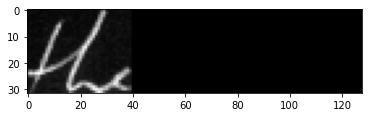




original_text =   which
predicted text = which

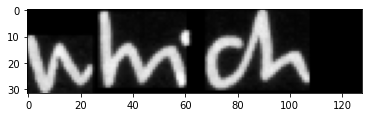




original_text =   since
predicted text = Sice

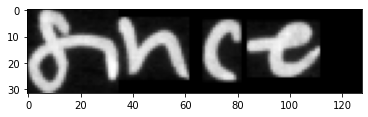




original_text =   the
predicted text = The

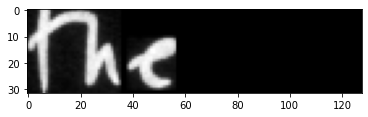




original_text =   had
predicted text = hod

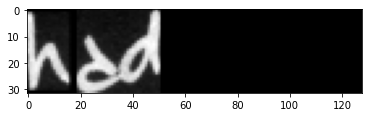




original_text =   people
predicted text = feesple

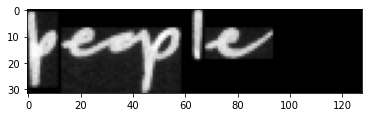




original_text =   were
predicted text = were

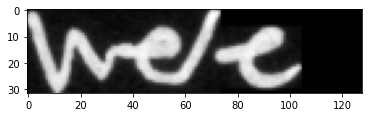




original_text =   "
predicted text = "

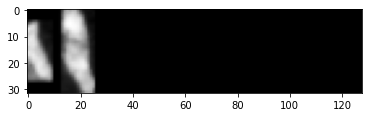




original_text =   statements
predicted text = stlemnons

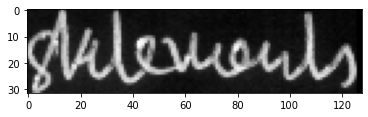




original_text =   am
predicted text = an

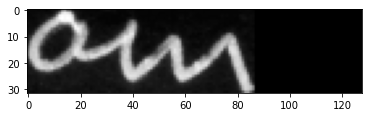




original_text =   good
predicted text = ged

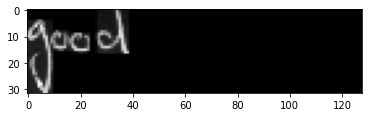




original_text =   that
predicted text = tha

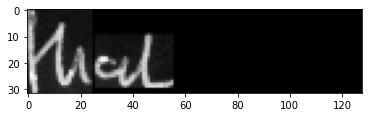




original_text =   done
predicted text = don

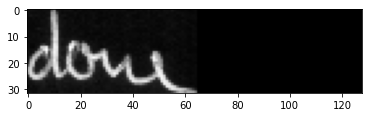




original_text =   he
predicted text = he

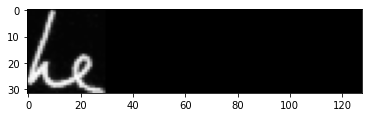




original_text =   Rhodesia
predicted text = Rhhodesia

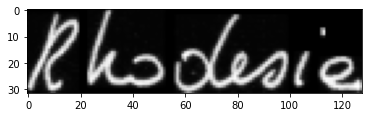




original_text =   its
predicted text = it

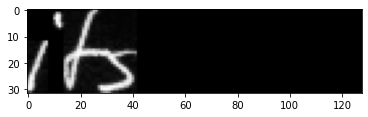




original_text =   in
predicted text = in

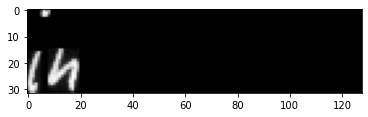




original_text =   JOHN
predicted text = PonY

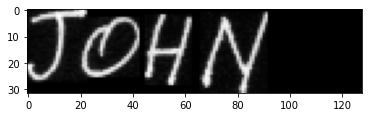




original_text =   the
predicted text = the

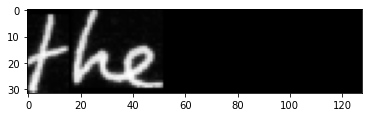




original_text =   yesterday
predicted text = yesterdy

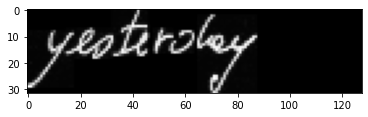




original_text =   ,
predicted text = ,

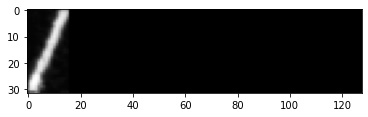




original_text =   an
predicted text = an

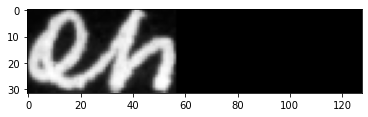




original_text =   expected
predicted text = alpaeted

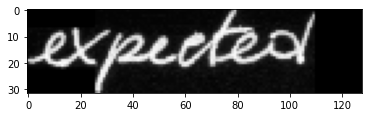




original_text =   the
predicted text = the

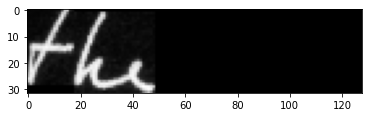




original_text =   an
predicted text = an

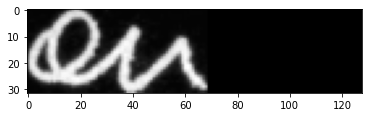




original_text =   any
predicted text = any

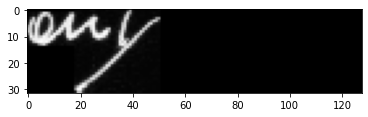




original_text =   with
predicted text = with

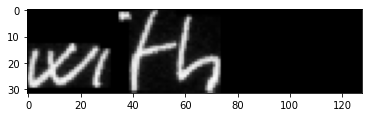




original_text =   and
predicted text = and

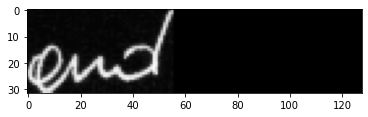




original_text =   Africans
predicted text = Africans

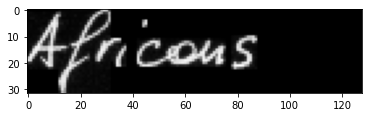




original_text =   A
predicted text = A

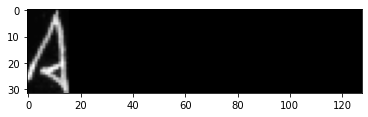




original_text =   Freddie
predicted text = Prreddie

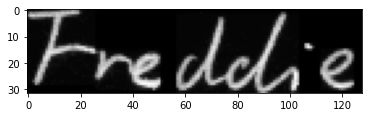




original_text =   at
predicted text = at

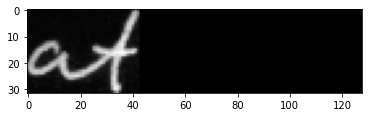




original_text =   yesterday
predicted text = yauntenday

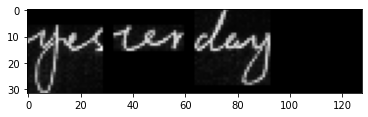




original_text =   heads
predicted text = heads

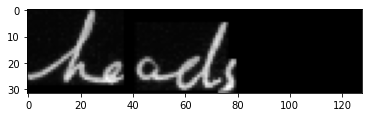




original_text =   a
predicted text = a

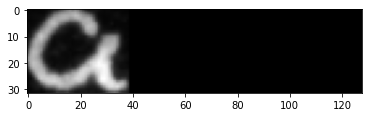




original_text =   and
predicted text = and

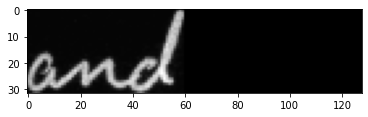




original_text =   arrived
predicted text = arrived

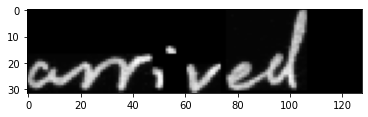




original_text =   before
predicted text = before

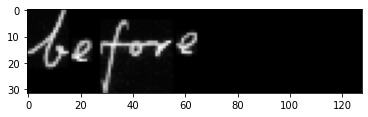




original_text =   question
predicted text = questinns

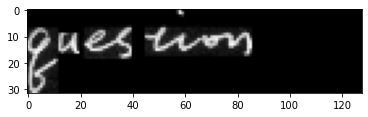




original_text =   thorniest
predicted text = tho7tnicst

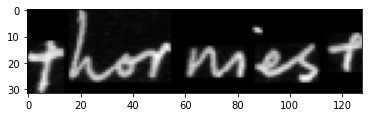




original_text =   relationships
predicted text = relationtips

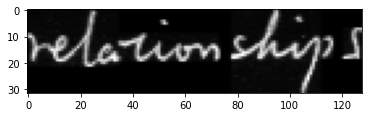




original_text =   A
predicted text = A

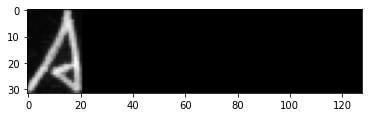




original_text =   form
predicted text = form

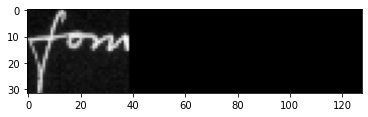




original_text =   not
predicted text = not

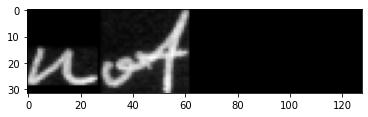




original_text =   wait
predicted text = wait

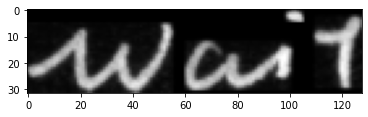




original_text =   will
predicted text = will

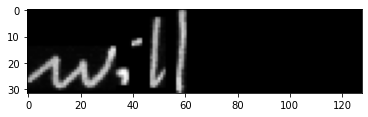




original_text =   Secretary
predicted text = Socrelary

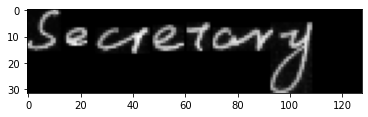




original_text =   to
predicted text = ts

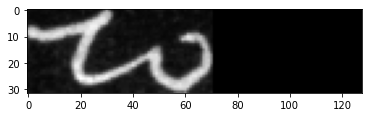




original_text =   prepared
predicted text = prornad

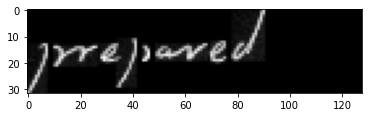




original_text =   anti-nuclear
predicted text = antiomuleor

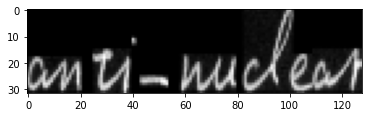




original_text =   action
predicted text = action

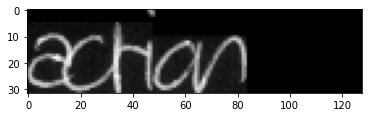




original_text =   of
predicted text = of

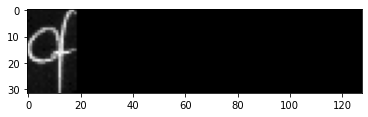




original_text =   peace
predicted text = prae

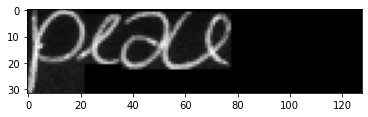




original_text =   61-year-old
predicted text = Ch-yorld

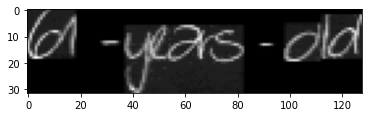




original_text =   The
predicted text = The

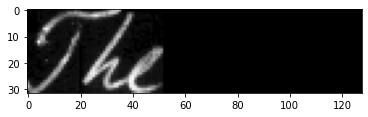




original_text =   -
predicted text = -

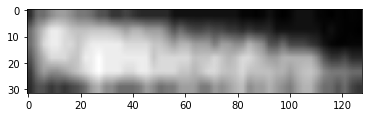




original_text =   being
predicted text = danrg

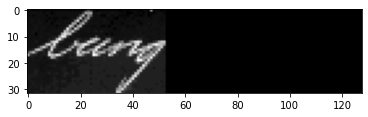




original_text =   used
predicted text = rod

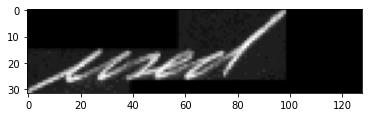




original_text =   Pancras
predicted text = Pcoss

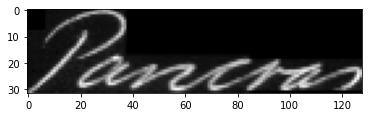




original_text =   with
predicted text = with

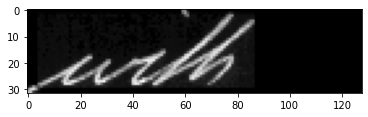




original_text =   plans
predicted text = plars

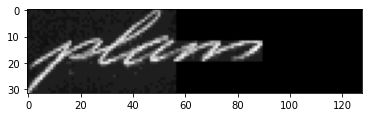




original_text =   Measures
predicted text = Mensurer

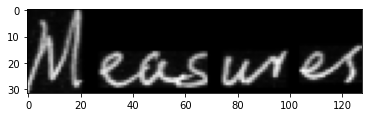




original_text =   call-out
predicted text = call-ont

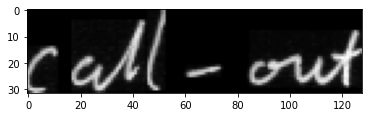




original_text =   750
predicted text = ar0

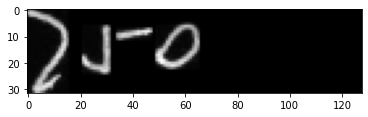




original_text =   area
predicted text = avee

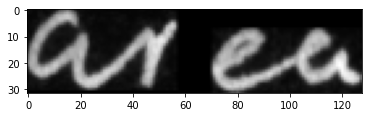




original_text =   .
predicted text = .

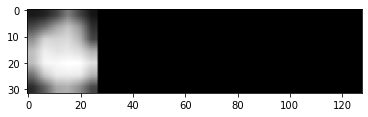




original_text =   Indo-
predicted text = indor-

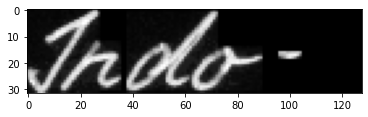




original_text =   Yugoslav
predicted text = Suopaaer

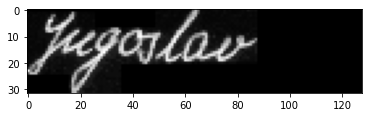




original_text =   been
predicted text = been

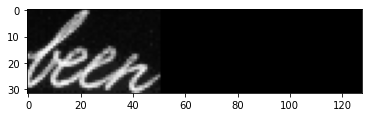




original_text =   and
predicted text = and

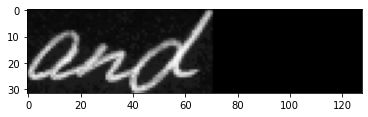




original_text =   the
predicted text = thee

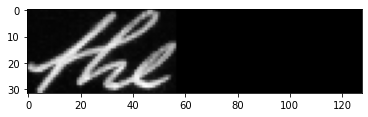




original_text =   on
predicted text = on

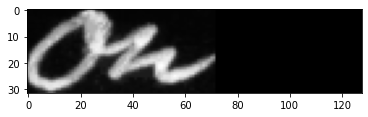




original_text =   some
predicted text = hmmce

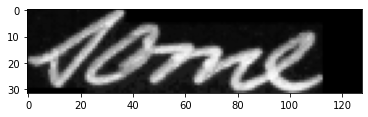




original_text =   .
predicted text = ,

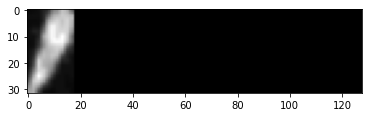




original_text =   ,
predicted text = ,

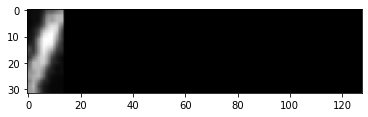




original_text =   consultative
predicted text = comoutative

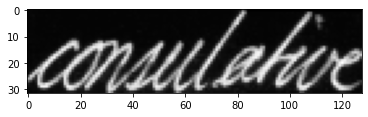




original_text =   economic
predicted text = coomonic

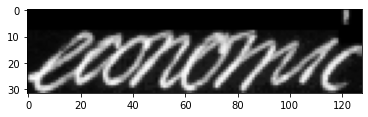




original_text =   to
predicted text = t

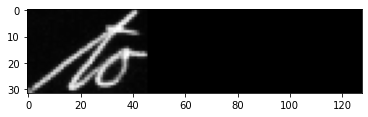




original_text =   in
predicted text = in

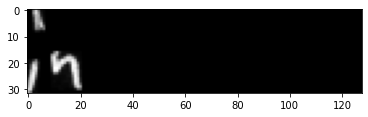




original_text =   view
predicted text = wlen

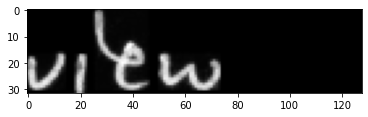




original_text =   of
predicted text = of

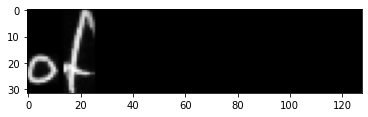




original_text =   more
predicted text = mhore

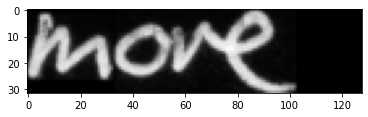




original_text =   work
predicted text = vork

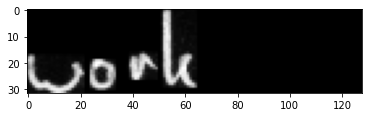




original_text =   .
predicted text = .

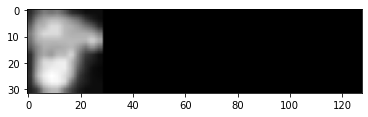




original_text =   the
predicted text = the

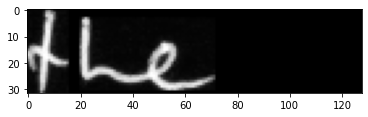




original_text =   on
predicted text = an

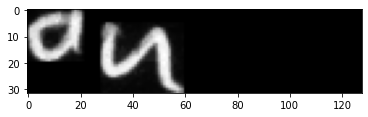




original_text =   emissaries
predicted text = emissames

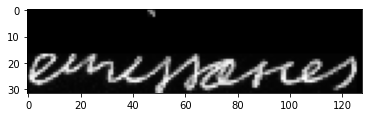




original_text =   arrived
predicted text = aurived

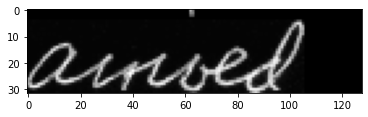




original_text =   Souvanna
predicted text = Couana

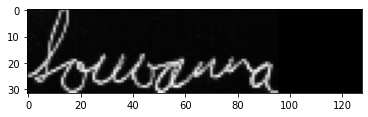




original_text =   return
predicted text = rhurn

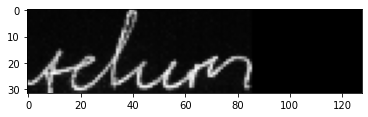




original_text =   been
predicted text = ban

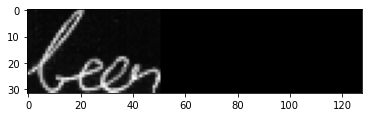




original_text =   that
predicted text = that

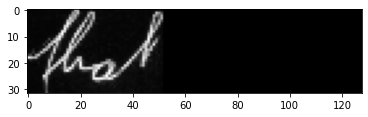




original_text =   yet
predicted text = gt

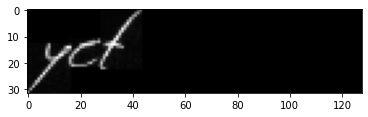




original_text =   by
predicted text = by

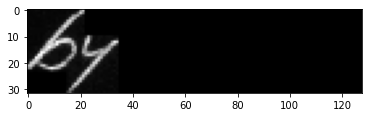




original_text =   himself
predicted text = kinell

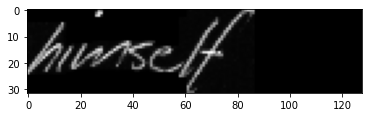




original_text =   His
predicted text = Hs

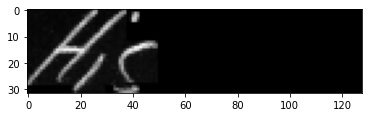




original_text =   the
predicted text = the

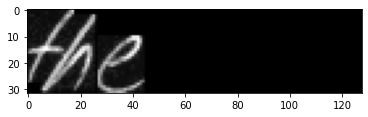




original_text =   virtual
predicted text = istrad

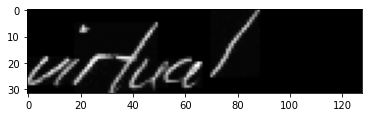




original_text =   the
predicted text = the

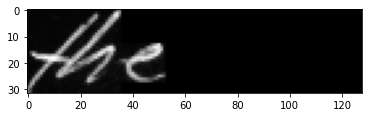




original_text =   of
predicted text = of

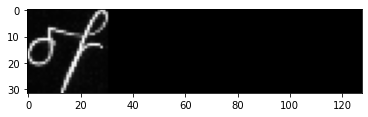




original_text =   the
predicted text = the

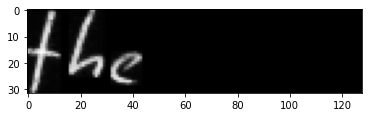




original_text =   the
predicted text = the

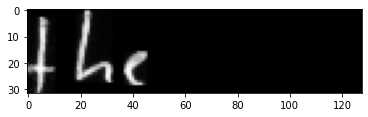




original_text =   of
predicted text = of

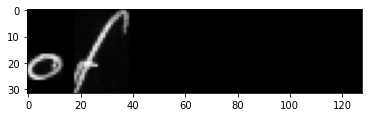




original_text =   Plain
predicted text = Mlain

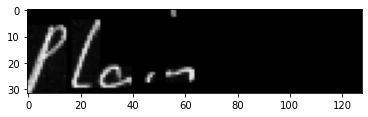




original_text =   firmly
predicted text = firnly

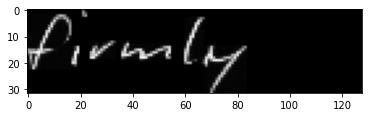




original_text =   recapture
predicted text = recapture

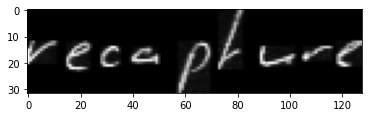




original_text =   60
predicted text = ao

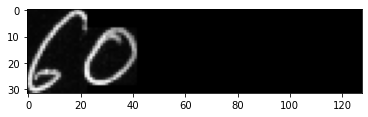




original_text =   correspondent
predicted text = Grerpondent

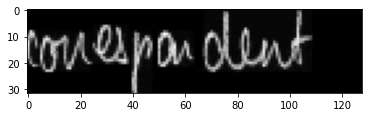




original_text =   Vang
predicted text = bary

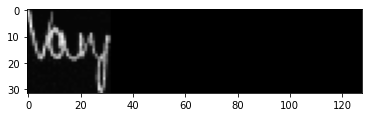




original_text =   sunning
predicted text = menny

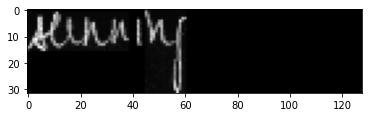




original_text =   the
predicted text = the

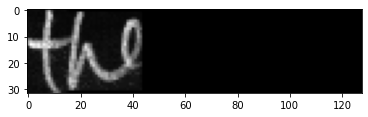




original_text =   10
predicted text = to

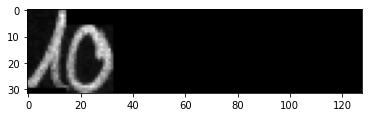




original_text =   conference
predicted text = anpfoned

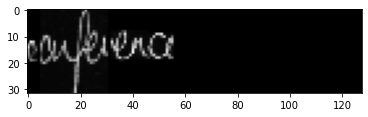




original_text =   since
predicted text = wee

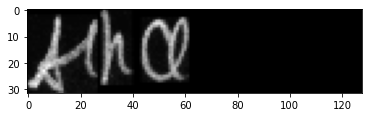




original_text =   leader
predicted text = leader

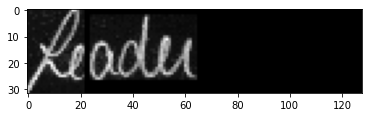




original_text =   occasion
predicted text = secasion

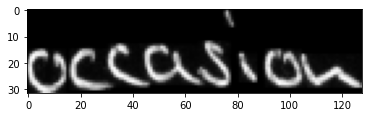




original_text =   simply
predicted text = sinpty

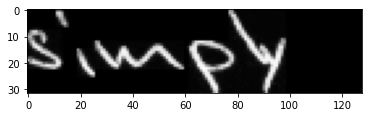




original_text =   supplant
predicted text = supplart

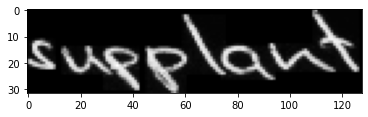




original_text =   laying
predicted text = Vaying

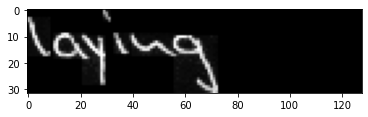




original_text =   .
predicted text = .

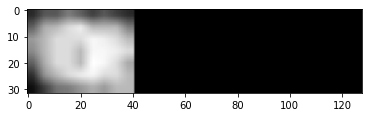




original_text =   of
predicted text = of

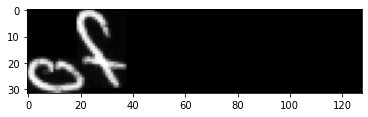




original_text =   is
predicted text = is

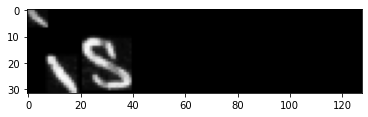




original_text =   Cabinet
predicted text = Cabincd

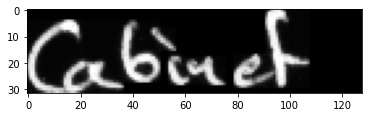




original_text =   called
predicted text = called

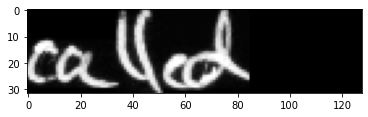




original_text =   accomplishments
predicted text = neonptiotuats

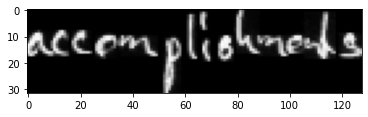




original_text =   and
predicted text = and

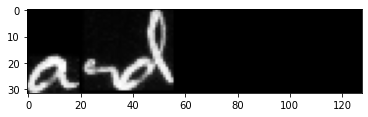




original_text =   illusion
predicted text = ituston

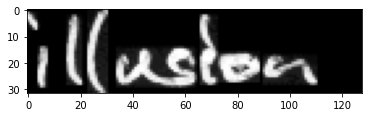




original_text =   has
predicted text = has

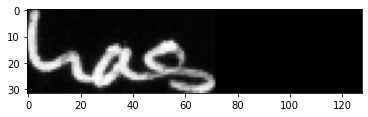




original_text =   uncertain
predicted text = nncentain

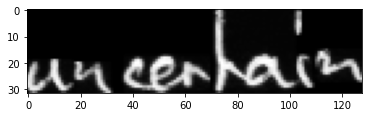




original_text =   Conservative
predicted text = Tenervslive

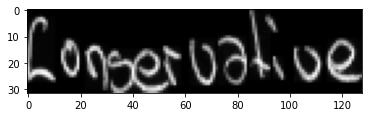




original_text =   in
predicted text = in

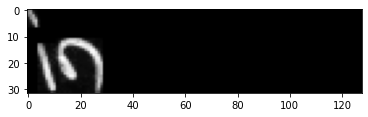




original_text =   badly
predicted text = bally

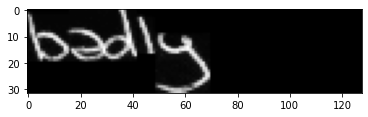




original_text =   elections
predicted text = dectioas

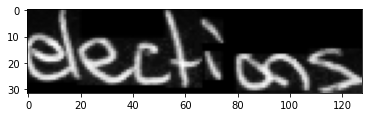




original_text =   one
predicted text = ore

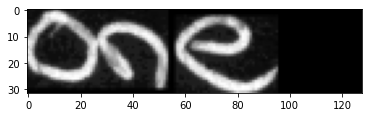




original_text =   in
predicted text = in

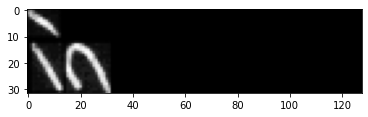




original_text =   and
predicted text = ad

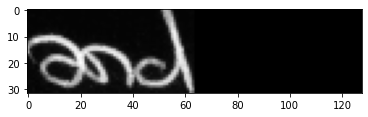




original_text =   Conservative
predicted text = Comernative

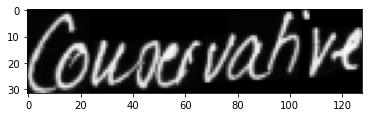




original_text =   for
predicted text = for

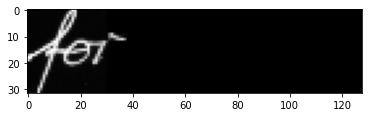




original_text =   in
predicted text = in

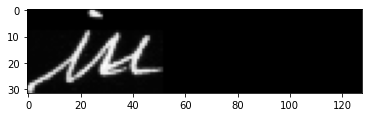




original_text =   were
predicted text = were

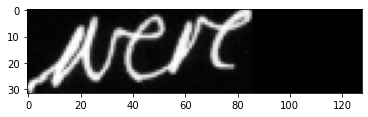




original_text =   federal
predicted text = lderal

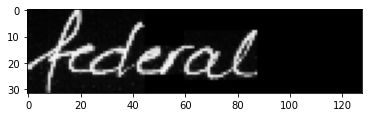




original_text =   cent
predicted text = cent

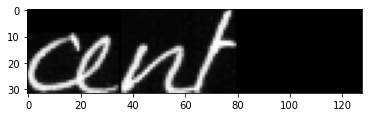




original_text =   C.C.F.
predicted text = crP.

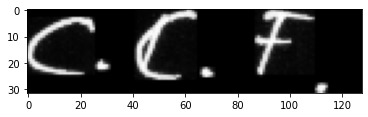




original_text =   Mr.
predicted text = Mr.

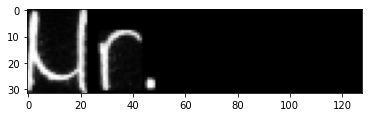




original_text =   an
predicted text = an

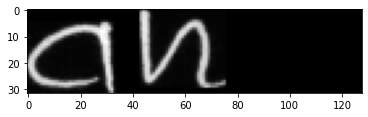




original_text =   ,
predicted text = ,

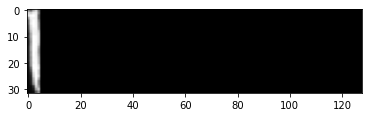




original_text =   far
predicted text = for

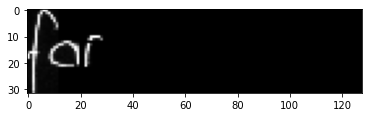




original_text =   Canada
predicted text = Eanada

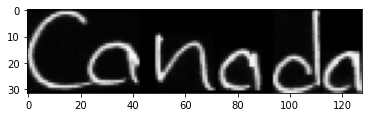




original_text =   national
predicted text = natiolal

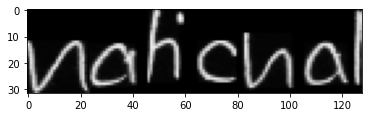




original_text =   difficult
predicted text = difiranlt

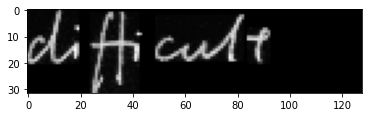




original_text =   of
predicted text = of

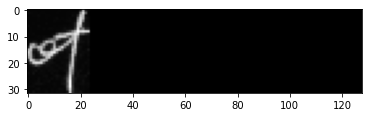




original_text =   that
predicted text = that

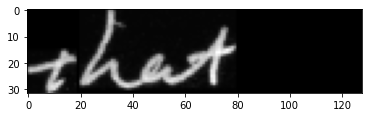




original_text =   .
predicted text = .

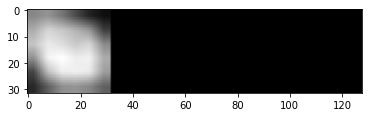




original_text =   the
predicted text = the

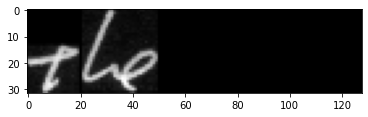




original_text =   or
predicted text = ar

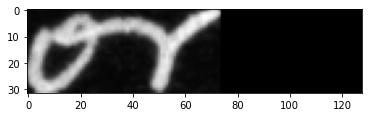




original_text =   father
predicted text = farther

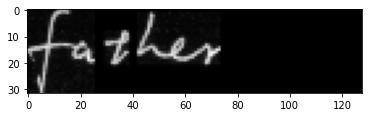




original_text =   the
predicted text = the

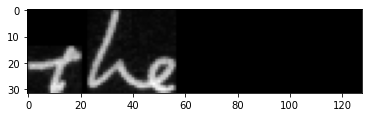




original_text =   in
predicted text = in

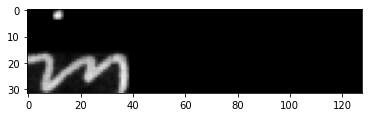




original_text =   regard
predicted text = regord

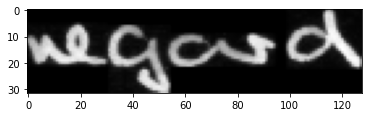




original_text =   egghead
predicted text = exoshead

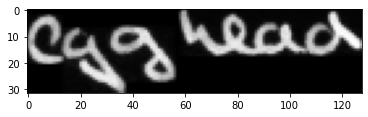




original_text =   now
predicted text = now

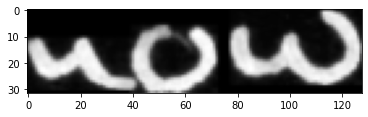




original_text =   has
predicted text = has

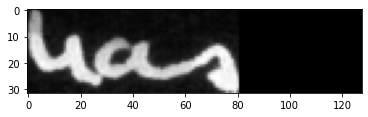




original_text =   and
predicted text = and

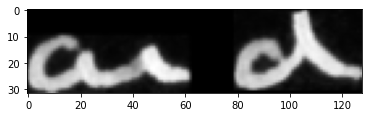




original_text =   being
predicted text = boing

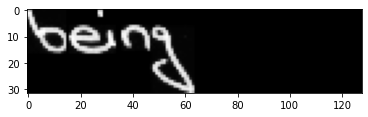




original_text =   he
predicted text = he

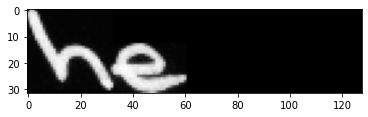




original_text =   baker
predicted text = Lookser

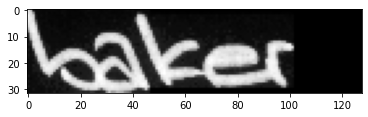




original_text =   has
predicted text = has

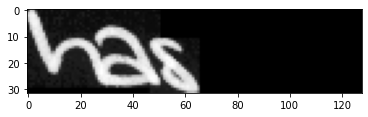




original_text =   in
predicted text = in

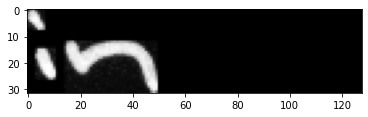




original_text =   Minister
predicted text = Minister

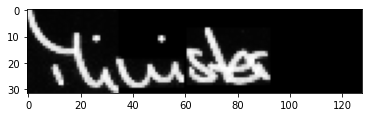




original_text =   now
predicted text = now

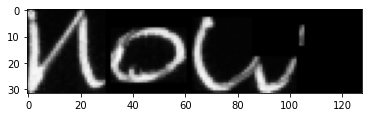




original_text =   and
predicted text = and

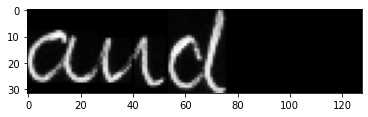




original_text =   Mike
predicted text = tike

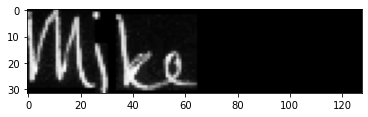




original_text =   ranging
predicted text = raming

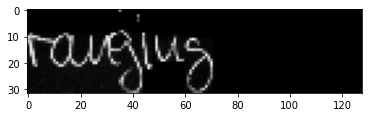




original_text =   the
predicted text = the

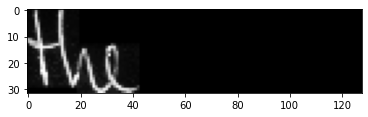




original_text =   ,
predicted text = ,

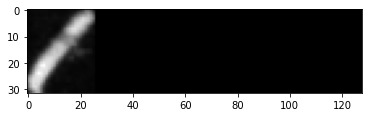




original_text =   tomorrow
predicted text = tomanou

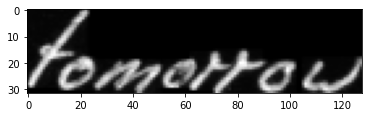




original_text =   space
predicted text = space

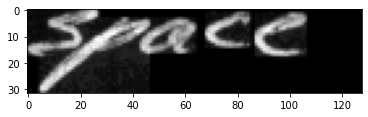




original_text =   the
predicted text = the

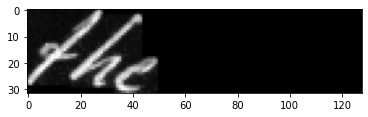




original_text =   British
predicted text = Bitish

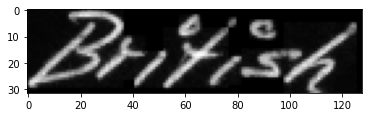




original_text =   they
predicted text = thoy

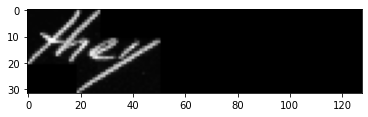




original_text =   was
predicted text = BxorE

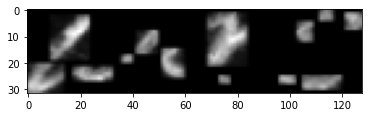




original_text =   that
predicted text = thet

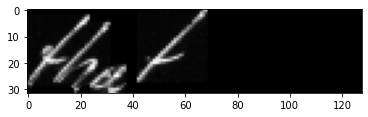




original_text =   scientific
predicted text = saintific

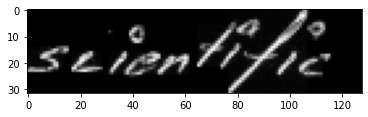




original_text =   to
predicted text = to

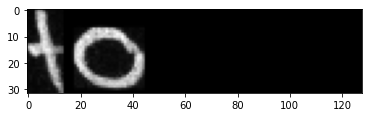




original_text =   Government
predicted text = Govemment

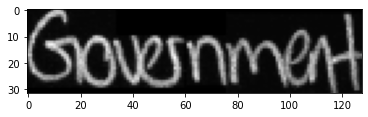




original_text =   ,
predicted text = ,

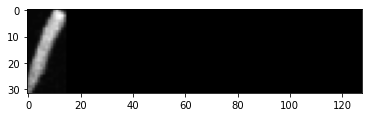




original_text =   would
predicted text = vaild

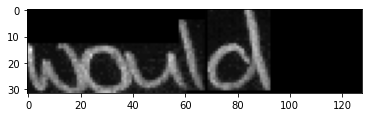




original_text =   something
predicted text = aoating

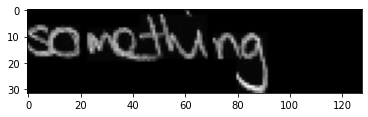




original_text =   year
predicted text = yper

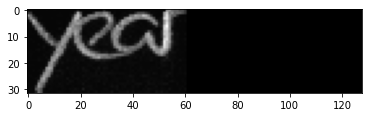




original_text =   is
predicted text = is

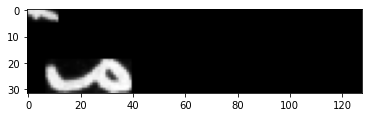




original_text =   convinced
predicted text = convineed

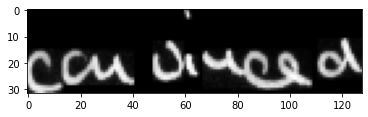




original_text =   so
predicted text = s

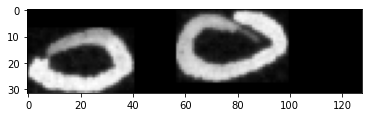




original_text =   constitute
predicted text = constitute

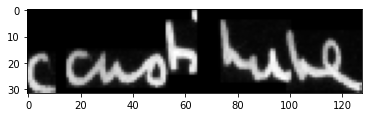




original_text =   extent
predicted text = exlent

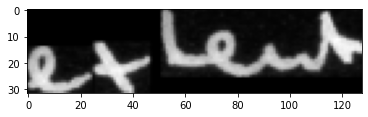




original_text =   of
predicted text = of

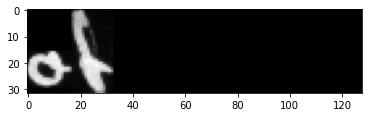




original_text =   will
predicted text = vil

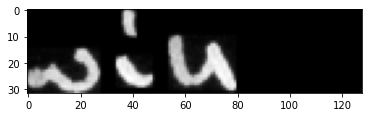




original_text =   is
predicted text = is

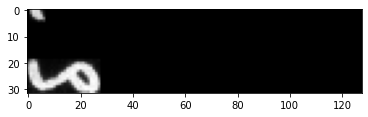




original_text =   reached
predicted text = reacked

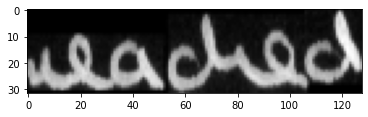




original_text =   first
predicted text = first

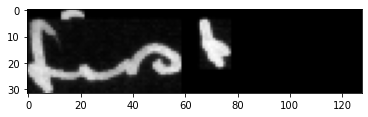




original_text =   .
predicted text = .

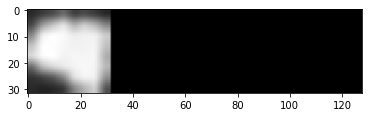




original_text =   British
predicted text = British

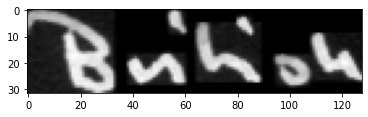




original_text =   ,
predicted text = ,

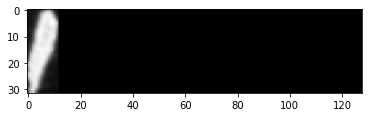




original_text =   Veronique
predicted text = Geesovice

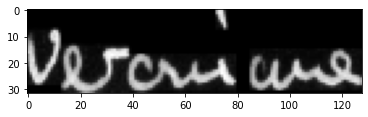




original_text =   Foreign
predicted text = Toreitn

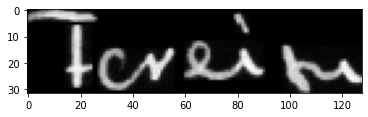




original_text =   Brussels
predicted text = Bonsals

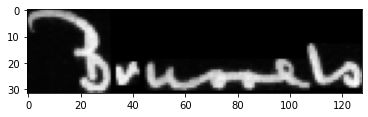




original_text =   rocket
predicted text = wochat

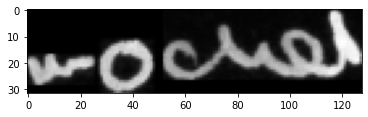




original_text =   obstacle
predicted text = oestacle

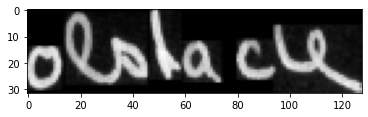




original_text =   or
predicted text = or

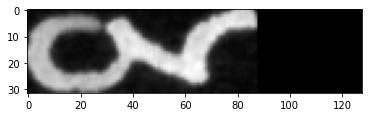




original_text =   any
predicted text = anyy

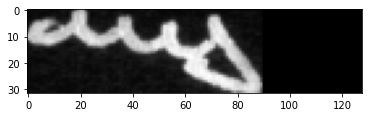




original_text =   is
predicted text = is

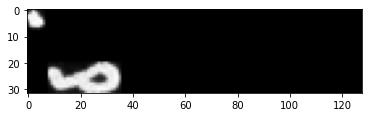




original_text =   Air
predicted text = Sirs

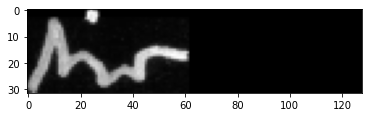




original_text =   Harold
predicted text = Marld

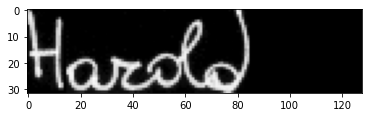




original_text =   at
predicted text = af

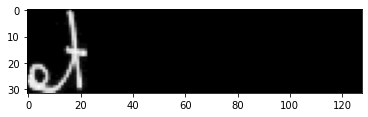




original_text =   their
predicted text = thair

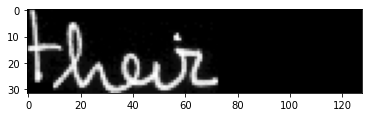




original_text =   to
predicted text = to

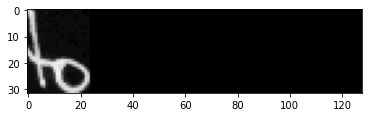




original_text =   policy
predicted text = policy

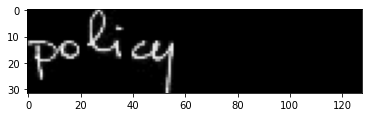




original_text =   to
predicted text = to

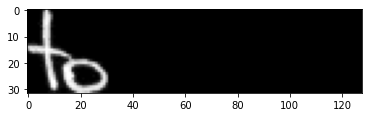




original_text =   recent
predicted text = recnt

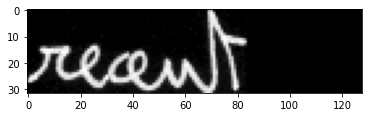




original_text =   made
predicted text = made

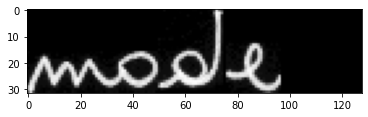




original_text =   Market
predicted text = Maarat

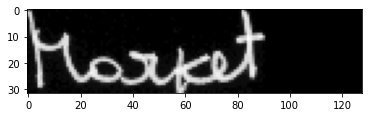




original_text =   meet
predicted text = meet

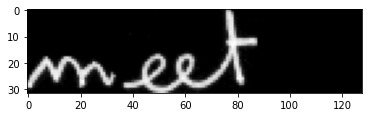




original_text =   Mr.
predicted text = M.

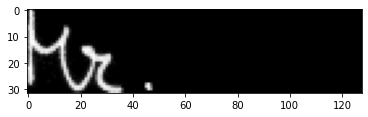




original_text =   membership
predicted text = mnamntastip

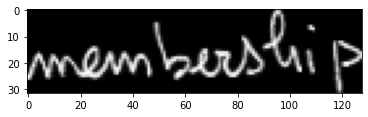




original_text =   an
predicted text = an

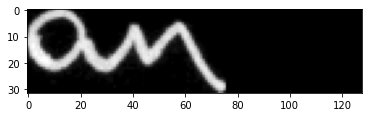




original_text =   Laos
predicted text = hass

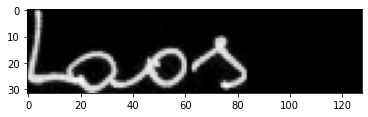




original_text =   Kennedy
predicted text = knsdy

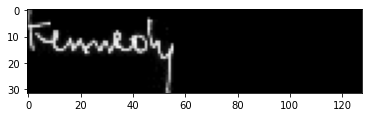




original_text =   Home
predicted text = Home

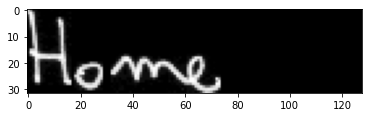




original_text =   the
predicted text = the

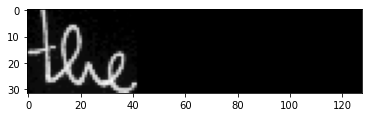




original_text =   in
predicted text = in

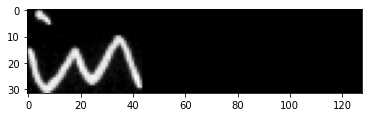




original_text =   to
predicted text = to

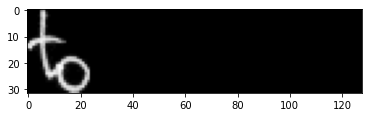




original_text =   be
predicted text = be

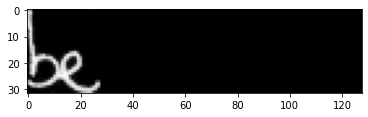




original_text =   Labour
predicted text = Labou

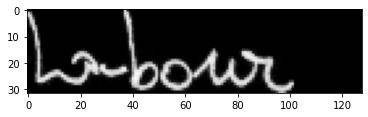




original_text =   asking
predicted text = cheing

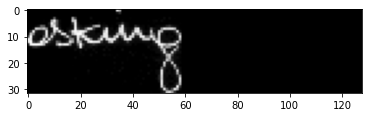




original_text =   Airport
predicted text = tiogort

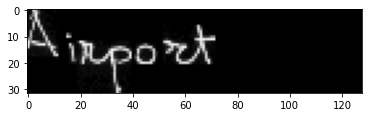




original_text =   He
predicted text = te

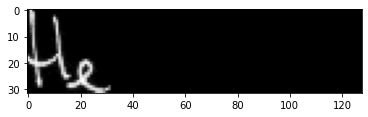




original_text =   report
predicted text = regort

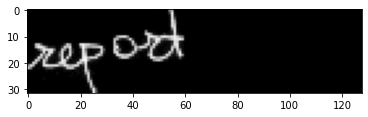




original_text =   The
predicted text = The

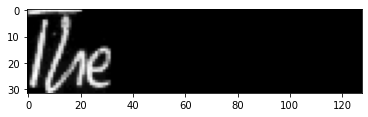




original_text =   talks
predicted text = talks

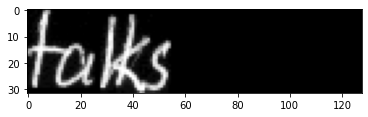




original_text =   ,
predicted text = ,

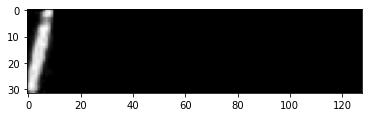




original_text =   discussions
predicted text = disussions

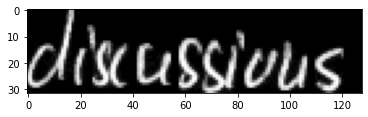




original_text =   ,
predicted text = ,

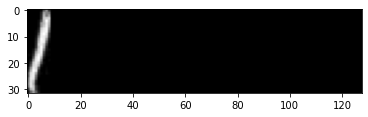




original_text =   two
predicted text = two

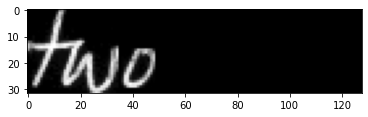




original_text =   was
predicted text = was

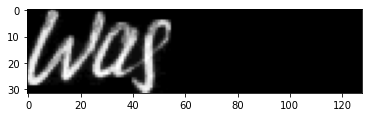




original_text =   expansion
predicted text = ahnsion

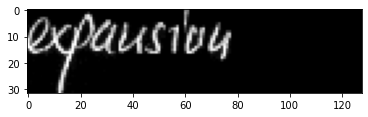




original_text =   alike
predicted text = alike

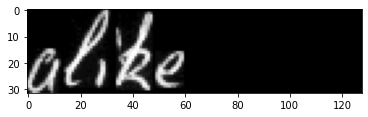




original_text =   noted
predicted text = noted

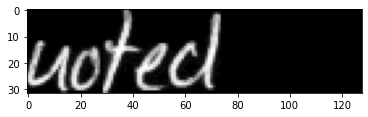




original_text =   the
predicted text = the

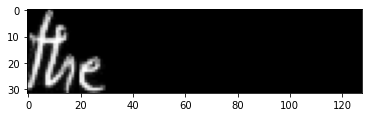




original_text =   lead
predicted text = lend

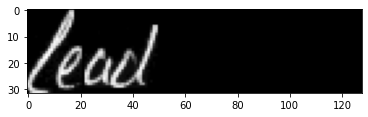




original_text =   conference
predicted text = confernce

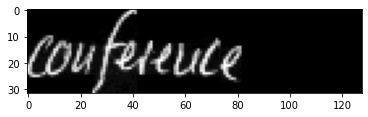




original_text =   nuclear
predicted text = Andear

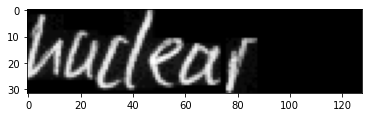




original_text =   "
predicted text = "

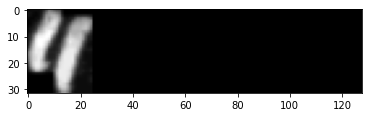




original_text =   and
predicted text = and

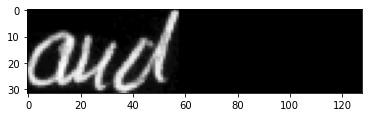




original_text =   the
predicted text = the

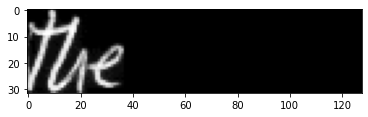




original_text =   .
predicted text = .

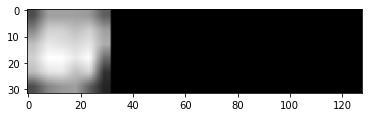




original_text =   followed
predicted text = fobened

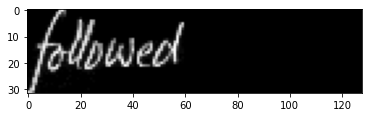




original_text =   Kennedy
predicted text = Knerdy

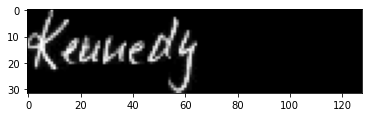




original_text =   Macmillan
predicted text = Macillanr

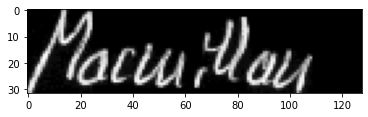




original_text =   Mr.
predicted text = Mr.

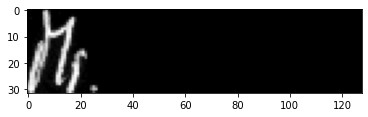




original_text =   a
predicted text = a

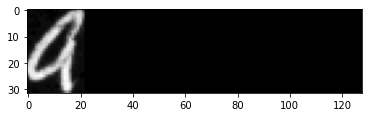




original_text =   to
predicted text = to

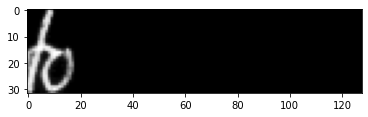




original_text =   Vienna
predicted text = Venna

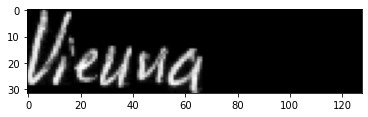




original_text =   in
predicted text = In

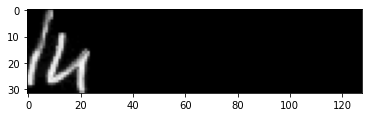




original_text =   fly
predicted text = ti

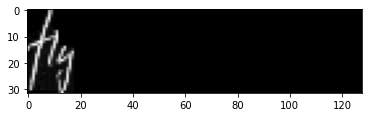




original_text =   Adenauer
predicted text = Atenauer

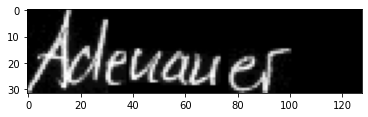




original_text =   of
predicted text = of

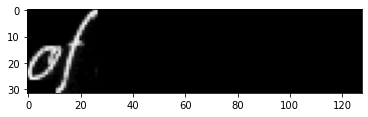




original_text =   should
predicted text = should

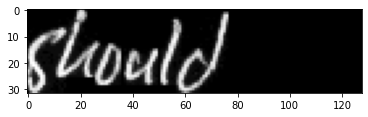




original_text =   smiling
predicted text = stiking

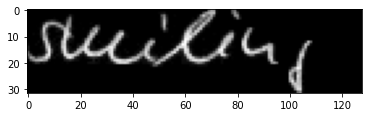




original_text =   Krushchov
predicted text = brustchov

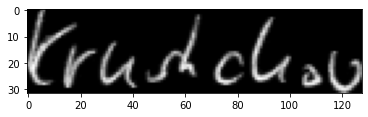




original_text =   talks
predicted text = talks

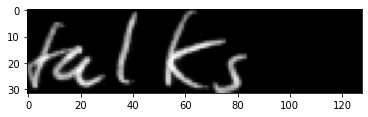




original_text =   .
predicted text = .

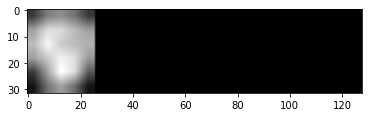




original_text =   up
predicted text = up

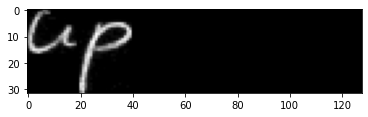




original_text =   Party
predicted text = Party

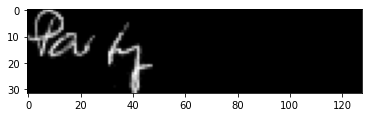




original_text =   gave
predicted text = geve

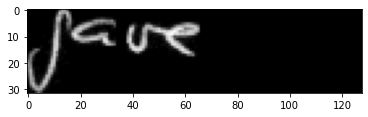




original_text =   war
predicted text = wr

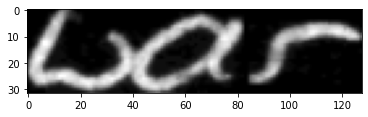




original_text =   stable
predicted text = stalle

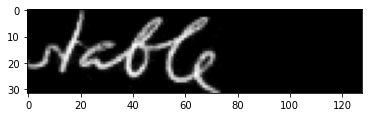




original_text =   good
predicted text = gooo

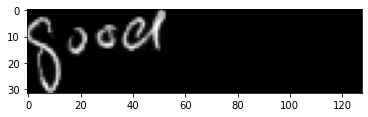




original_text =   airport
predicted text = Ei-port

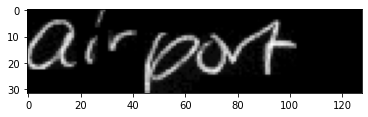




original_text =   President
predicted text = President

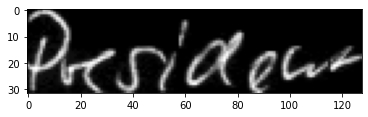




original_text =   Boeing
predicted text = Peing

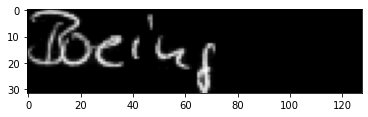




original_text =   Mr.
predicted text = Mr.

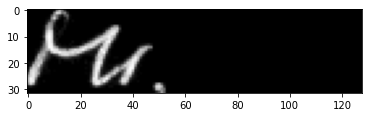




original_text =   delighted
predicted text = dblighutor

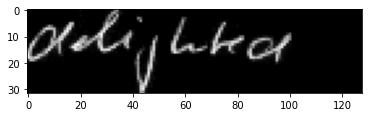




original_text =   surround
predicted text = surronnd

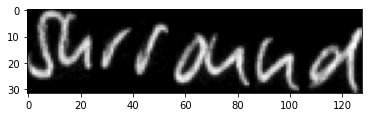




original_text =   before
predicted text = thefore

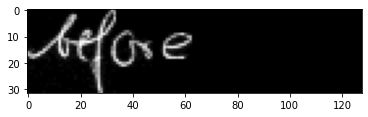




original_text =   hoped
predicted text = hopead

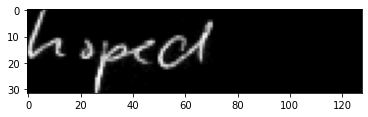




original_text =   "
predicted text = "

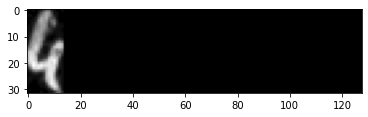




original_text =   Replying
predicted text = Porplsig

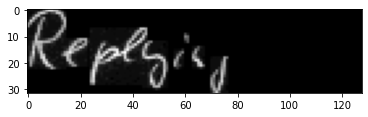




original_text =   the
predicted text = the

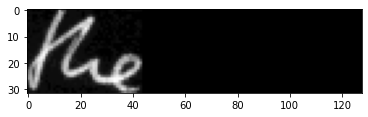




original_text =   he
predicted text = he

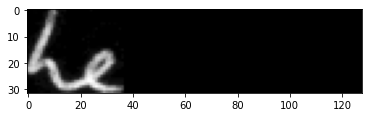




original_text =   striven
predicted text = showan

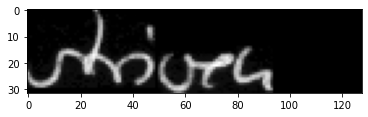




original_text =   the
predicted text = the

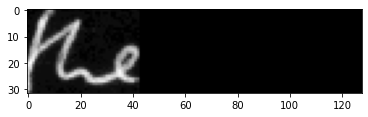




original_text =   MR.
predicted text = Mr.

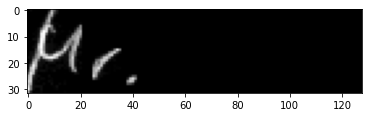




original_text =   missile
predicted text = missile

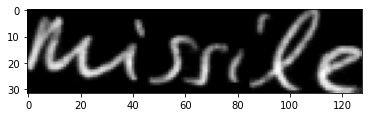




original_text =   of
predicted text = of

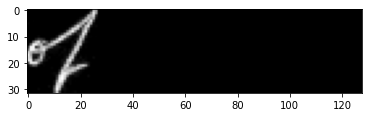




original_text =   .
predicted text = .

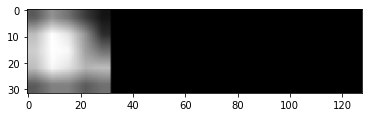




original_text =   to
predicted text = to

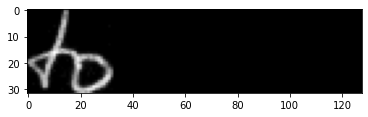




original_text =   and
predicted text = aaL

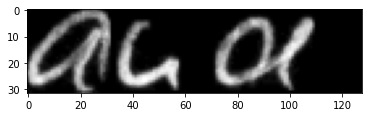




original_text =   long
predicted text = Rony

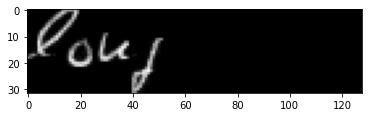




original_text =   annual
predicted text = ammal

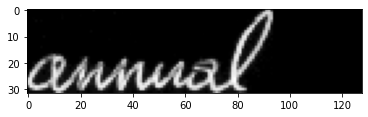




original_text =   Workers
predicted text = Nahos

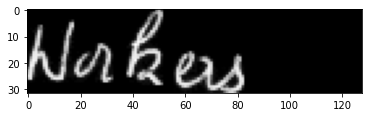




original_text =   was
predicted text = weas

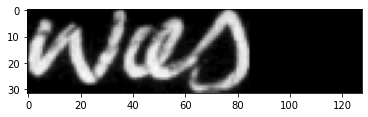




original_text =   conscious
predicted text = osmrions

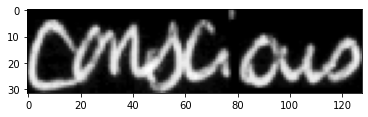




original_text =   Polaris
predicted text = Plaus

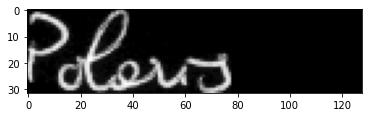




original_text =   even
predicted text = bven

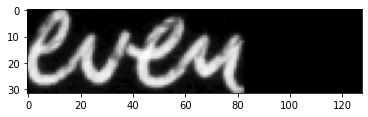




original_text =   their
predicted text = their

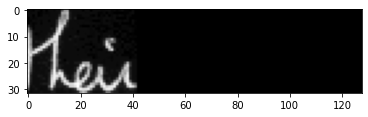




original_text =   the
predicted text = the

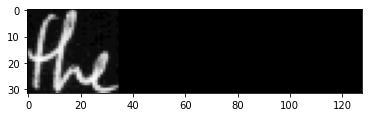




original_text =   an
predicted text = ae

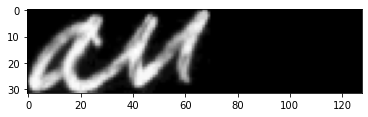




original_text =   it
predicted text = it

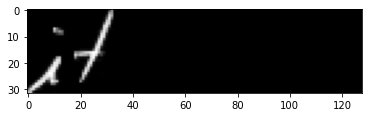




original_text =   negotiate
predicted text = mgohat

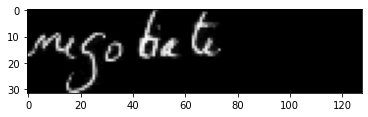




original_text =   .
predicted text = .

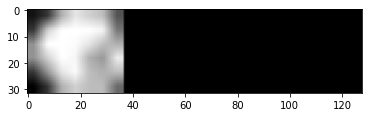




original_text =   he
predicted text = the

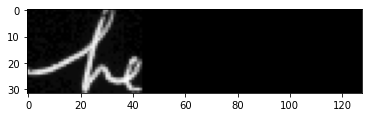




original_text =   and
predicted text = and

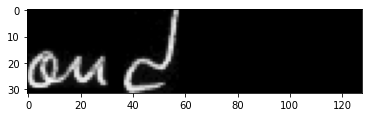




original_text =   apply
predicted text = a

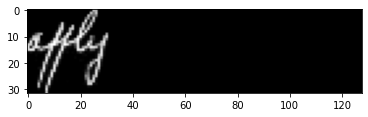




original_text =   Soviet
predicted text = Soviet

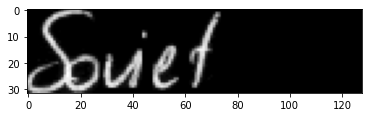




original_text =   ,
predicted text = ,

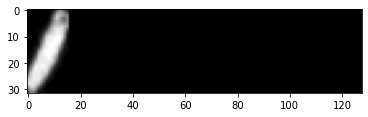




original_text =   for
predicted text = for

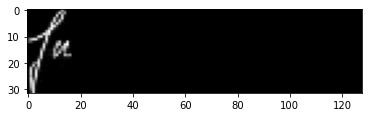




original_text =   the
predicted text = the

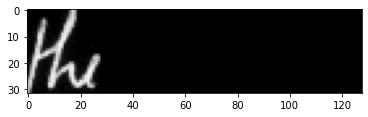




original_text =   the
predicted text = the

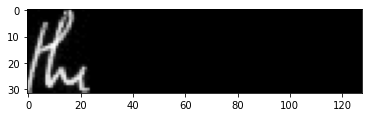




original_text =   the
predicted text = the

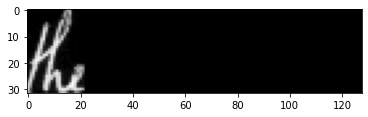




original_text =   was
predicted text = was

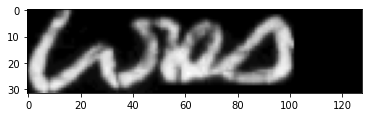




original_text =   ,
predicted text = ,

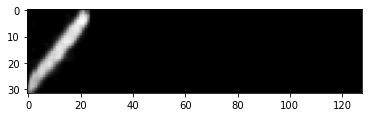




original_text =   two
predicted text = tuo

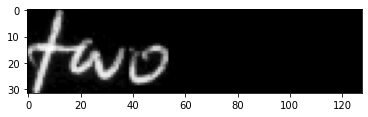




original_text =   more
predicted text = mere

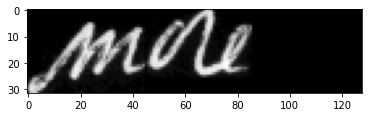




original_text =   conference
predicted text = enfome

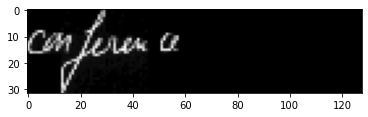




original_text =   reflect
predicted text = regfet

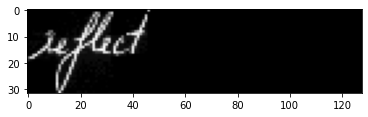




original_text =   Gaitskell
predicted text = Gaitoell

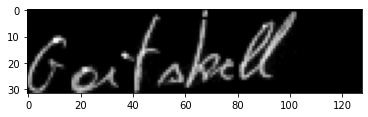




original_text =   ,
predicted text = ,

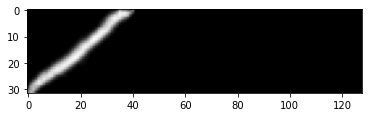




original_text =   reports
predicted text = nepport

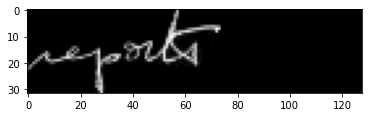




original_text =   recommending
predicted text = recommnnint

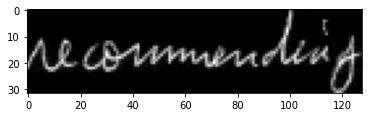




original_text =   emphasis
predicted text = cnphed

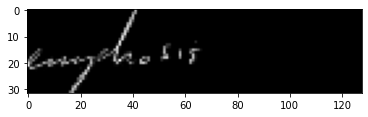




original_text =   To
predicted text = Tro

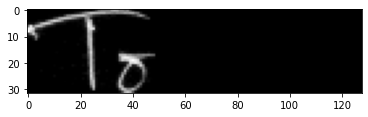




original_text =   should
predicted text = shoull

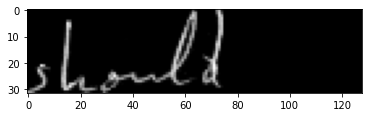




original_text =   of
predicted text = of

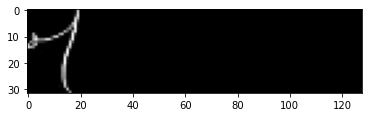




original_text =   hope
predicted text = hon

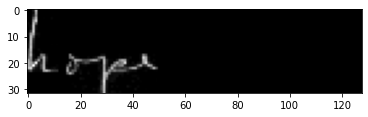




original_text =   the
predicted text = the

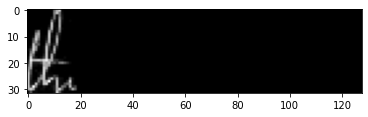




original_text =   of
predicted text = of

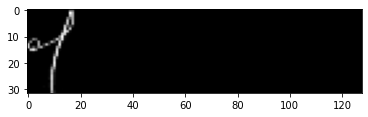




original_text =   prepared
predicted text = prpanl

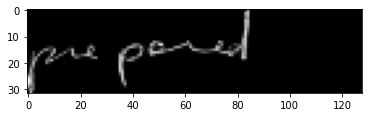




original_text =   disarmament
predicted text = tormament

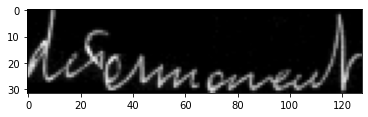




original_text =   the
predicted text = te

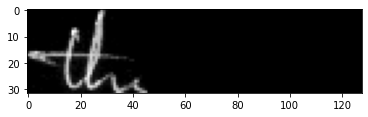




original_text =   opportunity
predicted text = sprtunty

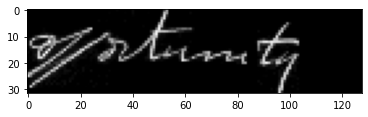




original_text =   that
predicted text = that

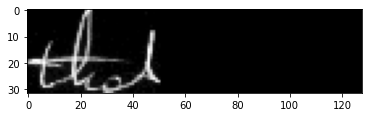

In [22]:

# load the saved best model weights
act_model.load_weights(filepath)

# predict outputs on validation images
prediction = act_model.predict(valid_images)
 
# use CTC decoder
decoded = K.ctc_decode(prediction, 
                       input_length=np.ones(prediction.shape[0]) * prediction.shape[1],
                       greedy=True)[0][0]
out = K.get_value(decoded)
# Levenshtein distance - Calculate string similarity between Orinigal Lables v/s Predicted Labels 
import Levenshtein as lv
total_jaro = 0
total_rati = 0
# see the results
for i, x in enumerate(out):
    print("\noriginal_text =  ", valid_original_text[i])
    print("predicted text = ", end = '')
    letters=''
    for p in x:
        if int(p) != -1:
            letters+=char_list[int(p)]
            print(char_list[int(p)], end = '')
    plt.imshow(valid_images[i].reshape(32,128), cmap=plt.cm.gray)
    plt.show()
    print('\n')
    total_jaro+=lv.jaro(letters, valid_original_text[i])
    total_rati+=lv.ratio(letters, valid_original_text[i])



In [23]:
print('Levenshtein.jaro similarity :', total_jaro/len(out))
print('Levenshtein.ratio similarity:', total_rati/len(out))

Levenshtein.jaro similarity : 0.8719607257278499
Levenshtein.ratio similarity: 0.8282608623849298


original_text =   the
predicted text = the

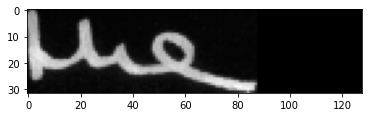



original_text =   Colonial
predicted text = Colonial

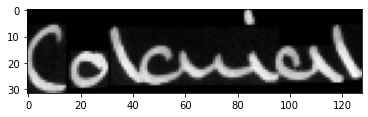



original_text =   Secretary
predicted text = Secretary

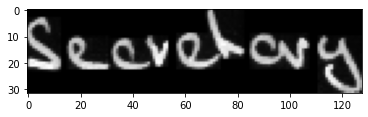



original_text =   ,
predicted text = ,

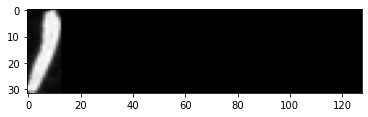



original_text =   Mr.
predicted text = Mr.

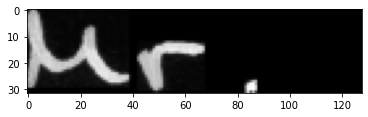



original_text =   Iain
predicted text = Iain

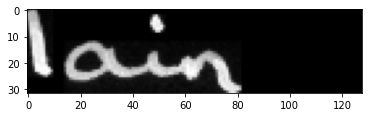



original_text =   Macleod
predicted text = Macleod

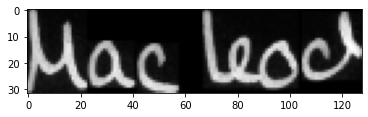



original_text =   is
predicted text = is

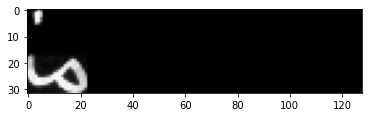



original_text =   insisting
predicted text = insiting

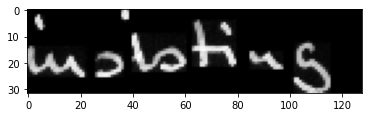



original_text =   on
predicted text = on

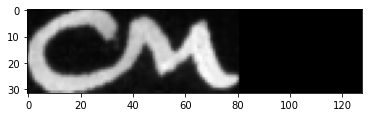



original_text =   a
predicted text = a

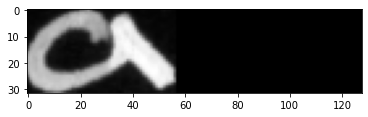



original_text =   policy
predicted text = potioy

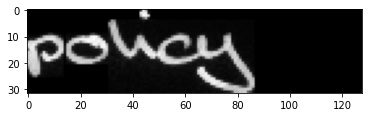



original_text =   of
predicted text = of

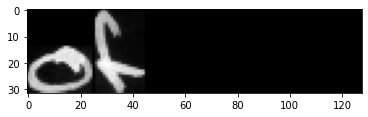



original_text =   change
predicted text = change

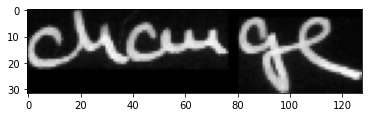



original_text =   .
predicted text = .

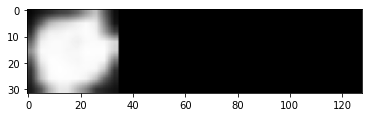



original_text =   Macleod
predicted text = Maclead

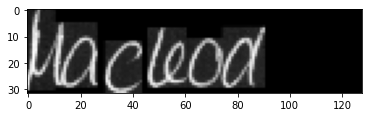



original_text =   ,
predicted text = ,

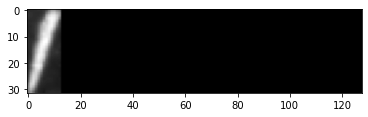



original_text =   is
predicted text = is

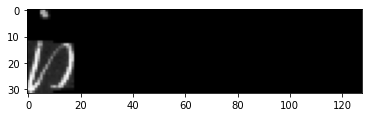



original_text =   on
predicted text = on

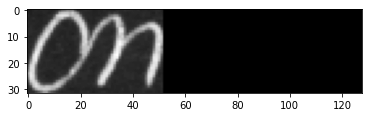



original_text =   a
predicted text = a

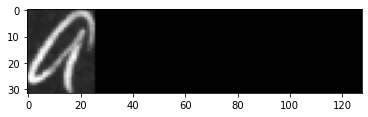



original_text =   policy
predicted text = palicy

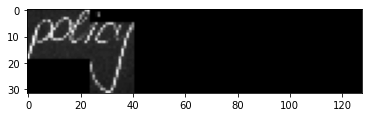



original_text =   of
predicted text = of

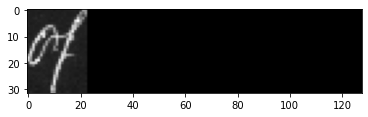



original_text =   change
predicted text = cage

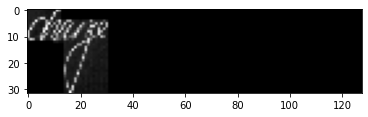



original_text =   .
predicted text = .

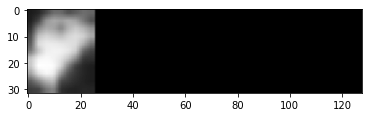



original_text =   Sir
predicted text = Sir

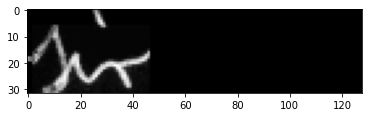



original_text =   Roy's
predicted text = Roy's

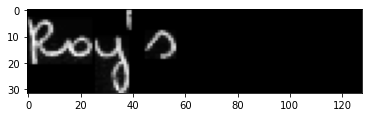



original_text =   United
predicted text = Uniterd

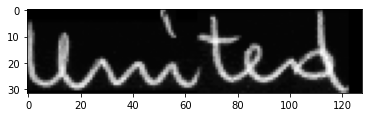



original_text =   Party
predicted text = Pantly

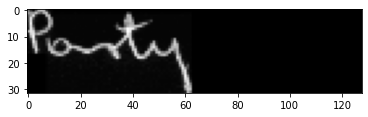



original_text =   is
predicted text = is

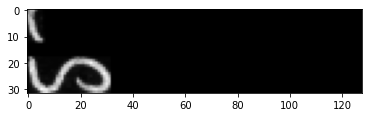



original_text =   boycotting
predicted text = bogrotting

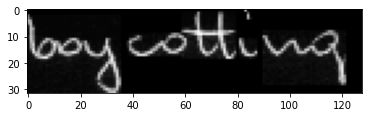



original_text =   the
predicted text = the

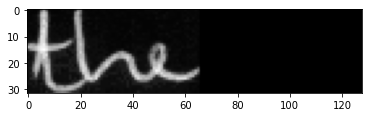



original_text =   London
predicted text = Loudon

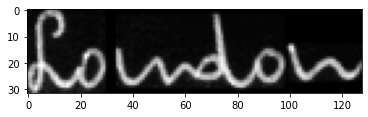



original_text =   talks
predicted text = talkss

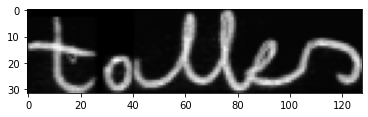



original_text =   on
predicted text = an

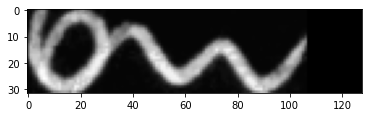



original_text =   the
predicted text = the

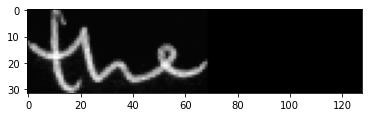



original_text =   Protectorate's
predicted text = frotentorale's

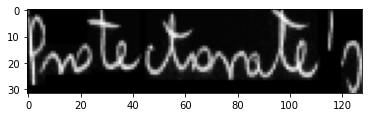



original_text =   .
predicted text = .

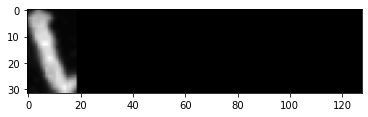



original_text =   Said
predicted text = Said

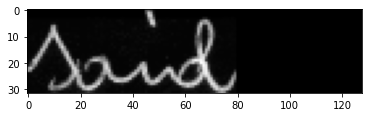



original_text =   Mr.
predicted text = Mr.

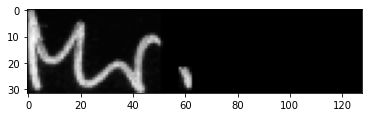



original_text =   Nkumbula
predicted text = Nkaumbula

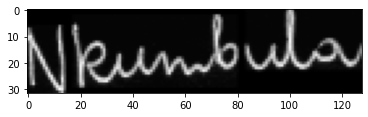



original_text =   last
predicted text = last

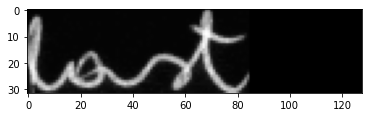



original_text =   night
predicted text = night

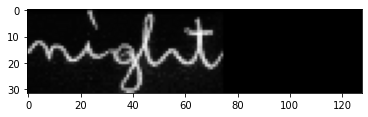



original_text =   :
predicted text = :f

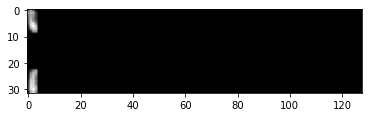



original_text =   "
predicted text = "

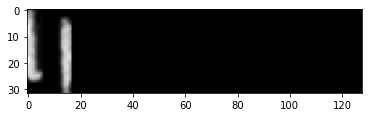



original_text =   We
predicted text = be

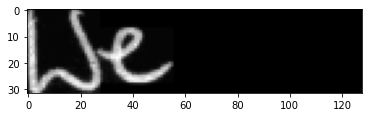



original_text =   to
predicted text = to

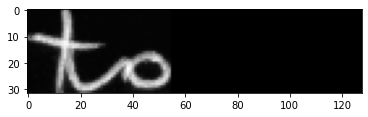



original_text =   discuss
predicted text = discuss

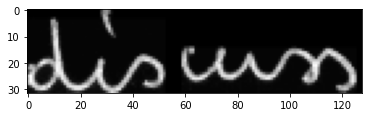



original_text =   what
predicted text = what

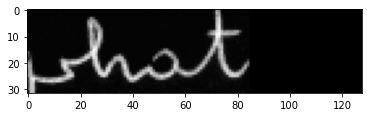



original_text =   to
predicted text = to

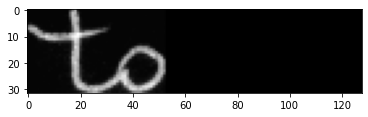



original_text =   do
predicted text = do

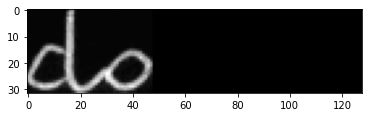



original_text =   if
predicted text = if

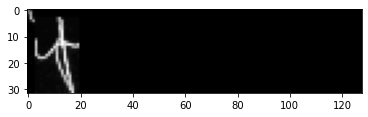



original_text =   the
predicted text = the

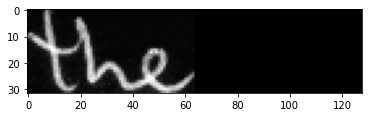



original_text =   British
predicted text = British

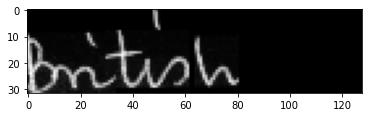



original_text =   Government
predicted text = Governnment

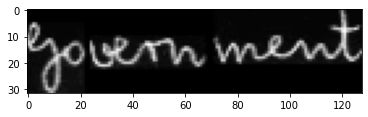



original_text =   in
predicted text = iin

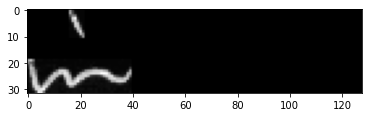



original_text =   to
predicted text = to

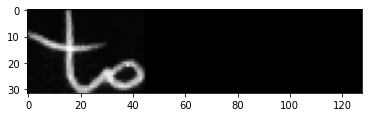



original_text =   Sir
predicted text = Sirx

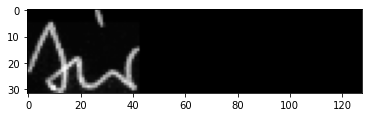



original_text =   Roy
predicted text = Roy

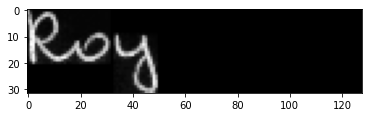



original_text =   and
predicted text = and

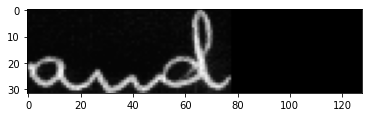



original_text =   the
predicted text = the

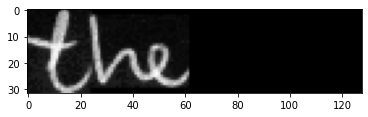



original_text =   talks
predicted text = talks

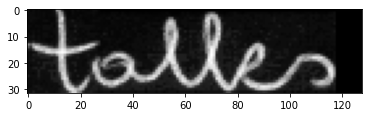



original_text =   fall
predicted text = fall

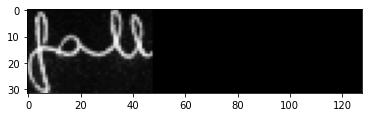



original_text =   through
predicted text = though

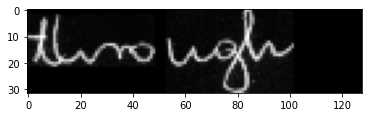



original_text =   There
predicted text = Thee

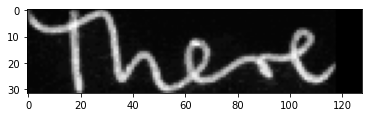



original_text =   are
predicted text = are

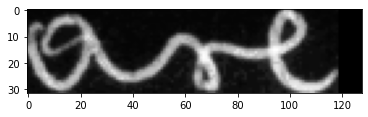



original_text =   bound
predicted text = boud

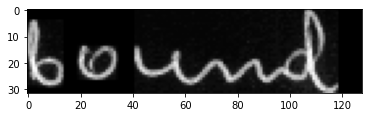



original_text =   chief
predicted text = chiefy

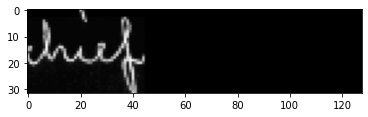



original_text =   aide
predicted text = wide

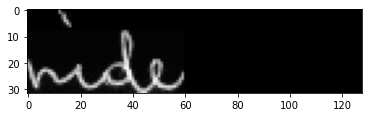



original_text =   ,
predicted text = ,

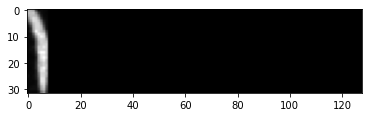



original_text =   Mr.
predicted text = Mr.

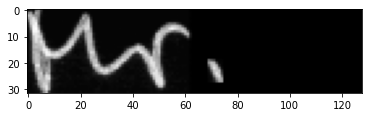



original_text =   Julius
predicted text = Jutius

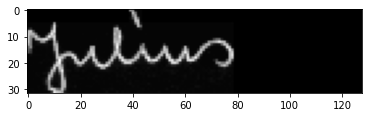



original_text =   Greenfield
predicted text = Geenfield

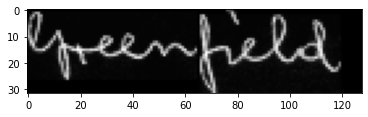



original_text =   ,
predicted text = ,

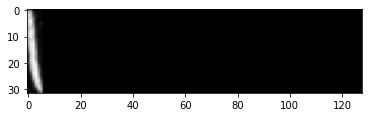



original_text =   telephoned
predicted text = telephoned

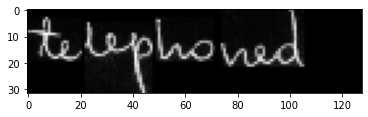



original_text =   chief
predicted text = chiet

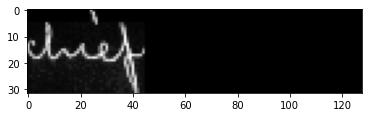



original_text =   a
predicted text = or

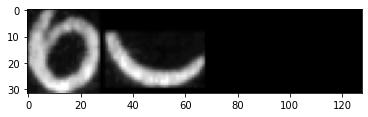



original_text =   report
predicted text = report

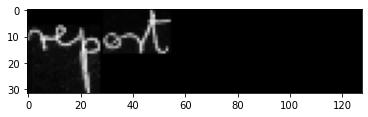



original_text =   on
predicted text = on

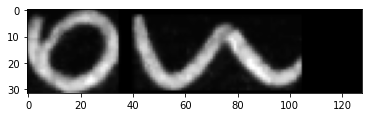



original_text =   his
predicted text = his

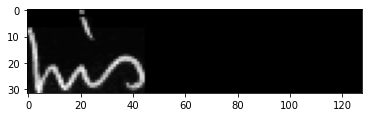



original_text =   talks
predicted text = talks

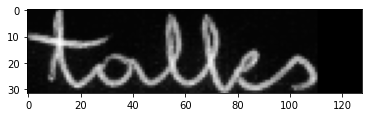



original_text =   with
predicted text = with

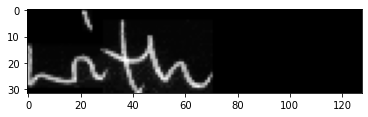



original_text =   Mr.
predicted text = Mr.

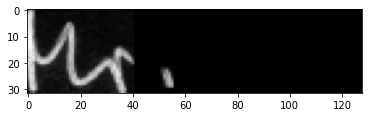



original_text =   Macmillan
predicted text = Macmillan

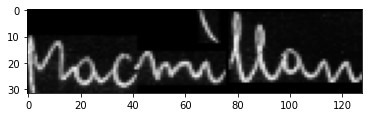



original_text =   Chequers
predicted text = Chequers

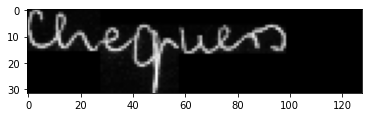



original_text =   .
predicted text = .

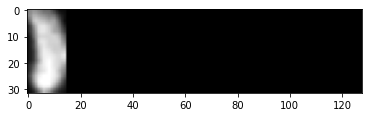



original_text =   Sir
predicted text = Sir

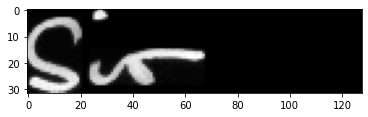



original_text =   Roy's
predicted text = Ray's

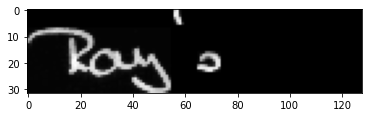



original_text =   United
predicted text = United

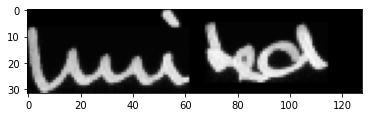



original_text =   Federal
predicted text = Federal

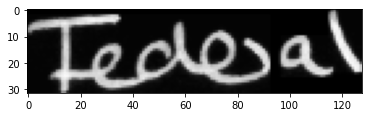



original_text =   Party
predicted text = Party

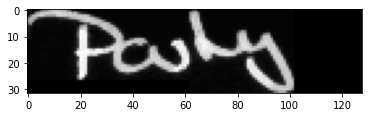



original_text =   is
predicted text = is

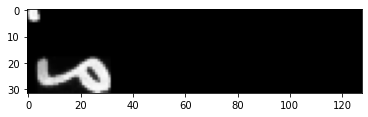



original_text =   boycotting
predicted text = boypatting

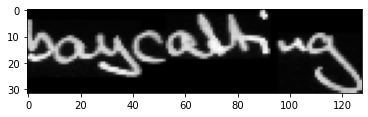



original_text =   London
predicted text = London

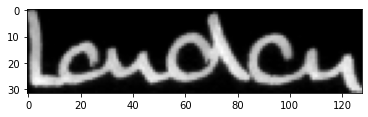



original_text =   talks
predicted text = talks

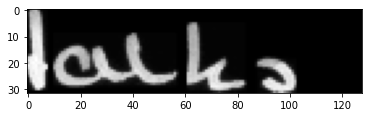



original_text =   on
predicted text = an

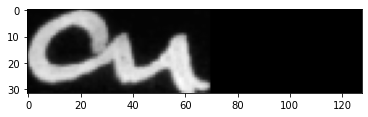



original_text =   the
predicted text = the

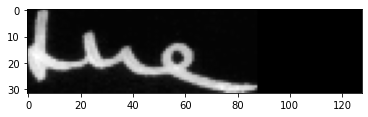



original_text =   last
predicted text = lask

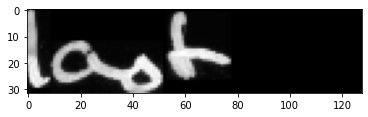



original_text =   night
predicted text = night

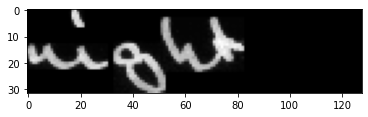



original_text =   :
predicted text = :

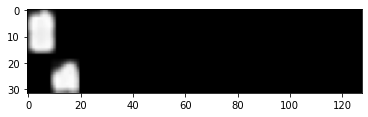



original_text =   "
predicted text = "

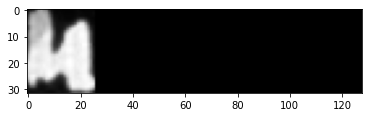



original_text =   We
predicted text = We

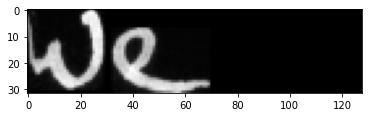



original_text =   want
predicted text = wout

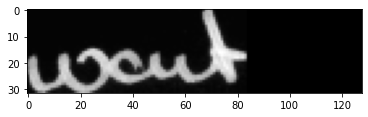



original_text =   to
predicted text = to

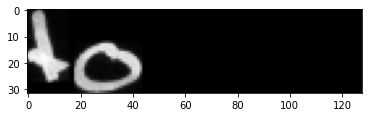

In [24]:
# predict outputs on validation images
prediction =act_model.predict(train_images[542:645])
 
# use CTC decoder
decoded = K.ctc_decode(prediction,   
                       input_length=np.ones(prediction.shape[0]) * prediction.shape[1],
                       greedy=True)[0][0]

out = K.get_value(decoded)

# see the results
for i, x in enumerate(out):
    print("original_text =  ", train_original_text[542+i])
    print("predicted text = ", end = '')
    for p in x:
        if int(p) != -1:
            print(char_list[int(p)], end = '')
    plt.imshow(train_images[542+i].reshape(32,128), cmap=plt.cm.gray)
    plt.show()
    print('\n')

## **Plot Accuracy and Loss**

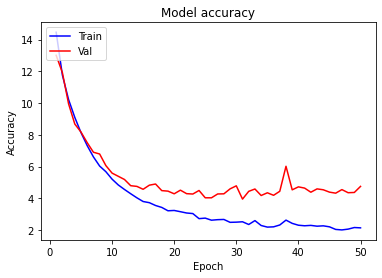

In [25]:
def plotgraph(epochs, acc, val_acc):
    # Plot training & validation accuracy values
    plt.plot(epochs, acc, 'b')
    plt.plot(epochs, val_acc, 'r')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1,len(loss)+1)
plotgraph(epochs, loss, val_loss)

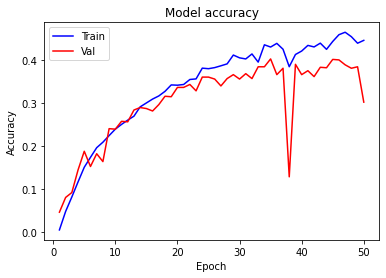

In [26]:
plotgraph(epochs, acc, val_acc)

## **Get Best Model Index**

In [27]:
minimum_val_loss = np.min(history.history['val_loss'])
best_model_index = np.where(history.history['val_loss'] == minimum_val_loss)[0][0]

best_loss = str(history.history['loss'][best_model_index])
best_acc = str(history.history['accuracy'][best_model_index])
best_val_loss = str(history.history['val_loss'][best_model_index])
best_val_acc = str(history.history['val_accuracy'][best_model_index])

In [28]:
with open('Model/history.txt', 'a') as f:
    new_data = '{},{},{},{},{},{},{},{},{},{}\n'.format(filepath, 
                                                      optimizer_name, 
                                                      str(RECORDS_COUNT), 
                                                      e, 
                                                      str(train_images.shape[0]),
                                                      str(valid_images.shape[0]), 
                                                      best_loss, 
                                                      best_acc, 
                                                      best_val_loss, 
                                                      best_val_acc)
    f.write(new_data)

## **Save the Model.**

In [29]:
model.save('Model/Text_recognizer_Using_CRNN.h5')